In [13]:
import os
import sys
import glob
import datetime

import gzip
import pickle

import numpy as np
import pandas as pd
import scipy 

# skew,kutosis
import padasip as pa
# https://matousc89.github.io/padasip/sources/filters/lms.html 

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import biosppy
from biosppy.signals import ecg
from scipy import signal
import pyhrv
import pyhrv.tools as tools
import pyhrv.time_domain as td

import heartpy as hp
from scipy.signal import resample
# import matplotlib as mpl
# # %matplotlib
# mpl.use('TkAgg')

In [17]:
# current work directory
path = os.path.abspath(os.getcwd())
print('경로:',path)
# directory file list
# file_list = glob.glob(path+ '/**/*.csv')

# research condition constants
DEVICES = ['H10', 'VERITY']
PROTOCOL = ['RESTING', 'MAST']

# time constant(s)
TIME_FORMAT = "%Y%m%d%H%M%S%f"
RESTING_TIME = [420]
MAST_TIME_TABLE = [300, 90, 45, 60, 60, 60, 90, 90, 45, 60]

# protocol constant
# REST = 1, COLD = 2, CACULATE = 3, EMPTY = 0 
MAST_PROTOCOL = [1,2,3,2,3,2,3,2,3,2]
MAST_PROTOCOL_NAME = {0:'EMPTY', 1:'BASELINE', 2: 'HIT', 3:'MA'}
# MAST_PROTOCOL = ['REST','COLD','CACUL','COLD','CACUL','COLD','CACUL','COLD','CACUL','COLD']
# MAST_PROTOCOL = [['REST'],['COLD'],['CACUL'],['COLD'],['CACUL'],['COLD'],['CACUL'],['COLD'],['CACUL'],['COLD']]

# devices constant
# 데이터 시간, 인덱스, ppg 센서 3개, ambient 센서, 수동 입력 marker
VERITY_COL = ['time', 'idx', 'ppg0', 'ppg1', 'ppg2', 'ambient', 'marker', 'proc']
VERITY_FS = 55
# 심박 ecg 센서
H10_COL = ['time', 'idx', 'sensor', 'marker', 'proc']
H10_FS = 130

# time interval caculation을 위한 
Z_list = [0]

경로: /home/pilab/workspace/Stress_sensor_data_processing


In [3]:
def file_search(path):
    '''
        Mast, Resting csv 파일 찾는 함수
        근데 이거 왜 만듬?
        
        path = 현재 작업 디렉토리 절대 위치
        
        파일 명명 로직:(F)_subject_day_time_sensor
    '''
    try:
        filenames = os.listdir(path)
        for filename in filenames:
            full_filename = os.path.join(path, filename)
            if filename == 'Mast':
                # mast_path = full_filename
                file_list_mast = sorted([f for f in os.listdir(full_filename) if f.startswith('(M)')])
            elif filename == 'Resting':
                # resting_path = full_filename
                file_list_resting = sorted([f for f in os.listdir(full_filename) if f.startswith('(H)')])
            else:
                pass 
        # return file_list_mast, file_list_resting, resting_path, mast_path
        return file_list_mast, file_list_resting
    
    except PermissionError:
        print('file search fail')
        pass
    
# file_list_mast, file_list_resting, resting_path, mast_path = file_search(path)
file_list_mast, file_list_resting = file_search(path)
# file_search(path)

In [4]:
def device_listing(file_list):
    '''
        기기 별 csv 파일 찾는 함수
        기기 별로 찾아야 할지, 피험자 별로 찾아야할지 아직 모르겠음, 둘다 해야겠지?
        
        파일 명명 로직:(F)_subject_day_time_sensor
    '''
    # polar sensor data list
    try:
        if file_list[0][:3] == ('(H)'):
            print('Resting data')
        elif file_list[0][:3] == ('(M)'):
            print('Mast data')
            
        file_list_h10 = sorted([f for f in file_list if f.endswith('H10.csv')])
        file_list_verity = sorted([f for f in file_list if f.endswith('Verity.csv')])
        print('Got list')
    except:
        print('wrong list or files')

    return {'h10':file_list_h10, 'verity': file_list_verity}
    

resting_device_dict = device_listing(file_list_resting)
mast_device_dict = device_listing(file_list_mast)

Resting data
Got list
Mast data
Got list


In [5]:
def id_listing():
    return
# print('*** Rest h10 데이터:',rest_file_list_h10)
print('h10 데이터 개수',len(mast_device_dict['h10']),'개')
# print('*** Rest verity 데이터:',rest_file_list_verity)
print('verity 데이터 개수',len(mast_device_dict['verity']),'개')

# 파일 별  분석하려고 대충 보고 있는 for loop
if len(mast_device_dict['h10']) == len(mast_device_dict['verity']):
    print('Number of Data equl')
#     i = 1
#     for h10, verity in zip(rest_file_list_h10, rest_file_list_verity):
        
#         print()
#         print(f'{i}-1:',h10)
#         print('ID:',h10[3:6])
#         print('Date:',h10[7:22])

#         print(f'{i}-2:',verity)
#         print('ID:',verity[3:6])
#         print('Date:',verity[7:22])
        
#         i += 1
else:
    print('expected data missing')

h10 데이터 개수 21 개
verity 데이터 개수 21 개
Number of Data equl


In [6]:
def date_data_load(device_file_dict = {}, date = '20230101', task = 'resting'):
    date_h10_dict = {}
    date_verity_dict = {}
    if task == 'resting':
        task_path = path + '/Resting/'
    else:
        task_path = path + '/Mast/'
    
    for i in device_file_dict:
        if i == 'h10':
            date_h10 = [data for data in device_file_dict[i] if date in data]
        elif i == 'verity':
            date_verity = [data for data in device_file_dict[i] if date in data]
        else:
            print('someting is wrong')
            
    print('Data Loading...')
    for df in  date_h10:
        date_h10_dict[df] = pd.read_csv(task_path + df, names = H10_COL)
    for df in  date_verity:
        date_verity_dict[df] = pd.read_csv(task_path + df, names = VERITY_COL)
    print('Data Load complete')

    print(f'{date} - H10 데이터: {len(date_h10_dict)} 개')
    print(f'{date} - Verity 데이터: {len(date_verity_dict)} 개')
            
    return {'h10_dict': date_h10_dict, 'verity_dict': date_verity_dict}


# rest_h10_dict, rest_verity_dict =  date_listing(rest_file_list_h10, rest_file_list_verity)
# dir(rest_file_list_h10)
mast_date_dict_list = date_data_load(mast_device_dict, '20230507', 'mast')

Data Loading...
Data Load complete
20230507 - H10 데이터: 20 개
20230507 - Verity 데이터: 20 개


In [7]:
print(path)
'''
'CID', = cid
'워치번호', = wid
'심박 실시일자', = resting_date
'조사실(스트랩 넘버)예. 220호(2번)', = resting_room
'키', - height
'몸무게', - weight
'신체/심박 특이사항 (조사 컨디션 상세하게 작성)', = p_note
'MAST실시일자(23-05-06 10:00)', = mast_date
'조사실(스트랩 넘버)예. 220호(4번)', = mast_room
'마지막 음식 섭취 시간', = ate_time
'M0 타액 채취 시간', = m0
'T(실험 시작 시간)##:##:00초 기준', = t
'M1 타액 채취 시간', = m1
'M2 타액 채취 시간', = m2
'MAST 특이사항', = m_note
'M3 타액 채취 시간', = m3
'M4 타액 채취 시간', = m4
'M5 타액 채취 시간', = m5
'M6 타액 채취 시간', = m6
'채취실 특이사항' = etc
'''
tmp = pd.DataFrame(columns = ['id', 'mast_start_time'])
protocol_cols = ['id', 'wid', 'resting_date', 'resting_room', 'height', 'weight',
       'p_note', 'mast_date', 'mast_room', 'ate_time', 'M0', 't', 'M1', 'M2', 'm_note', 'M3', 'M4', 'M5', 'M6', 'etc']
protocol_data = pd.read_csv(path + '/현장조사 기록지(통합).csv', header = 2, names = protocol_cols)
for i, v in protocol_data.iterrows():
    if type(v.mast_date) == str:
        t_time = datetime.datetime.strptime(v.mast_date +'-'+ v.t, '%y-%m-%d-%H:%M')
        t_start_time = t_time - datetime.timedelta(minutes = 5)
        row = pd.DataFrame({'id':[v.id], 'mast_start_time':[t_start_time]})
    else:
        t_start_time = None
        pass
    
    tmp = pd.concat([tmp, row]).drop_duplicates().reset_index(drop=True)
    
protocol_data = pd.merge(protocol_data,tmp, on = 'id')
task_time = protocol_data[['id','t', 'mast_start_time']]
print(task_time)

/home/pilab/workspace/Stress_sensor_data_processing
    id      t     mast_start_time
0    1   9:48 2023-05-07 09:43:00
1    2  10:44 2023-05-07 10:39:00
2    3   9:12 2023-05-07 09:07:00
3    4   9:44 2023-05-07 09:39:00
4    5  11:49 2023-05-07 11:44:00
5    6  11:16 2023-05-07 11:11:00
6    7  11:15 2023-05-07 11:10:00
7    8  11:45 2023-05-07 11:40:00
8    9   9:58 2023-05-07 09:53:00
9   10  10:44 2023-05-07 10:39:00
10  11  12:15 2023-05-07 12:10:00
11  12   9:40 2023-05-07 09:35:00
12  13  11:45 2023-05-07 11:40:00
13  14   9:55 2023-05-07 09:50:00
14  16   9:10 2023-05-07 09:05:00
15  17  11:14 2023-05-07 11:09:00
16  18  10:21 2023-05-07 10:16:00
17  19  10:17 2023-05-07 10:12:00
18  20  12:37 2023-05-07 12:32:00


In [9]:
# Data check 1
for i in mast_date_dict_list:
    try:
        with gzip.open(f'./pkl/{i}_mast.pickle','rb') as f:
            df = pickle.load(f)
    except:
        pass
    if len(df) == 0 :
        df = pd.DataFrame(columns = ['id', 'date', 'protocol', 'device', 'start', 'end', 'total', 'avg', 'fs'])
    # print(df)

    for j in mast_date_dict_list[i]:
        # print(j)
        if j.endswith('H10.csv'):
            # print('H10 모양 :', mast_date_dict_list[i][j].shape)
            h10_rows, h10_columns = mast_date_dict_list[i][j].shape
            if h10_columns == 4:
                # print('H10 Data columns length is correct')
                pass
            else:
                break
                print('H10 Data columns length is Not correct')
        elif j.endswith('Verity.csv'):
            # print('verity 모양 :', mast_date_dict_list[i][j].shape)
            verity_rows, verity_columns = mast_date_dict_list[i][j].shape
            if verity_columns == 7:
                # print('Verity sensor Data columns length is correct')
                pass
            else:
                break
                print('Verity sensor Data columns length is Not correct')
    print(i + ' OK!')
    
    for j in mast_date_dict_list[i]:
        print(j)
        mast_date_dict_list[i][j]['times'] = pd.to_datetime(mast_date_dict_list[i][j]['time'], 
                                                               format = TIME_FORMAT)
        mast_date_dict_list[i][j]['interval'] = \
            Z_list + [mast_date_dict_list[i][j]['times'].loc[k+1]-mast_date_dict_list[i][j]['times'].loc[k] 
                      for k in range(len(mast_date_dict_list[i][j])-1)]
        
        mast_start_time = mast_date_dict_list[i][j].iloc[0][-2]
        mast_end_time = mast_date_dict_list[i][j].iloc[-1][-2]
        mast_total_time = mast_end_time-mast_start_time
        mast_time_resolution = (mast_end_time-mast_start_time)/ len(mast_date_dict_list[i][j])
        mast_fs = 1/ mast_time_resolution.total_seconds()
        
        print('Time domain window')
        print('시작 시간:',mast_start_time, '종료 시간:',mast_end_time, '총 측정 시간:', mast_total_time)
        
        if 20 <= abs(mast_total_time.total_seconds()-MAST_TIME_TABLE[0]):
            print('Wrong measurement time')

        print('해상도:', mast_time_resolution, 'fs:', mast_fs)

        row = pd.DataFrame({'id':[j[3:6]], 'date':[j[7:22]], 'protocol':[j[1:2]], 'device':[j[23:-4]], 
                        'start':[mast_start_time], 'end':[mast_end_time], 'total':[mast_total_time],
                        'avg':[mast_time_resolution], 'fs':[mast_fs]})
        df = pd.concat([df, row]).drop_duplicates().reset_index(drop=True)
        
#         if 'h10' in i:

#             if mast_fs <= 0.07693 and mast_fs >= 0.07692:
#                 # print("Hz correct.")
#                 pass
#             else:
#                 print("Hz Error!!!!")
#         else:
#             print('해상도:', mast_time_resolution, 'fs:', mast_fs)
#             if rest_h10_fs <= 0.018182 and rest_h10_fs >= 18181:
#                 # print("Hz correct.")
#                 pass
#             else:
#                 print("Hz Error!!!!")
        # print('interval data...')
        # print(mast_date_dict_list[i][j]['interval'])
            # time col datatype cast to datetime 

        print('----------------------------------------------------------------------')

    if 'h10' in i:
        mast_h10_dict = mast_date_dict_list[i]
    else:
        mast_verity_dict = mast_date_dict_list[i]
    
    with gzip.open(f'./pkl/{i}_mast.pickle', 'wb') as f:
        pickle.dump(df, f)

     id             date protocol device                      start   
0   001  20230429_091641        H    H10 2023-04-29 09:16:41.348517  \
1   002  20230429_102726        H    H10 2023-04-29 10:27:26.020477   
2   003  20230429_105826        H    H10 2023-04-29 10:58:26.132409   
3   004  20230429_100701        H    H10 2023-04-29 10:07:01.448371   
4   005  20230429_120717        H    H10 2023-04-29 12:07:17.070825   
5   006  20230429_115029        H    H10 2023-04-29 11:50:29.634417   
6   007  20230429_115342        H    H10 2023-04-29 11:53:42.055732   
7   008  20230429_111204        H    H10 2023-04-29 11:12:04.273611   
8   009  20230429_112014        H    H10 2023-04-29 11:20:14.607300   
9   010  20230429_114546        H    H10 2023-04-29 11:45:46.576317   
10  011  20230429_122611        H    H10 2023-04-29 12:26:11.472811   
11  012  20230429_091307        H    H10 2023-04-29 09:13:07.630257   
12  013  20230429_130300        H    H10 2023-04-29 13:03:00.180001   
13  01

In [10]:
with gzip.open(f'./pkl/verity_dict_mast.pickle','rb') as f:
    df = pickle.load(f)
df['id'] = pd.to_numeric(df['id'], downcast = 'integer')
df = pd.merge(df, task_time, how = 'outer', on = 'id')
# df = pd.concat([df, task_time], axis = 1)

In [21]:
# pd.set_option('display.max_row', None)
# pd.set_option('display.max_columns', None)
# print(mast_h10['interval'])

In [22]:
# index to time 사실 필요없고 오히려 방해됨... 수정 필수
# mast_h10 = mast_h10.set_index('times')
# mast_verity = mast_verity.set_index('times')
# sns.set(rc={'figure.figsize':(11, 4)})

In [23]:
def reject_outliers(sr, iq_range=0.5):
    pcnt = (1 - iq_range) / 2
    qlow, median, qhigh = sr.dropna().quantile([pcnt, 0.50, 1-pcnt])
    iqr = qhigh - qlow
    return sr[ (sr - median).abs() <= iqr]

(M)001_20230507_093641_Verity.csv
전체 인덱스 길이: 13854
시작 시간: 2023-05-07 09:43:00
시작 인덱스 값: nan
기간 리스트: [Timestamp('2023-05-07 09:43:00'), Timestamp('2023-05-07 09:48:00'), Timestamp('2023-05-07 09:49:30'), Timestamp('2023-05-07 09:50:15'), Timestamp('2023-05-07 09:51:15'), Timestamp('2023-05-07 09:52:15'), Timestamp('2023-05-07 09:53:15'), Timestamp('2023-05-07 09:54:45'), Timestamp('2023-05-07 09:56:15'), Timestamp('2023-05-07 09:57:00'), Timestamp('2023-05-07 09:58:00')]
각 섹터 길이: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
각 섹터: [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]


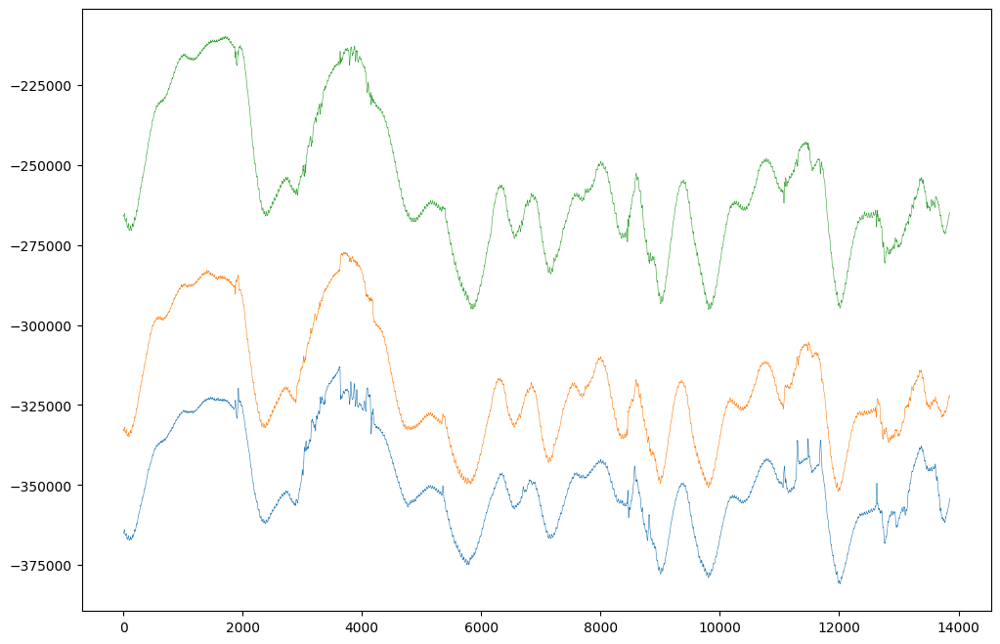

(M)001_20230507_094057_Verity.csv
전체 인덱스 길이: 60755
시작 시간: 2023-05-07 09:43:00
시작 인덱스 값: 6737
기간 리스트: [Timestamp('2023-05-07 09:43:00'), Timestamp('2023-05-07 09:48:00'), Timestamp('2023-05-07 09:49:30'), Timestamp('2023-05-07 09:50:15'), Timestamp('2023-05-07 09:51:15'), Timestamp('2023-05-07 09:52:15'), Timestamp('2023-05-07 09:53:15'), Timestamp('2023-05-07 09:54:45'), Timestamp('2023-05-07 09:56:15'), Timestamp('2023-05-07 09:57:00'), Timestamp('2023-05-07 09:58:00')]
각 섹터 길이: [16497, 4949, 2475, 3300, 3299, 3300, 4949, 4949, 2475, 3300]
각 섹터: [6737, 23234, 28183, 30658, 33958, 37257, 40557, 45506, 50455, 52930, 56230]


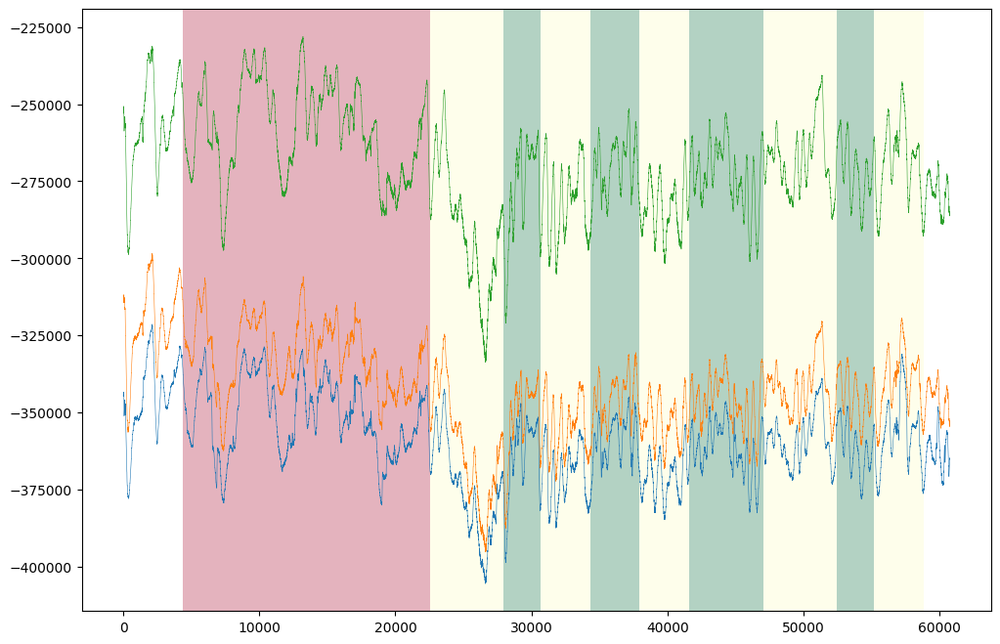

(M)002_20230507_103326_Verity.csv
전체 인덱스 길이: 77236
시작 시간: 2023-05-07 10:39:00
시작 인덱스 값: 18301
기간 리스트: [Timestamp('2023-05-07 10:39:00'), Timestamp('2023-05-07 10:44:00'), Timestamp('2023-05-07 10:45:30'), Timestamp('2023-05-07 10:46:15'), Timestamp('2023-05-07 10:47:15'), Timestamp('2023-05-07 10:48:15'), Timestamp('2023-05-07 10:49:15'), Timestamp('2023-05-07 10:50:45'), Timestamp('2023-05-07 10:52:15'), Timestamp('2023-05-07 10:53:00'), Timestamp('2023-05-07 10:54:00')]
각 섹터 길이: [16481, 4945, 2473, 3297, 3298, 3297, 4947, 4946, 2474, 3297]
각 섹터: [18301, 34782, 39727, 42200, 45497, 48795, 52092, 57039, 61985, 64459, 67756]


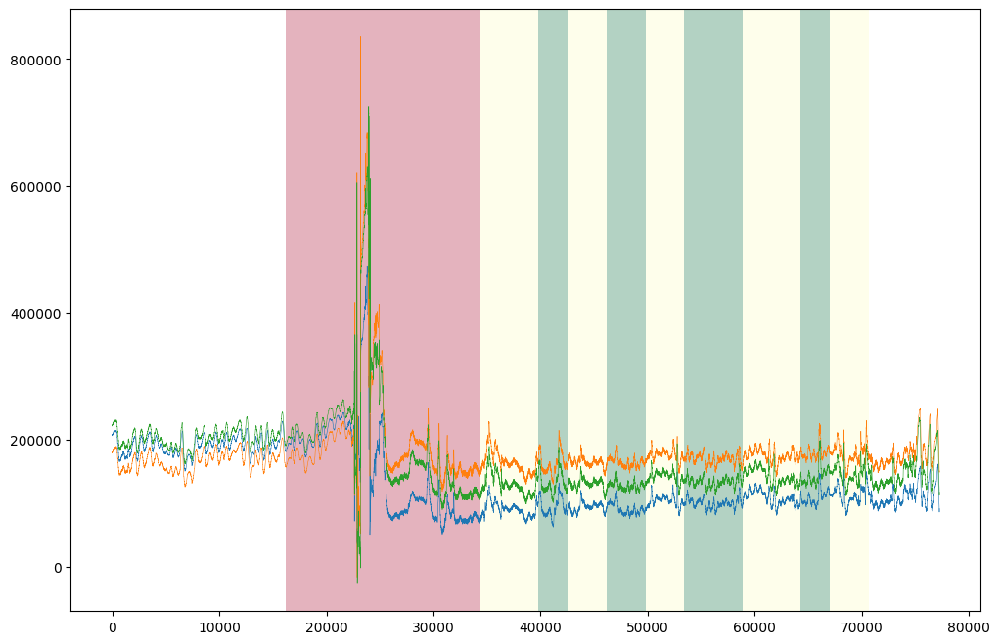

(M)003_20230507_090129_Verity.csv
전체 인덱스 길이: 77088
시작 시간: 2023-05-07 09:07:00
시작 인덱스 값: 18155
기간 리스트: [Timestamp('2023-05-07 09:07:00'), Timestamp('2023-05-07 09:12:00'), Timestamp('2023-05-07 09:13:30'), Timestamp('2023-05-07 09:14:15'), Timestamp('2023-05-07 09:15:15'), Timestamp('2023-05-07 09:16:15'), Timestamp('2023-05-07 09:17:15'), Timestamp('2023-05-07 09:18:45'), Timestamp('2023-05-07 09:20:15'), Timestamp('2023-05-07 09:21:00'), Timestamp('2023-05-07 09:22:00')]
각 섹터 길이: [16500, 4950, 2475, 3300, 3300, 3301, 4949, 4950, 2475, 3300]
각 섹터: [18155, 34655, 39605, 42080, 45380, 48680, 51981, 56930, 61880, 64355, 67655]


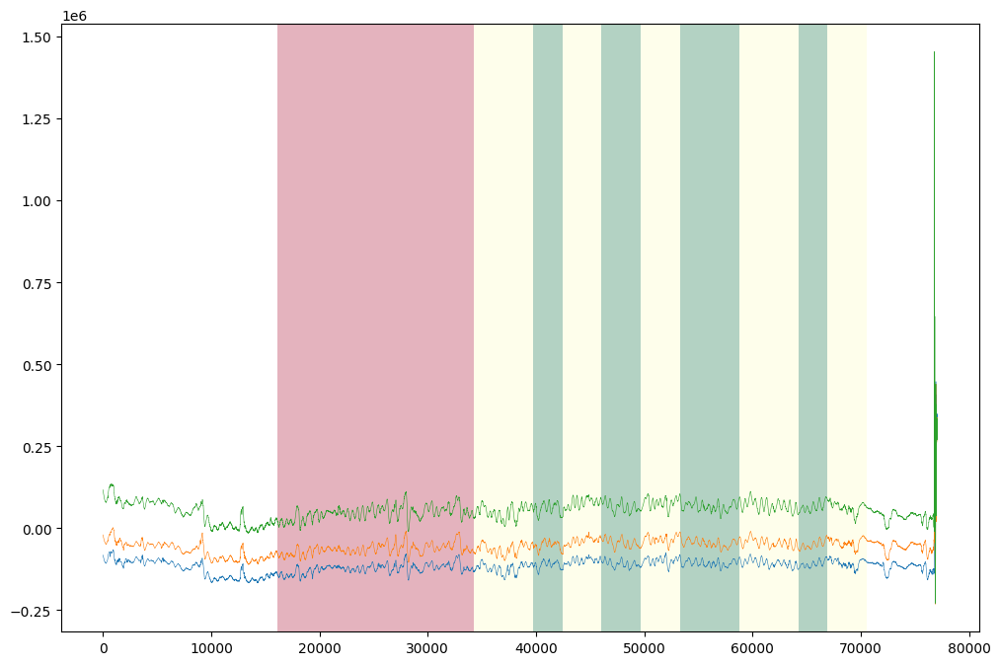

(M)004_20230507_093440_Verity.csv
전체 인덱스 길이: 65531
시작 시간: 2023-05-07 09:39:00
시작 인덱스 값: 14267
기간 리스트: [Timestamp('2023-05-07 09:39:00'), Timestamp('2023-05-07 09:44:00'), Timestamp('2023-05-07 09:45:30'), Timestamp('2023-05-07 09:46:15'), Timestamp('2023-05-07 09:47:15'), Timestamp('2023-05-07 09:48:15'), Timestamp('2023-05-07 09:49:15'), Timestamp('2023-05-07 09:50:45'), Timestamp('2023-05-07 09:52:15'), Timestamp('2023-05-07 09:53:00'), Timestamp('2023-05-07 09:54:00')]
각 섹터 길이: [16477, 4944, 2472, 3296, 3296, 3296, 4944, 4944, 2472, 3297]
각 섹터: [14267, 30744, 35688, 38160, 41456, 44752, 48048, 52992, 57936, 60408, 63705]


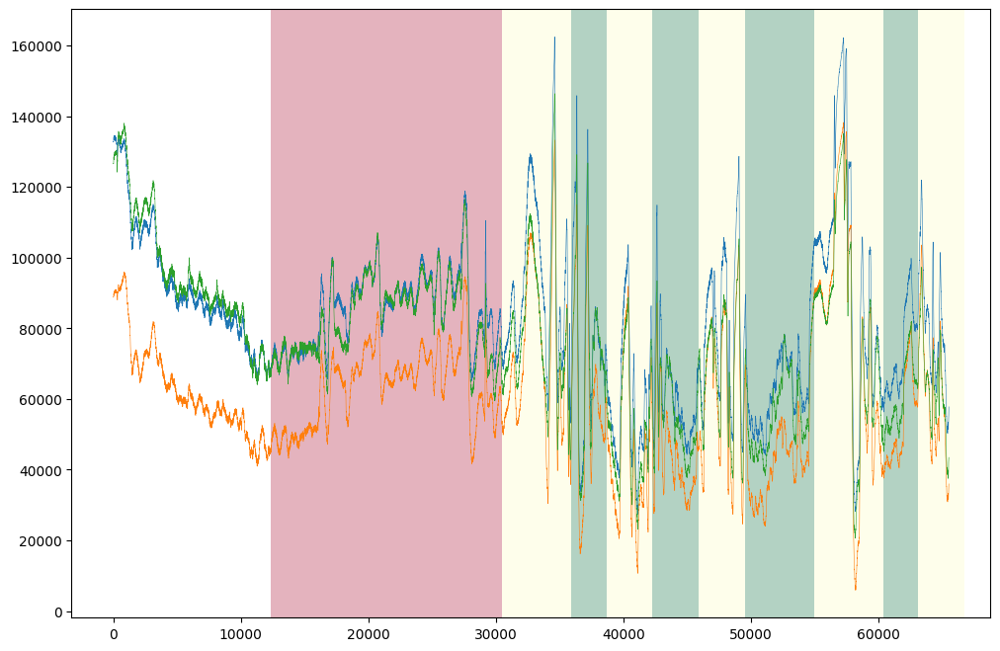

(M)005_20230507_113956_Verity.csv
전체 인덱스 길이: 66573
시작 시간: 2023-05-07 11:44:00
시작 인덱스 값: 13373
기간 리스트: [Timestamp('2023-05-07 11:44:00'), Timestamp('2023-05-07 11:49:00'), Timestamp('2023-05-07 11:50:30'), Timestamp('2023-05-07 11:51:15'), Timestamp('2023-05-07 11:52:15'), Timestamp('2023-05-07 11:53:15'), Timestamp('2023-05-07 11:54:15'), Timestamp('2023-05-07 11:55:45'), Timestamp('2023-05-07 11:57:15'), Timestamp('2023-05-07 11:58:00'), Timestamp('2023-05-07 11:59:00')]
각 섹터 길이: [16496, 4949, 2474, 3299, 3300, 3299, 4950, 4949, 2474, 3300]
각 섹터: [13373, 29869, 34818, 37292, 40591, 43891, 47190, 52140, 57089, 59563, 62863]


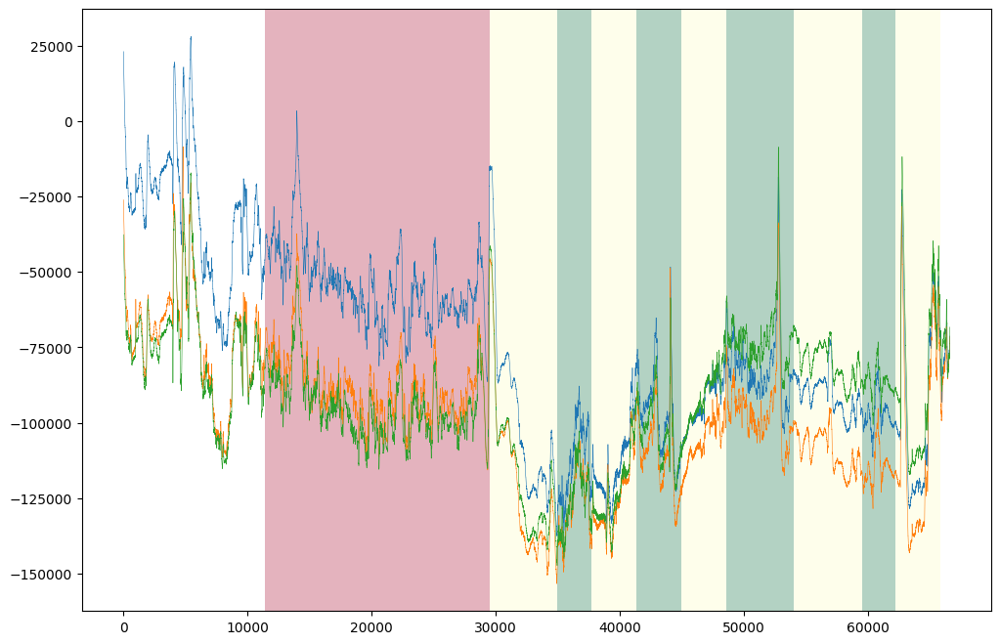

(M)006_20230507_110506_Verity.csv
전체 인덱스 길이: 69891
시작 시간: 2023-05-07 11:11:00
시작 인덱스 값: 19414
기간 리스트: [Timestamp('2023-05-07 11:11:00'), Timestamp('2023-05-07 11:16:00'), Timestamp('2023-05-07 11:17:30'), Timestamp('2023-05-07 11:18:15'), Timestamp('2023-05-07 11:19:15'), Timestamp('2023-05-07 11:20:15'), Timestamp('2023-05-07 11:21:15'), Timestamp('2023-05-07 11:22:45'), Timestamp('2023-05-07 11:24:15'), Timestamp('2023-05-07 11:25:00'), Timestamp('2023-05-07 11:26:00')]
각 섹터 길이: [16496, 4949, 2475, 3299, 3300, 3300, 4949, 4949, 2475, 3299]
각 섹터: [19414, 35910, 40859, 43334, 46633, 49933, 53233, 58182, 63131, 65606, 68905]


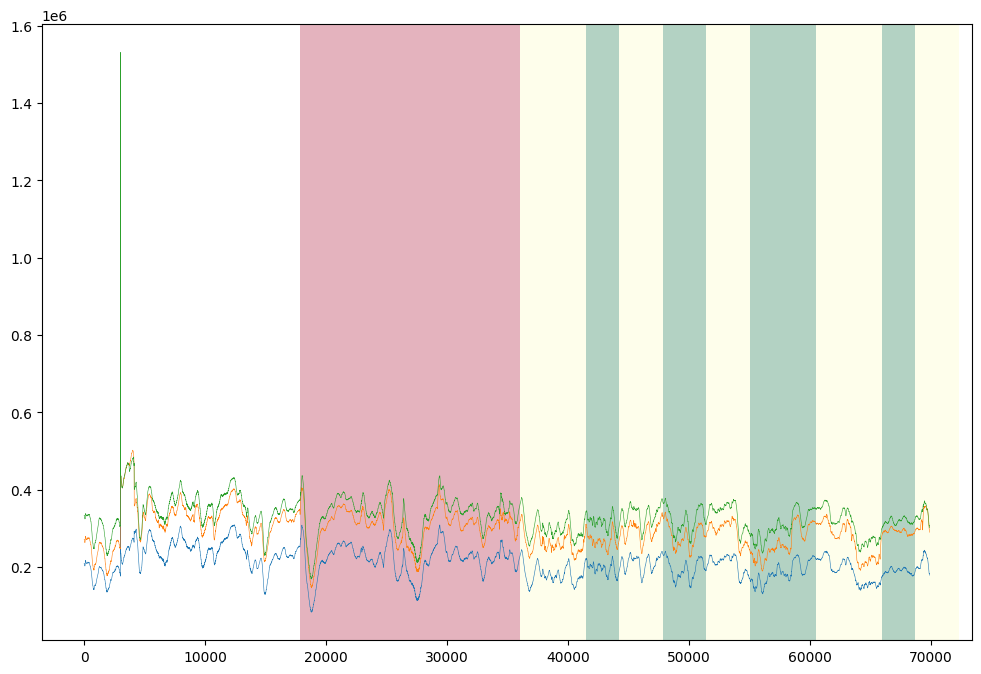

(M)007_20230507_110503_Verity.csv
전체 인덱스 길이: 75553
시작 시간: 2023-05-07 11:10:00
시작 인덱스 값: 16299
기간 리스트: [Timestamp('2023-05-07 11:10:00'), Timestamp('2023-05-07 11:15:00'), Timestamp('2023-05-07 11:16:30'), Timestamp('2023-05-07 11:17:15'), Timestamp('2023-05-07 11:18:15'), Timestamp('2023-05-07 11:19:15'), Timestamp('2023-05-07 11:20:15'), Timestamp('2023-05-07 11:21:45'), Timestamp('2023-05-07 11:23:15'), Timestamp('2023-05-07 11:24:00'), Timestamp('2023-05-07 11:25:00')]
각 섹터 길이: [16480, 4945, 2472, 3296, 3296, 3297, 4944, 4945, 2472, 3297]
각 섹터: [16299, 32779, 37724, 40196, 43492, 46788, 50085, 55029, 59974, 62446, 65743]


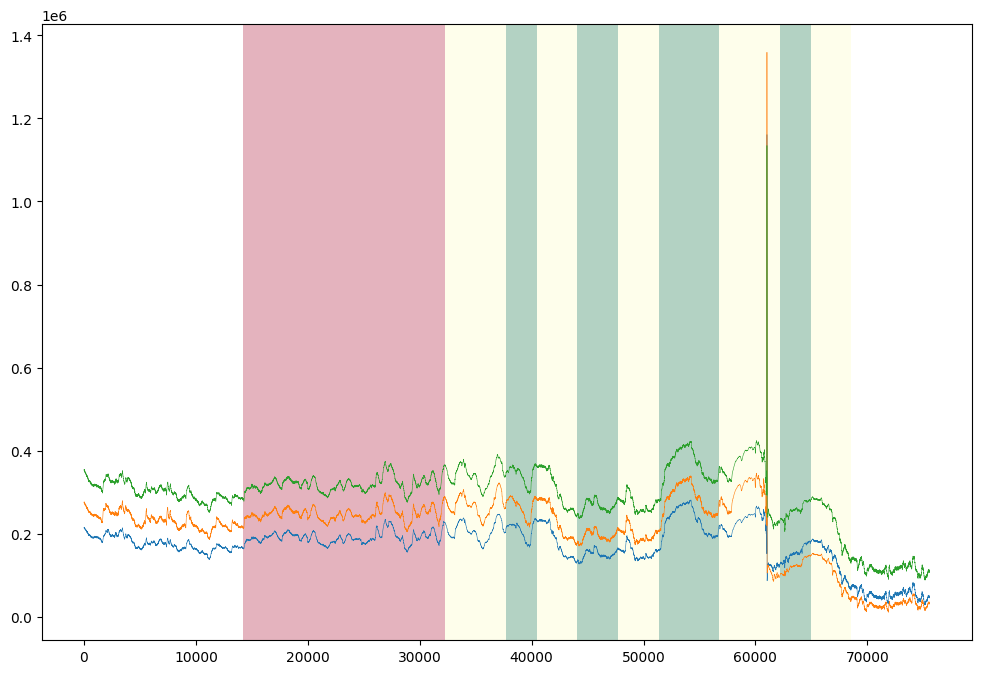

(M)008_20230507_113824_Verity.csv
전체 인덱스 길이: 82108
시작 시간: 2023-05-07 11:40:00
시작 인덱스 값: 5271
기간 리스트: [Timestamp('2023-05-07 11:40:00'), Timestamp('2023-05-07 11:45:00'), Timestamp('2023-05-07 11:46:30'), Timestamp('2023-05-07 11:47:15'), Timestamp('2023-05-07 11:48:15'), Timestamp('2023-05-07 11:49:15'), Timestamp('2023-05-07 11:50:15'), Timestamp('2023-05-07 11:51:45'), Timestamp('2023-05-07 11:53:15'), Timestamp('2023-05-07 11:54:00'), Timestamp('2023-05-07 11:55:00')]
각 섹터 길이: [16485, 4945, 2473, 3297, 3298, 3296, 4946, 4946, 2473, 3297]
각 섹터: [5271, 21756, 26701, 29174, 32471, 35769, 39065, 44011, 48957, 51430, 54727]


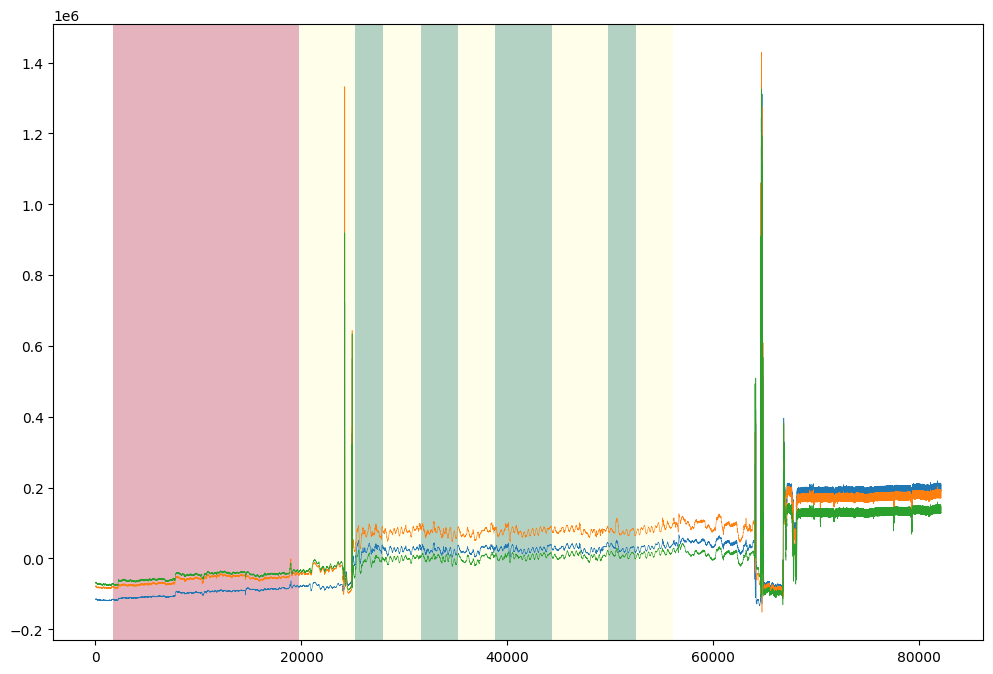

(M)009_20230507_095758_Verity.csv
전체 인덱스 길이: 42341
unknown error
시작 시간: 2023-05-07 09:53:00
시작 인덱스 값: 5271
기간 리스트: [Timestamp('2023-05-07 09:53:00'), Timestamp('2023-05-07 09:58:00'), Timestamp('2023-05-07 09:59:30'), Timestamp('2023-05-07 10:00:15'), Timestamp('2023-05-07 10:01:15'), Timestamp('2023-05-07 10:02:15'), Timestamp('2023-05-07 10:03:15'), Timestamp('2023-05-07 10:04:45'), Timestamp('2023-05-07 10:06:15'), Timestamp('2023-05-07 10:07:00'), Timestamp('2023-05-07 10:08:00')]
각 섹터 길이: [64, 4945, 2473, 3296, 3297, 3297, 4945, 4946, 2472, 3297]
각 섹터: [5271, 5335, 10280, 12753, 16049, 19346, 22643, 27588, 32534, 35006, 38303]


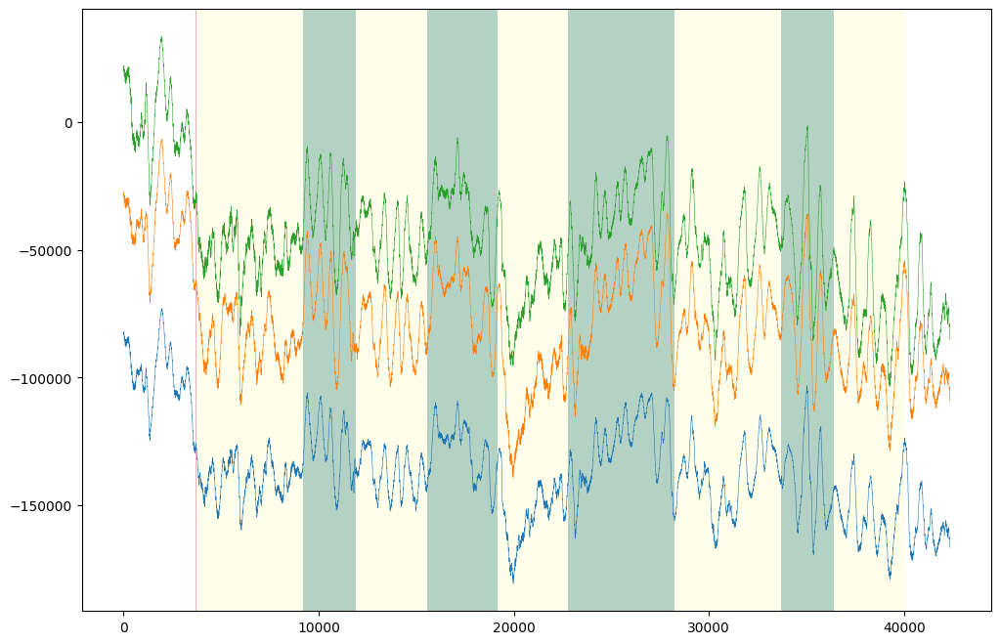

(M)010_20230507_103416_Verity.csv
전체 인덱스 길이: 72645
시작 시간: 2023-05-07 10:39:00
시작 인덱스 값: 15531
기간 리스트: [Timestamp('2023-05-07 10:39:00'), Timestamp('2023-05-07 10:44:00'), Timestamp('2023-05-07 10:45:30'), Timestamp('2023-05-07 10:46:15'), Timestamp('2023-05-07 10:47:15'), Timestamp('2023-05-07 10:48:15'), Timestamp('2023-05-07 10:49:15'), Timestamp('2023-05-07 10:50:45'), Timestamp('2023-05-07 10:52:15'), Timestamp('2023-05-07 10:53:00'), Timestamp('2023-05-07 10:54:00')]
각 섹터 길이: [16447, 4934, 2467, 3290, 3289, 3290, 4933, 4934, 2467, 3289]
각 섹터: [15531, 31978, 36912, 39379, 42669, 45958, 49248, 54181, 59115, 61582, 64871]


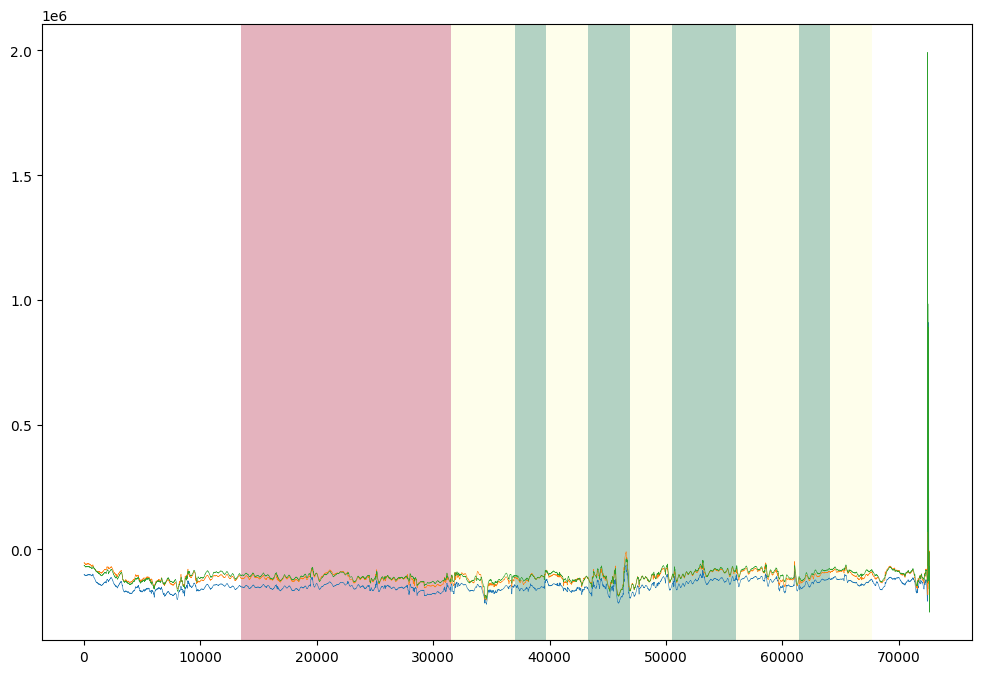

(M)011_20230507_120541_Verity.csv
전체 인덱스 길이: 76110
시작 시간: 2023-05-07 12:10:00
시작 인덱스 값: 14201
기간 리스트: [Timestamp('2023-05-07 12:10:00'), Timestamp('2023-05-07 12:15:00'), Timestamp('2023-05-07 12:16:30'), Timestamp('2023-05-07 12:17:15'), Timestamp('2023-05-07 12:18:15'), Timestamp('2023-05-07 12:19:15'), Timestamp('2023-05-07 12:20:15'), Timestamp('2023-05-07 12:21:45'), Timestamp('2023-05-07 12:23:15'), Timestamp('2023-05-07 12:24:00'), Timestamp('2023-05-07 12:25:00')]
각 섹터 길이: [16483, 4945, 2473, 3296, 3297, 3297, 4946, 4946, 2473, 3297]
각 섹터: [14201, 30684, 35629, 38102, 41398, 44695, 47992, 52938, 57884, 60357, 63654]


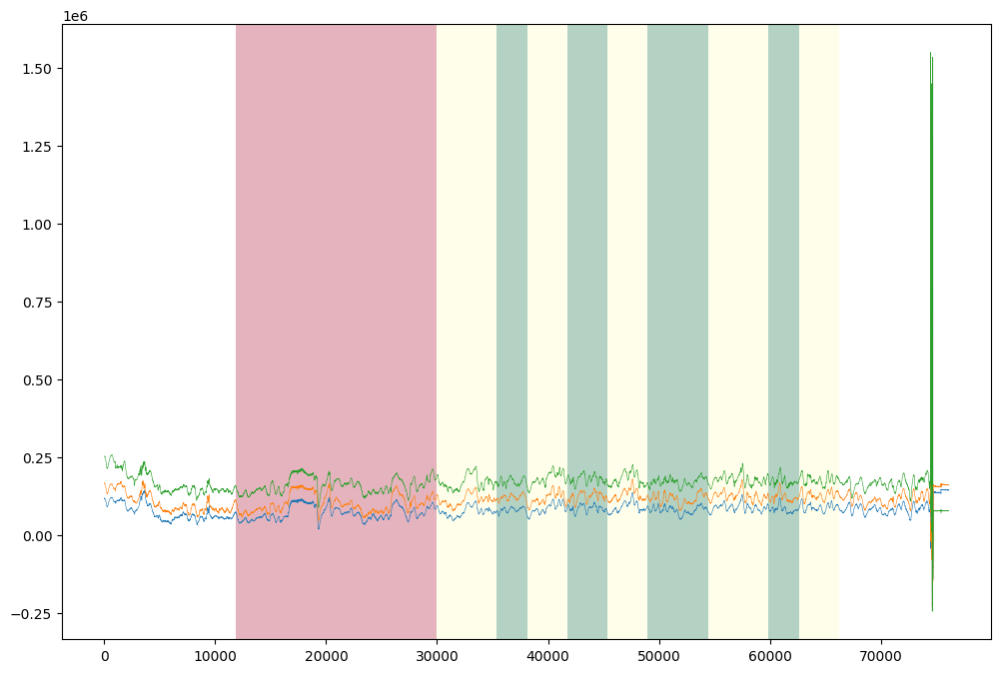

(M)012_20230507_093010_Verity.csv
전체 인덱스 길이: 72631
시작 시간: 2023-05-07 09:35:00
시작 인덱스 값: 15839
기간 리스트: [Timestamp('2023-05-07 09:35:00'), Timestamp('2023-05-07 09:40:00'), Timestamp('2023-05-07 09:41:30'), Timestamp('2023-05-07 09:42:15'), Timestamp('2023-05-07 09:43:15'), Timestamp('2023-05-07 09:44:15'), Timestamp('2023-05-07 09:45:15'), Timestamp('2023-05-07 09:46:45'), Timestamp('2023-05-07 09:48:15'), Timestamp('2023-05-07 09:49:00'), Timestamp('2023-05-07 09:50:00')]
각 섹터 길이: [16442, 4933, 2466, 3289, 3288, 3289, 4932, 4933, 2466, 3289]
각 섹터: [15839, 32281, 37214, 39680, 42969, 46257, 49546, 54478, 59411, 61877, 65166]


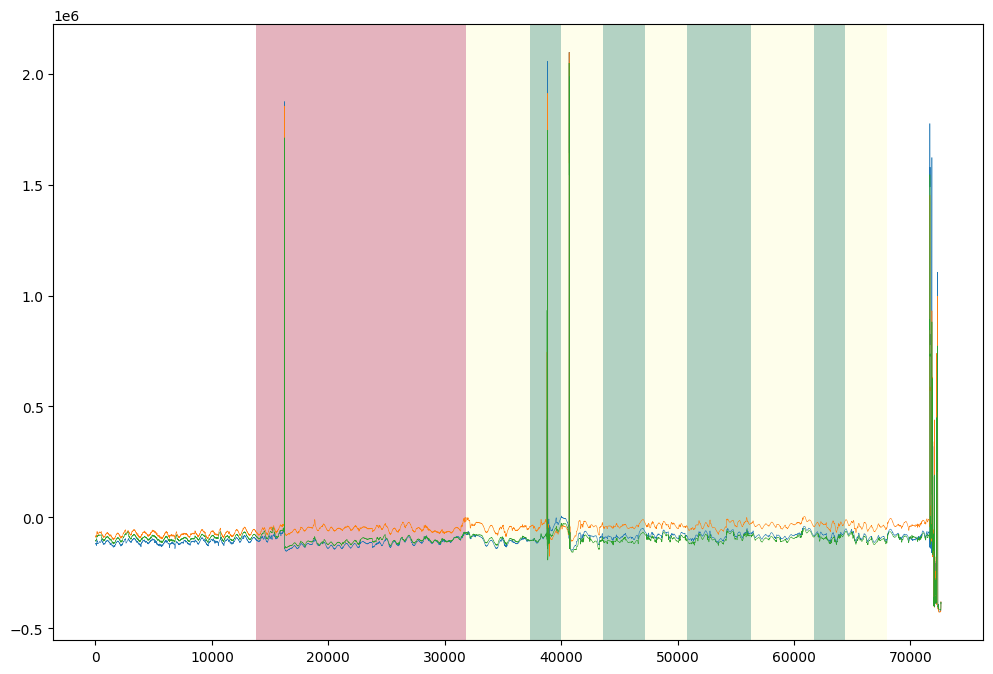

(M)013_20230507_113448_Verity.csv
전체 인덱스 길이: 80733
시작 시간: 2023-05-07 11:40:00
시작 인덱스 값: 17056
기간 리스트: [Timestamp('2023-05-07 11:40:00'), Timestamp('2023-05-07 11:45:00'), Timestamp('2023-05-07 11:46:30'), Timestamp('2023-05-07 11:47:15'), Timestamp('2023-05-07 11:48:15'), Timestamp('2023-05-07 11:49:15'), Timestamp('2023-05-07 11:50:15'), Timestamp('2023-05-07 11:51:45'), Timestamp('2023-05-07 11:53:15'), Timestamp('2023-05-07 11:54:00'), Timestamp('2023-05-07 11:55:00')]
각 섹터 길이: [16444, 4934, 2467, 3289, 3289, 3289, 4933, 4934, 2467, 3289]
각 섹터: [17056, 33500, 38434, 40901, 44190, 47479, 50768, 55701, 60635, 63102, 66391]


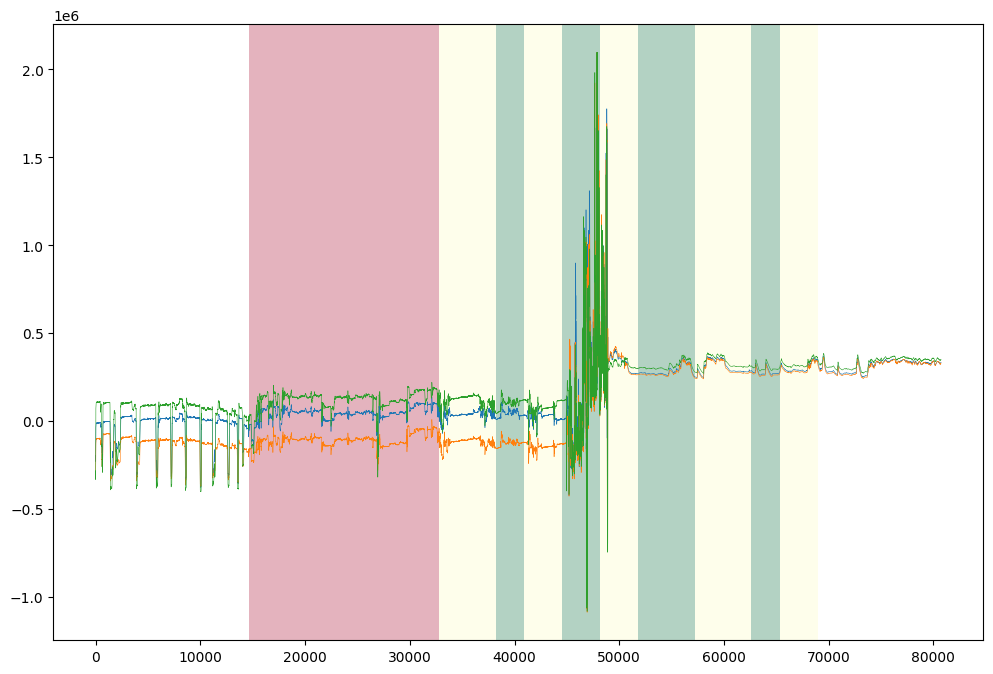

(M)014_20230507_095721_Verity.csv
전체 인덱스 길이: 36101
unknown error
시작 시간: 2023-05-07 09:50:00
시작 인덱스 값: 17056
기간 리스트: [Timestamp('2023-05-07 09:50:00'), Timestamp('2023-05-07 09:55:00'), Timestamp('2023-05-07 09:56:30'), Timestamp('2023-05-07 09:57:15'), Timestamp('2023-05-07 09:58:15'), Timestamp('2023-05-07 09:59:15'), Timestamp('2023-05-07 10:00:15'), Timestamp('2023-05-07 10:01:45'), Timestamp('2023-05-07 10:03:15'), Timestamp('2023-05-07 10:04:00'), Timestamp('2023-05-07 10:05:00')]
각 섹터 길이: [0, 0, 0, 2950, 3289, 3290, 4933, 4934, 2467, 3290]
각 섹터: [17056, 17056, 17056, 17056, 20006, 23295, 26585, 31518, 36452, 38919, 42209]


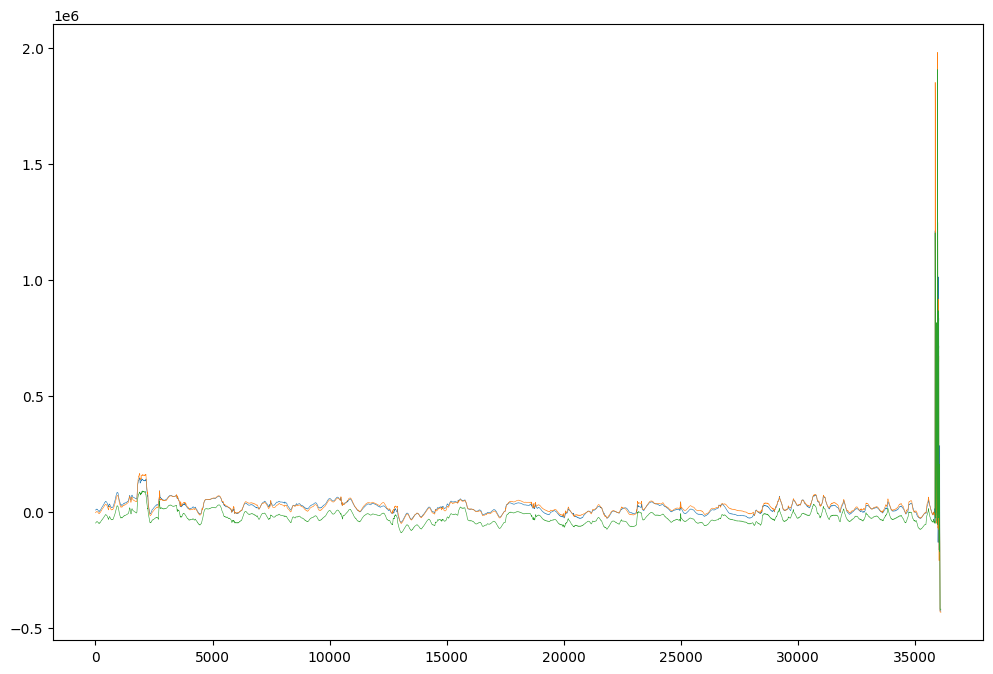

(M)016_20230507_085913_Verity.csv
전체 인덱스 길이: 77433
시작 시간: 2023-05-07 09:05:00
시작 인덱스 값: 19038
기간 리스트: [Timestamp('2023-05-07 09:05:00'), Timestamp('2023-05-07 09:10:00'), Timestamp('2023-05-07 09:11:30'), Timestamp('2023-05-07 09:12:15'), Timestamp('2023-05-07 09:13:15'), Timestamp('2023-05-07 09:14:15'), Timestamp('2023-05-07 09:15:15'), Timestamp('2023-05-07 09:16:45'), Timestamp('2023-05-07 09:18:15'), Timestamp('2023-05-07 09:19:00'), Timestamp('2023-05-07 09:20:00')]
각 섹터 길이: [16484, 4945, 2473, 3298, 3297, 3298, 4946, 4946, 2473, 3298]
각 섹터: [19038, 35522, 40467, 42940, 46238, 49535, 52833, 57779, 62725, 65198, 68496]


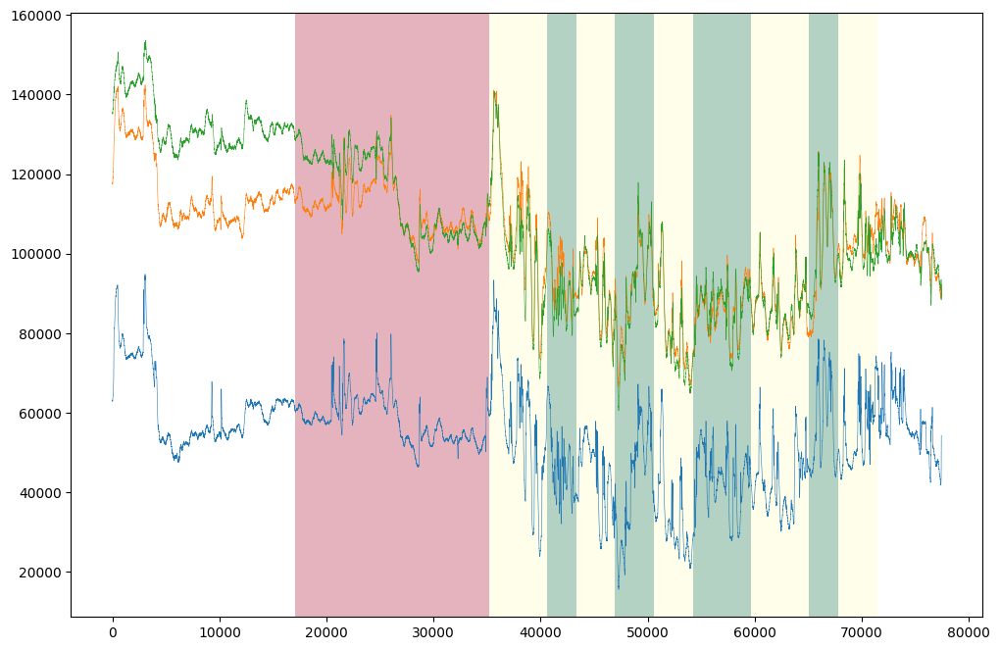

(M)017_20230507_110427_Verity.csv
전체 인덱스 길이: 76497
시작 시간: 2023-05-07 11:09:00
시작 인덱스 값: 14955
기간 리스트: [Timestamp('2023-05-07 11:09:00'), Timestamp('2023-05-07 11:14:00'), Timestamp('2023-05-07 11:15:30'), Timestamp('2023-05-07 11:16:15'), Timestamp('2023-05-07 11:17:15'), Timestamp('2023-05-07 11:18:15'), Timestamp('2023-05-07 11:19:15'), Timestamp('2023-05-07 11:20:45'), Timestamp('2023-05-07 11:22:15'), Timestamp('2023-05-07 11:23:00'), Timestamp('2023-05-07 11:24:00')]
각 섹터 길이: [16449, 4934, 2467, 3290, 3289, 3290, 4934, 4935, 2467, 3289]
각 섹터: [14955, 31404, 36338, 38805, 42095, 45384, 48674, 53608, 58543, 61010, 64299]


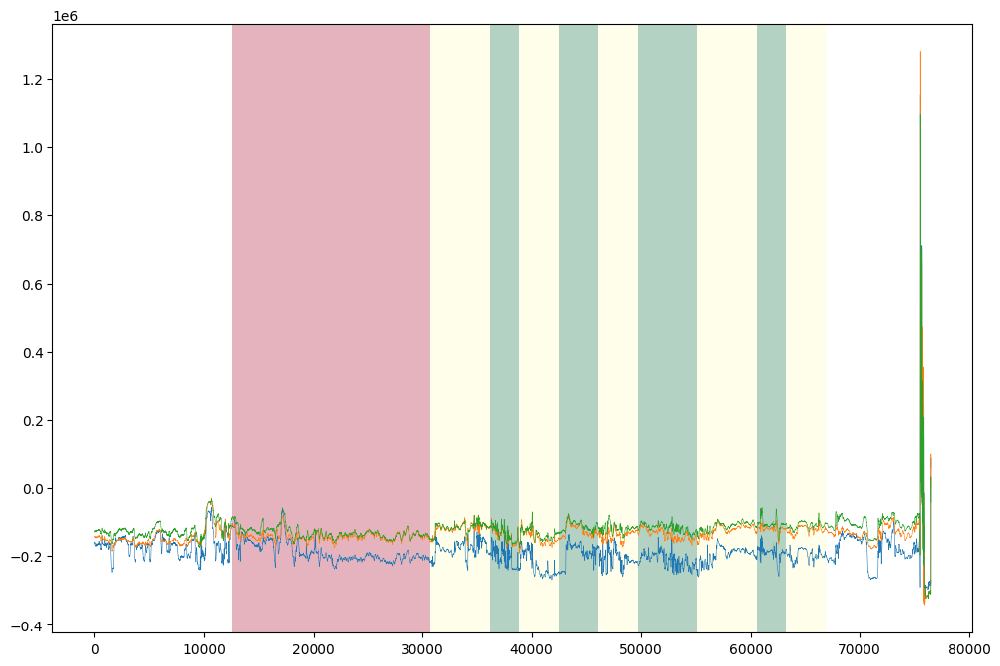

(M)018_20230507_100932_Verity.csv
전체 인덱스 길이: 74282
시작 시간: 2023-05-07 10:16:00
시작 인덱스 값: 21295
기간 리스트: [Timestamp('2023-05-07 10:16:00'), Timestamp('2023-05-07 10:21:00'), Timestamp('2023-05-07 10:22:30'), Timestamp('2023-05-07 10:23:15'), Timestamp('2023-05-07 10:24:15'), Timestamp('2023-05-07 10:25:15'), Timestamp('2023-05-07 10:26:15'), Timestamp('2023-05-07 10:27:45'), Timestamp('2023-05-07 10:29:15'), Timestamp('2023-05-07 10:30:00'), Timestamp('2023-05-07 10:31:00')]
각 섹터 길이: [16498, 4950, 2475, 3300, 3299, 3300, 4950, 4950, 2474, 3300]
각 섹터: [21295, 37793, 42743, 45218, 48518, 51817, 55117, 60067, 65017, 67491, 70791]


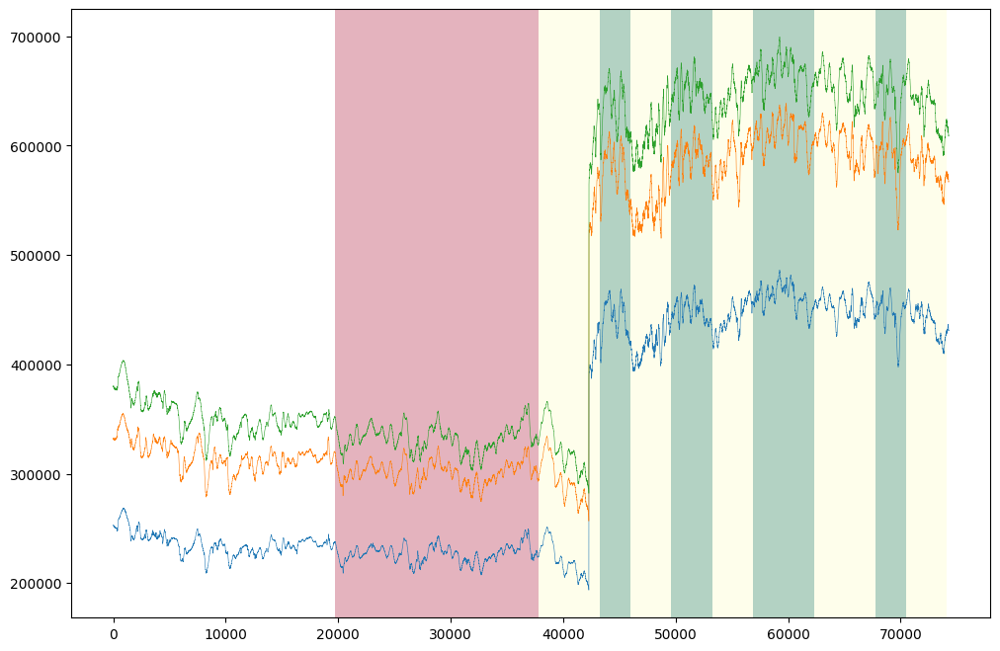

(M)019_20230507_101420_Verity.csv
전체 인덱스 길이: 55428
unknown error
시작 시간: 2023-05-07 10:12:00
시작 인덱스 값: 21295
기간 리스트: [Timestamp('2023-05-07 10:12:00'), Timestamp('2023-05-07 10:17:00'), Timestamp('2023-05-07 10:18:30'), Timestamp('2023-05-07 10:19:15'), Timestamp('2023-05-07 10:20:15'), Timestamp('2023-05-07 10:21:15'), Timestamp('2023-05-07 10:22:15'), Timestamp('2023-05-07 10:23:45'), Timestamp('2023-05-07 10:25:15'), Timestamp('2023-05-07 10:26:00'), Timestamp('2023-05-07 10:27:00')]
각 섹터 길이: [8728, 4932, 2466, 3289, 3289, 3289, 4933, 4933, 2467, 3289]
각 섹터: [21295, 30023, 34955, 37421, 40710, 43999, 47288, 52221, 57154, 59621, 62910]


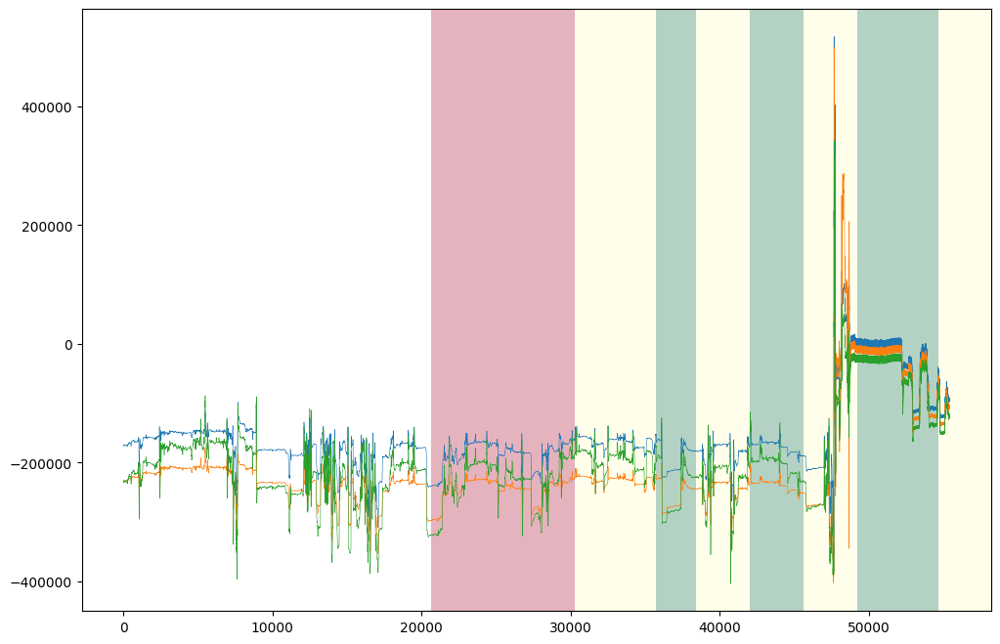

(M)020_20230507_122941_Verity.csv
전체 인덱스 길이: 62943
시작 시간: 2023-05-07 12:32:00
시작 인덱스 값: 7633
기간 리스트: [Timestamp('2023-05-07 12:32:00'), Timestamp('2023-05-07 12:37:00'), Timestamp('2023-05-07 12:38:30'), Timestamp('2023-05-07 12:39:15'), Timestamp('2023-05-07 12:40:15'), Timestamp('2023-05-07 12:41:15'), Timestamp('2023-05-07 12:42:15'), Timestamp('2023-05-07 12:43:45'), Timestamp('2023-05-07 12:45:15'), Timestamp('2023-05-07 12:46:00'), Timestamp('2023-05-07 12:47:00')]
각 섹터 길이: [16500, 4951, 2475, 3301, 3300, 3300, 4950, 4951, 2475, 3301]
각 섹터: [7633, 24133, 29084, 31559, 34860, 38160, 41460, 46410, 51361, 53836, 57137]


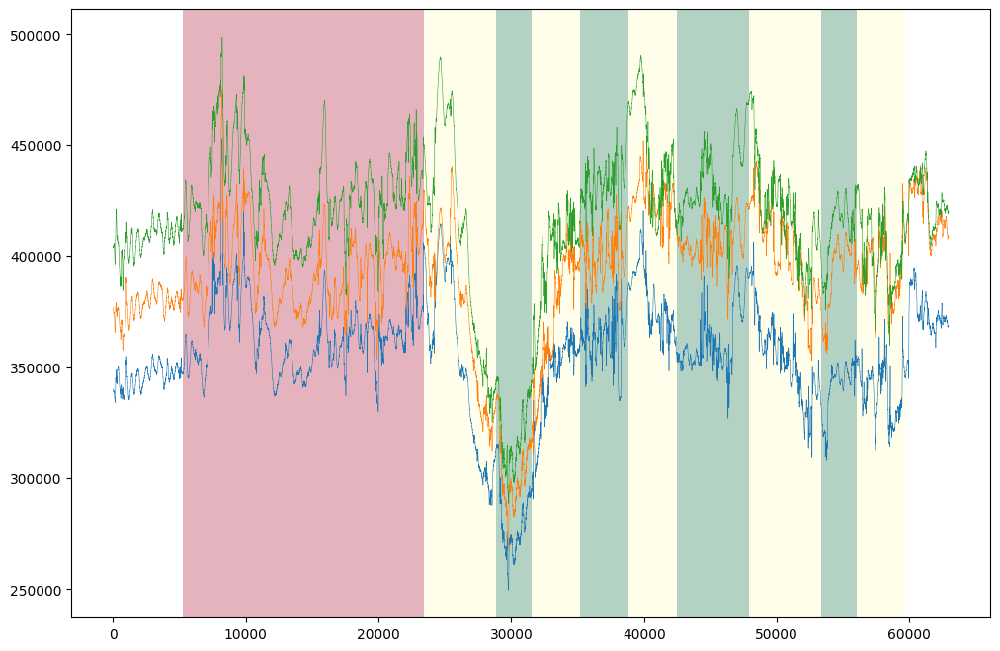

In [14]:
for i in mast_verity_dict:
    
    print(i)
    cid = int(i[3:6])
    print('전체 인덱스 길이:',len(mast_verity_dict[i]))

    # print(mast_verity_dict[i][mast_verity_dict[i]['times'] >= (df[df['id'] == cid].iloc[0]['mast_start_time'])].head())
    
    signals = mast_verity_dict[i][['ppg0', 'ppg1', 'ppg2']]
    ambient = mast_verity_dict[i]['ambient']   
    
    #start 시간은 마스트 시작 시간 5분 전
    start_time = df[df['id'] == cid].iloc[0]['mast_start_time']
    try:
        start_index = mast_verity_dict[i][mast_verity_dict[i]['times'] >= start_time].min().idx
    except:
        print('unknown error')
        pass
    print('시작 시간:', start_time)
    print('시작 인덱스 값:', start_index)
    
    #시작 시간 init
    period= start_time
    period_ls = [start_time] # [휴식, HIT, N, HIT ...]
    
    #sector init
    period_sector = [start_index] # 마커 리스트
    part_len = [] # 각 파트 길이
    tmp =  start_index # 길이 계산용
    
    
    #MAST_TIME_TABLE에 따라서 설정
    for s in MAST_TIME_TABLE:
        #시작 시간 + 섹션 길이
        period += datetime.timedelta(seconds = s)
        # 기간 리스트에 추가
        period_ls.append(period) 
    print('기간 리스트:',period_ls)
        
    #기간 리스트에 따라서 길이 계산    
    for j in range(len(period_ls)-1):
        #n-1 ~ n 기간 길이 계산 
        period_length = len(mast_verity_dict[i][mast_verity_dict[i].times.between(period_ls[j], period_ls[j+1]) == True])
        #부분 인덱스 길이 리스트에 추가 
        part_len.append(period_length)

        #전체 인덱스 길이 계산 즉 이게 마커
        tmp += period_length
        #섹터 리스트에 추가 마커 리스트
        period_sector.append(tmp)
    
    print('각 섹터 길이:',part_len)
    print('각 섹터:', period_sector)
    # 프로토콜 번호 지정
    for j in range(len(period_sector)-1):
        if period_sector[j] < period_sector[j+1]:
            mast_verity_dict[i].loc[period_sector[j]+1:period_sector[j+1], 'proc'] = MAST_PROTOCOL[j]
            
        else:
            break
    
    fig = plt.figure(figsize=(12,8), facecolor='white')
    axes = mast_verity_dict[i]['ppg0'].plot(linewidth = 0.4)
    axes = mast_verity_dict[i]['ppg1'].plot(linewidth = 0.4)
    axes = mast_verity_dict[i]['ppg2'].plot(linewidth = 0.4)
    
    cmap = mpl.colormaps.get_cmap('Set3')
    axes.pcolorfast(axes.get_xlim(), axes.get_ylim(), mast_verity_dict[i]['proc'].values[np.newaxis],
              cmap='RdYlGn', alpha=0.3)
    plt.show()
       

(M)001_20230507_093641_Verity.csv
Value is nan
(M)001_20230507_094057_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew -0.027122897470246037
ppg0 - kutosis -0.8521376473112201


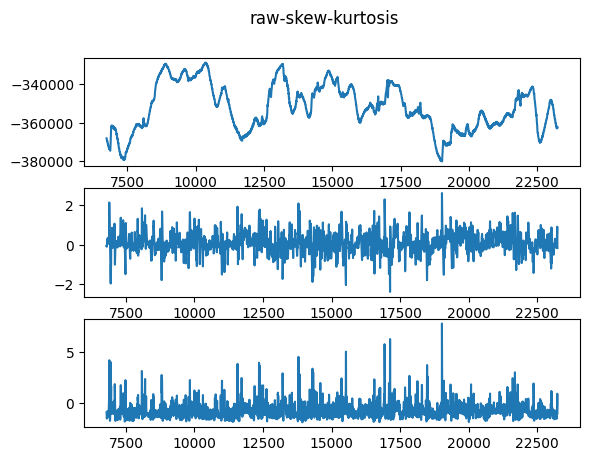

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.13128218445225745
ppg1 - kutosis -0.6375210988705122


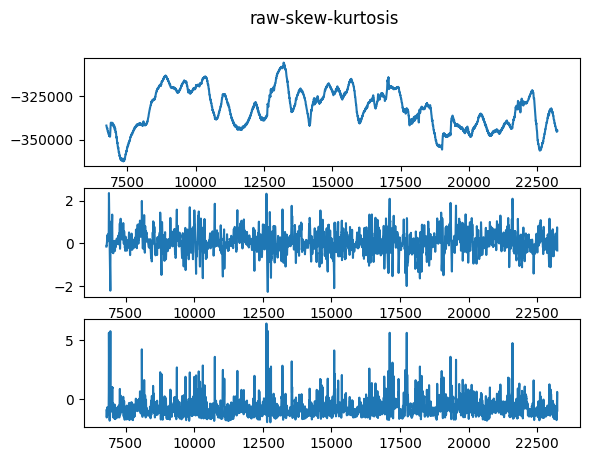

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.15272759312409429
ppg2 - kutosis -0.8965652055131601


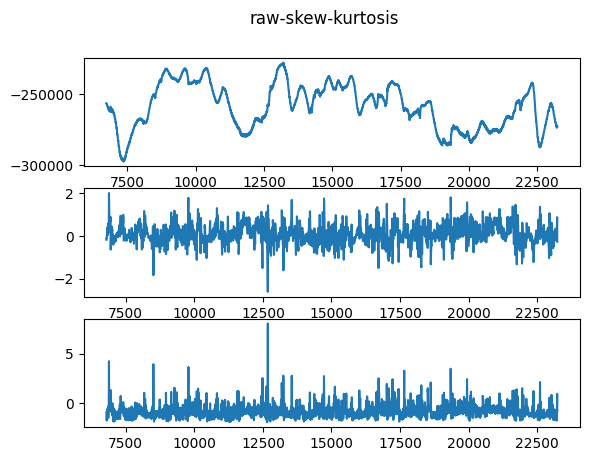

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew -0.5841636276069442
ppg0 - kutosis 0.26364106526678643


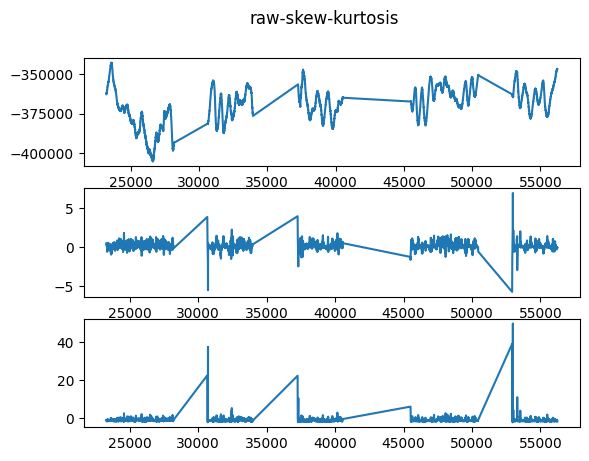

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.7641793069959879
ppg1 - kutosis 0.43793943656038925


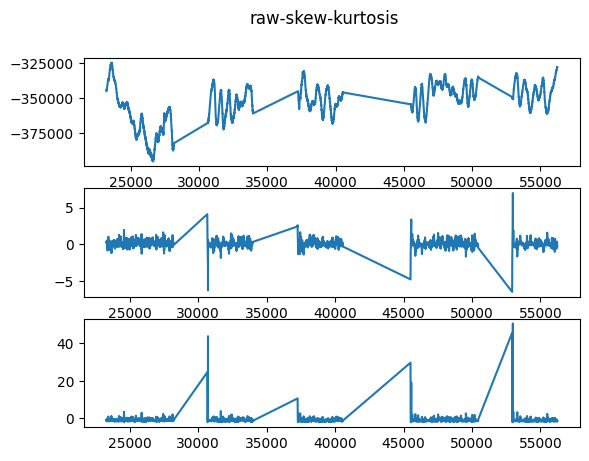

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.7133959092151413
ppg2 - kutosis 0.5608403060067895


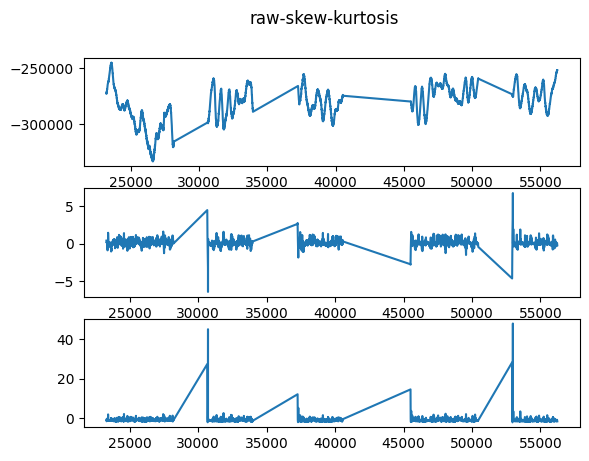

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.45999844405071294
ppg0 - kutosis 0.05395356532084383


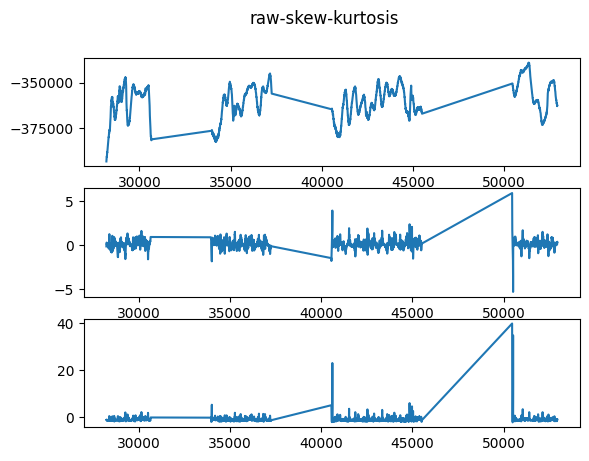

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.16206040669730845
ppg1 - kutosis 0.4267773938700188


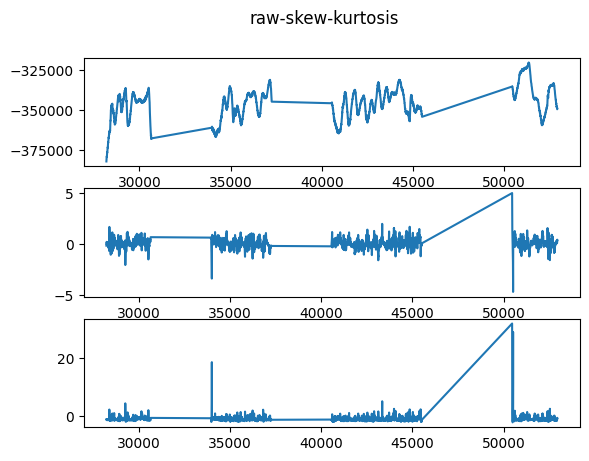

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.2474131986895252
ppg2 - kutosis 0.09157494690609269


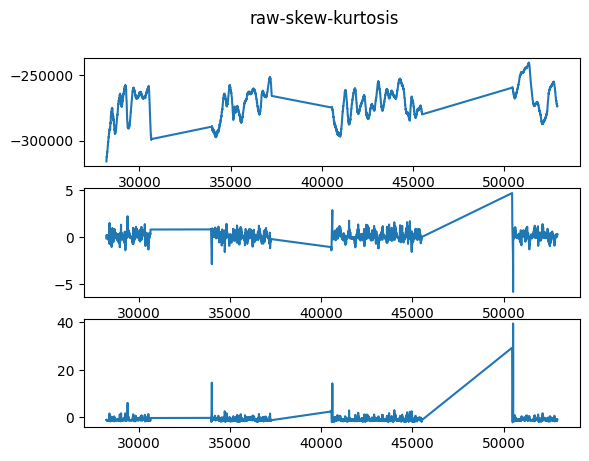

<Figure size 1200x800 with 0 Axes>

(M)002_20230507_103326_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 1.3346989532916764
ppg0 - kutosis 1.932027300057988


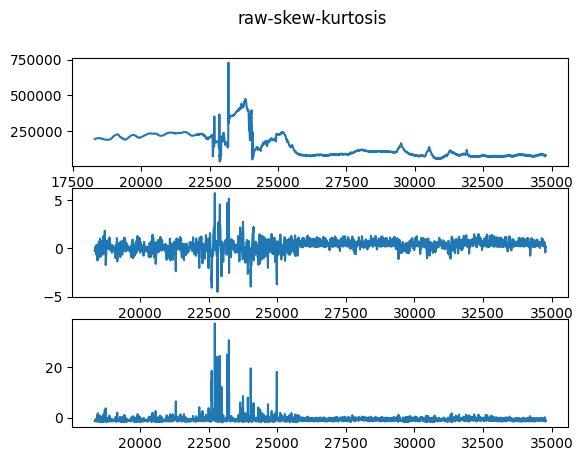

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 2.6811481333596587
ppg1 - kutosis 7.449082616315458


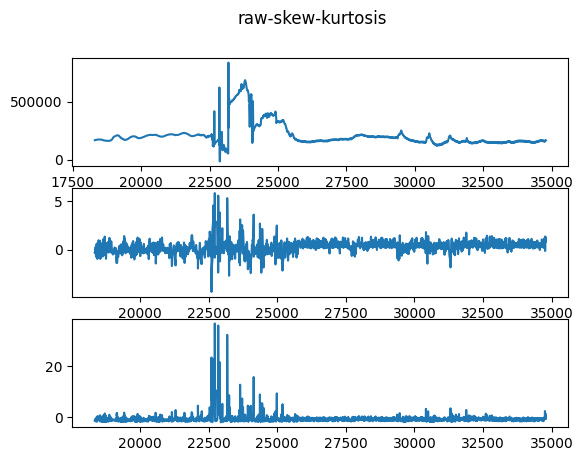

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 1.9794962809510792
ppg2 - kutosis 4.817538673544399


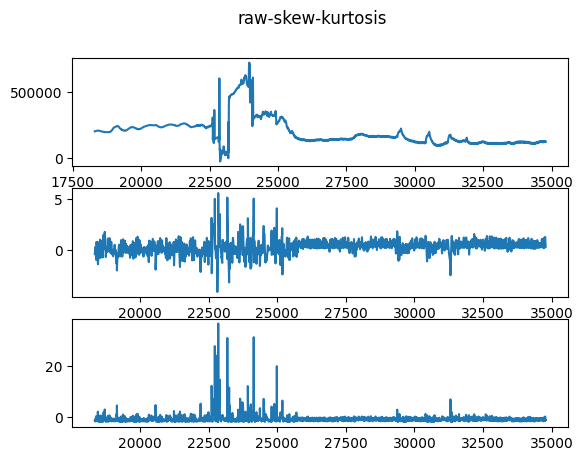

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 0.36336404526859706
ppg0 - kutosis -0.0919311823625284


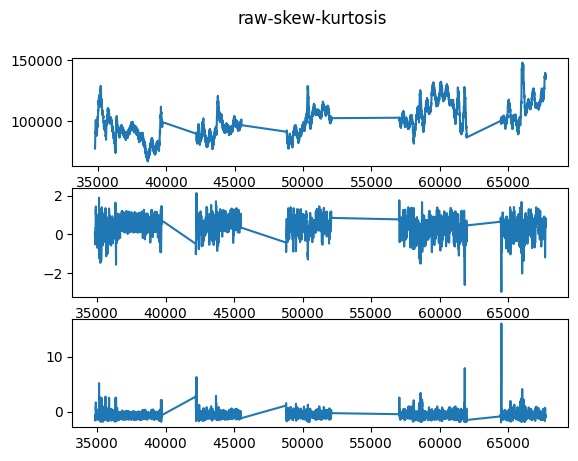

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.3357835056029823
ppg1 - kutosis 1.1818909430659117


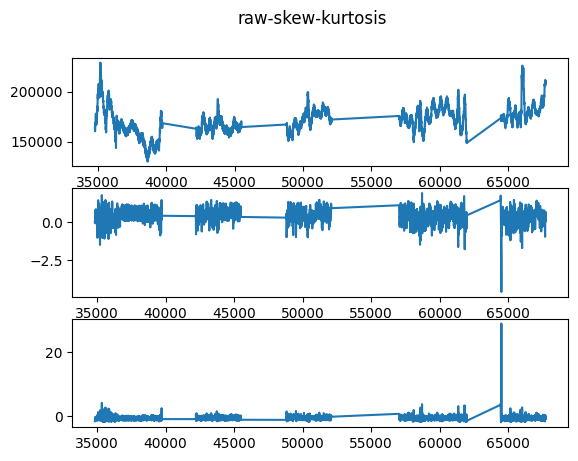

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.4121999334734479
ppg2 - kutosis 0.5572433879248369


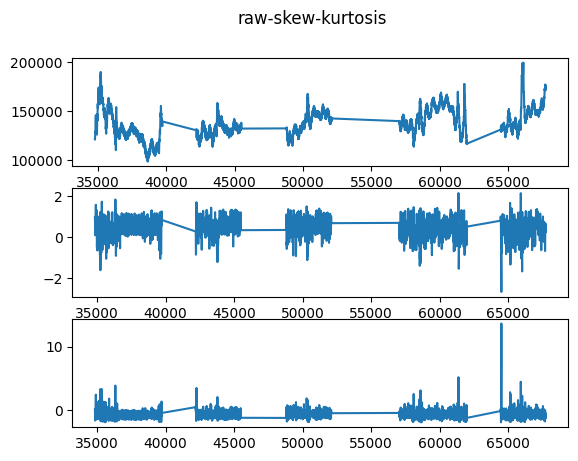

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew 0.17640575697398386
ppg0 - kutosis 0.8083916631439316


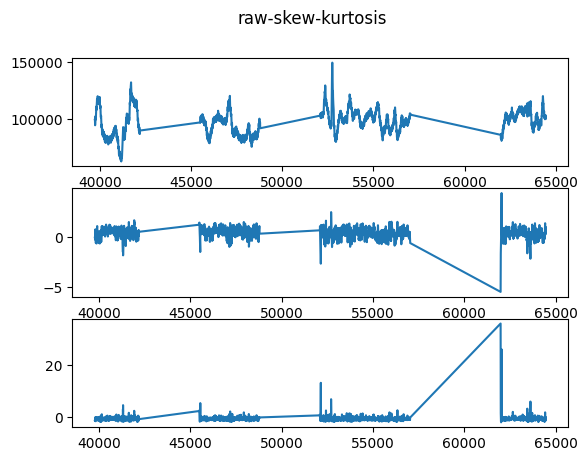

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.09969726274522776
ppg1 - kutosis 0.5508833267069315


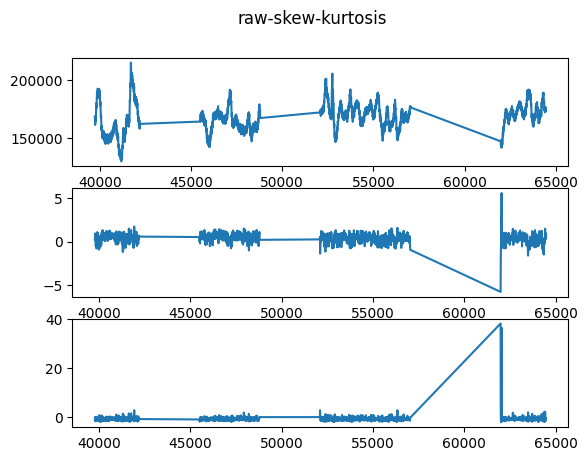

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.963949069444608
ppg2 - kutosis 2.9552763294756703


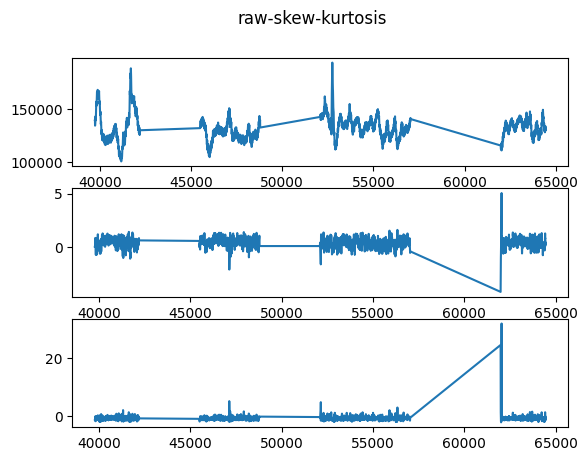

<Figure size 1200x800 with 0 Axes>

(M)003_20230507_090129_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 0.1939840846508039
ppg0 - kutosis 1.2889779168709445


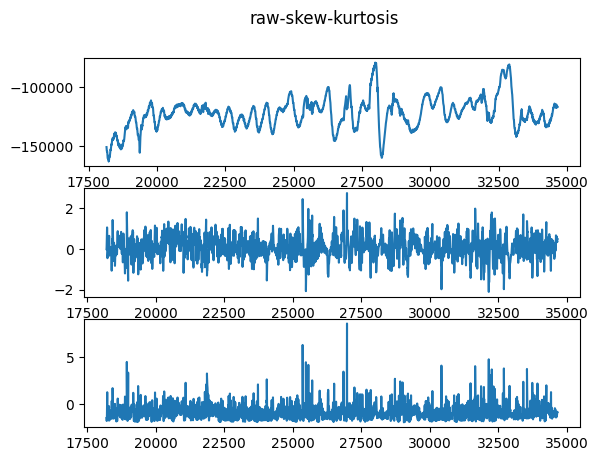

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.6381995706194197
ppg1 - kutosis 1.194547208868415


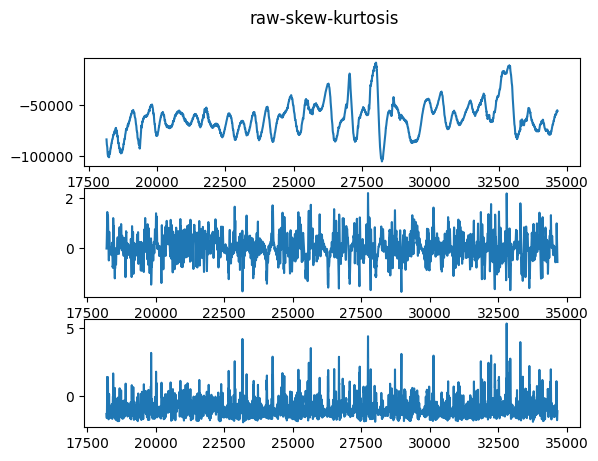

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.1046593520429081
ppg2 - kutosis 0.7310226714382568


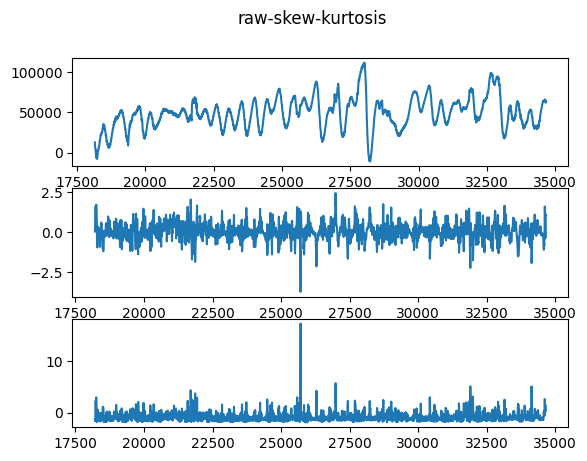

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew -0.5997340628326385
ppg0 - kutosis 0.5463332176862634


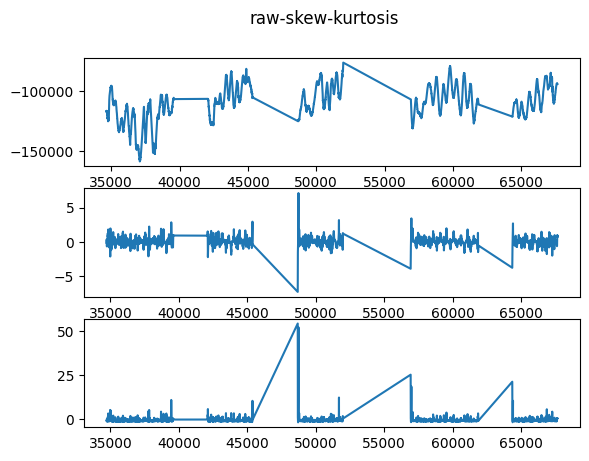

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.3898069788039808
ppg1 - kutosis -0.021991949410812506


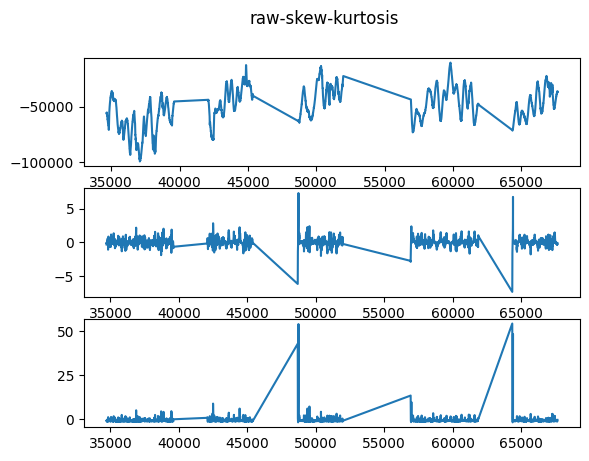

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.38596024618246655
ppg2 - kutosis 0.018611611632592506


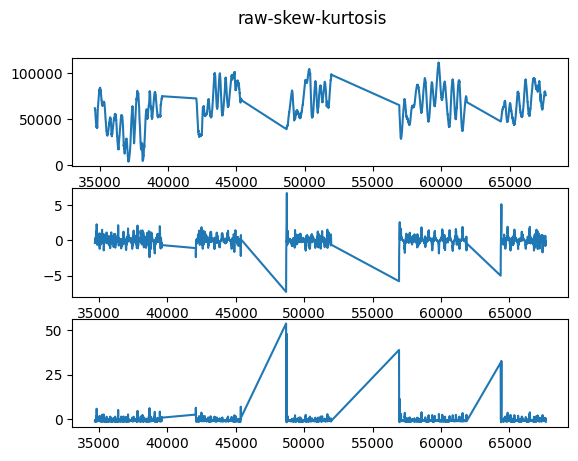

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.15869185815771056
ppg0 - kutosis -0.09839922895102804


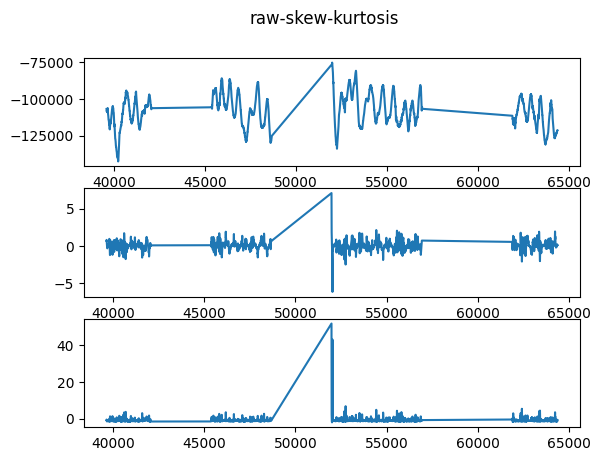

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.01166516320729192
ppg1 - kutosis -0.15354704386905027


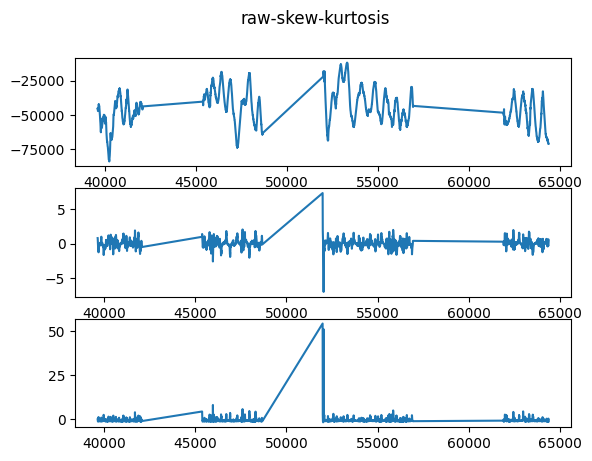

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.14394851246789656
ppg2 - kutosis -0.5284087661285821


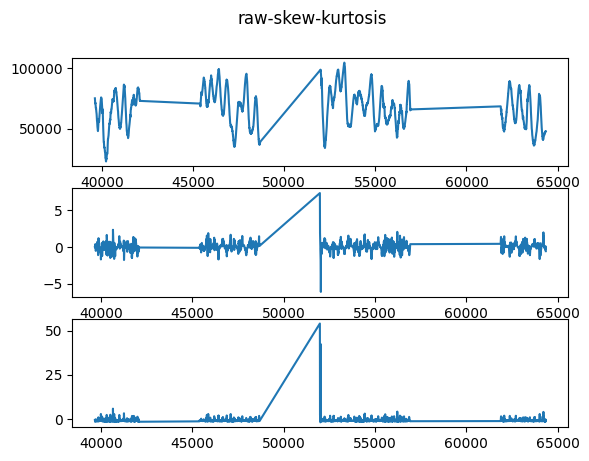

<Figure size 1200x800 with 0 Axes>

(M)004_20230507_093440_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 0.12628357321743194
ppg0 - kutosis 0.02398047554790983


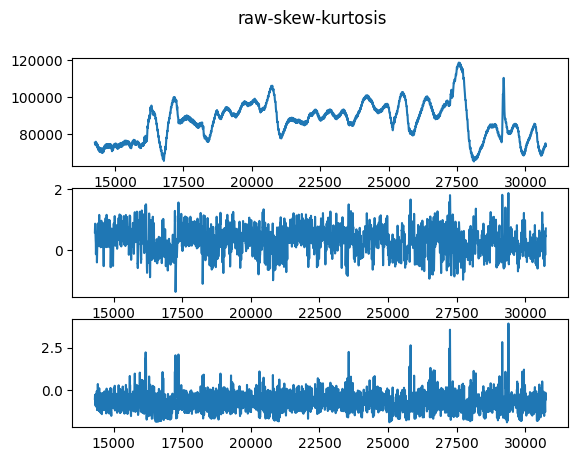

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.012544654822798637
ppg1 - kutosis -0.12389158115457377


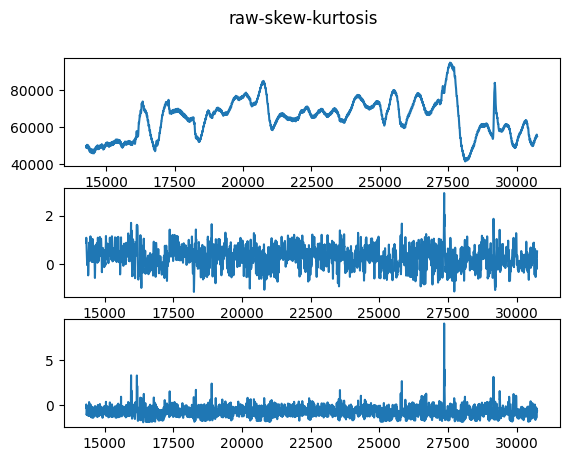

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.016241713828565638
ppg2 - kutosis -0.3898581992254919


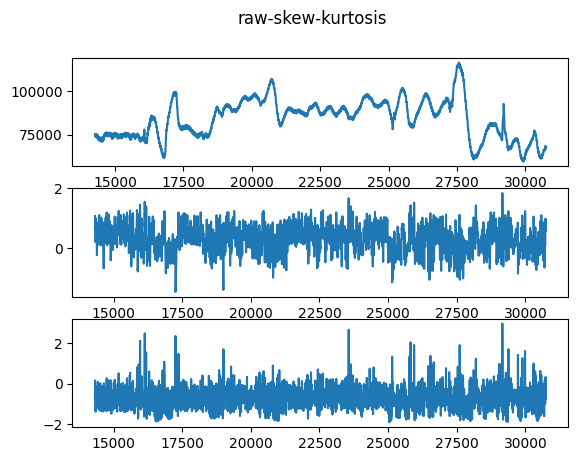

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 0.6920148766120156
ppg0 - kutosis 0.18403161840371007


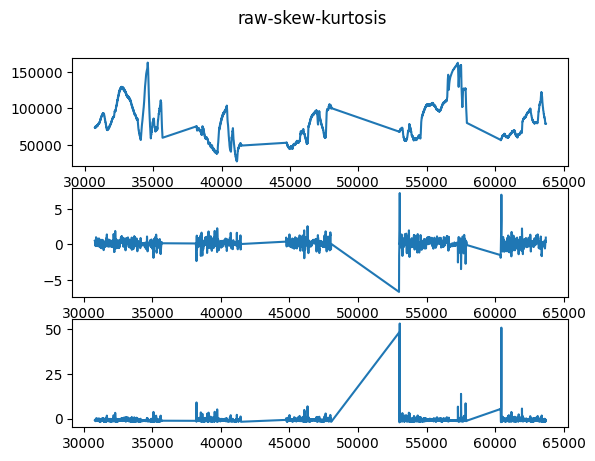

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.5859972532021731
ppg1 - kutosis -0.22263140703067696


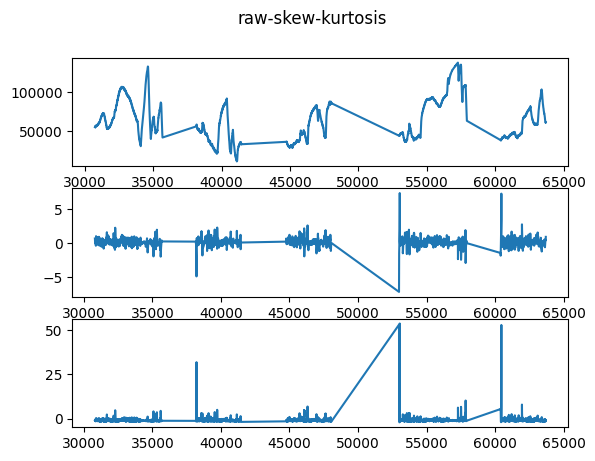

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.6370899083173671
ppg2 - kutosis 0.3054123861564455


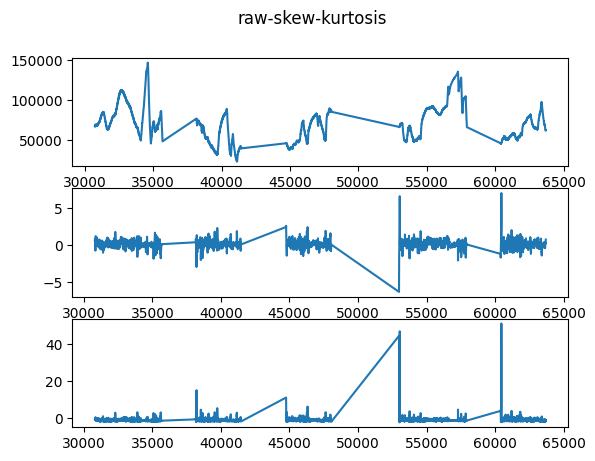

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew 0.9517108561034974
ppg0 - kutosis 0.9577441956342847


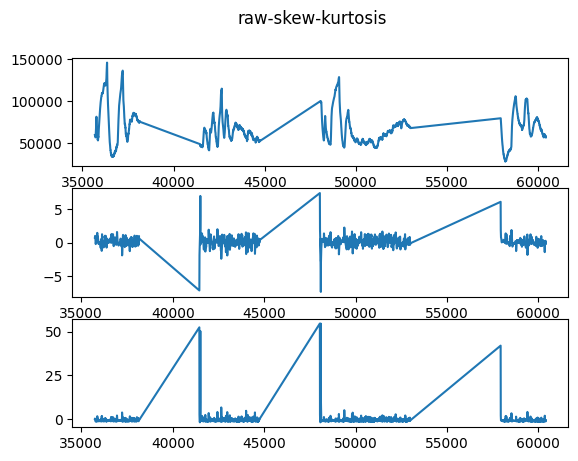

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.7679198881806591
ppg1 - kutosis 0.4768615760601298


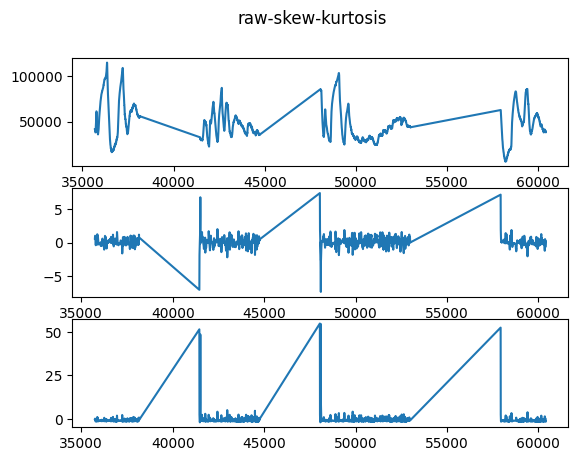

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.7174031231069805
ppg2 - kutosis 0.8172391743474554


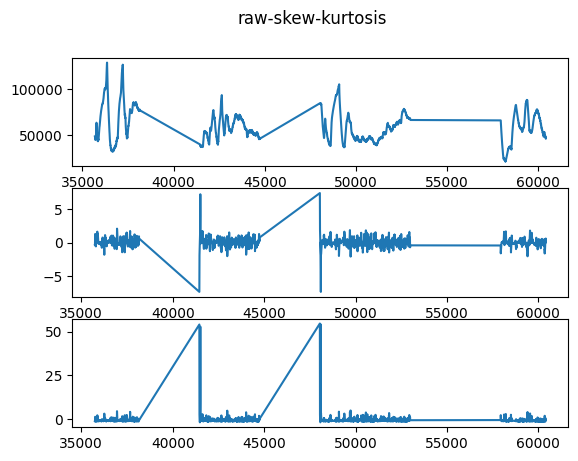

<Figure size 1200x800 with 0 Axes>

(M)005_20230507_113956_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 1.166887357684377
ppg0 - kutosis 2.292069295099753


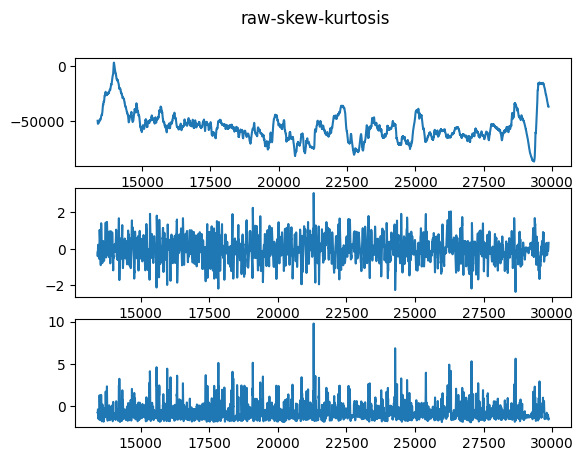

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 1.4156890840479424
ppg1 - kutosis 2.635845949768096


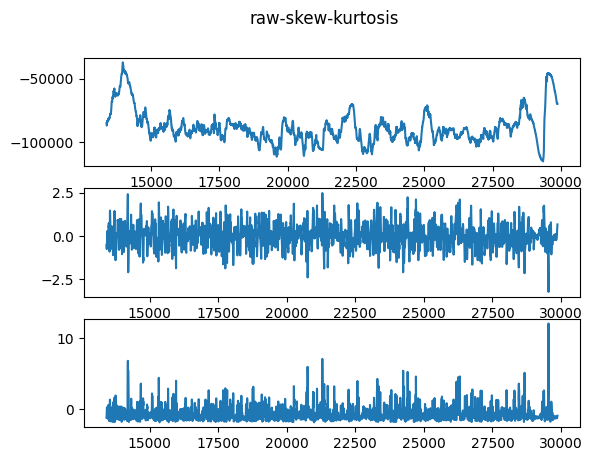

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 1.7781795154625673
ppg2 - kutosis 4.030171025608544


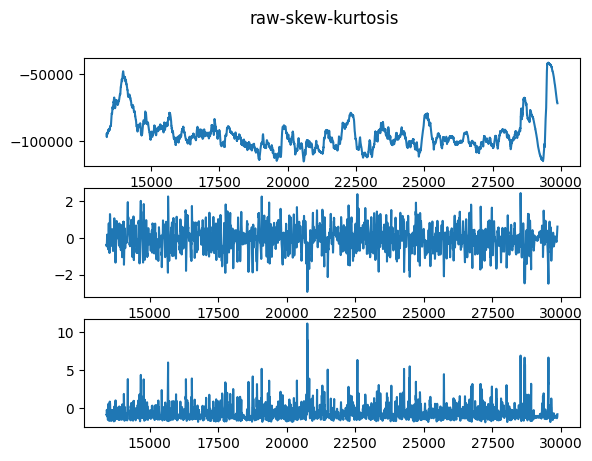

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 0.786127459611096
ppg0 - kutosis 1.5995427036321903


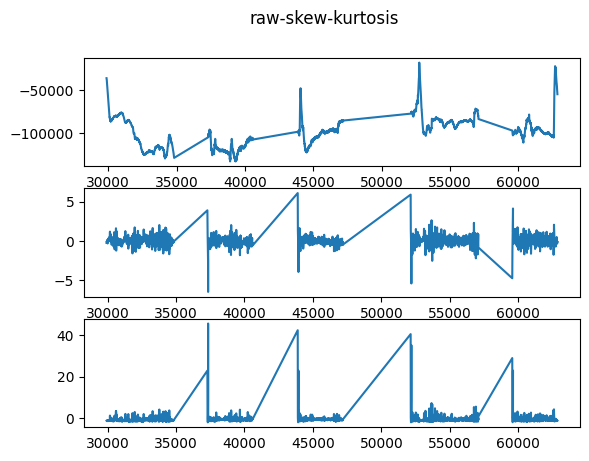

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 1.0184033111471695
ppg1 - kutosis 2.964669226617726


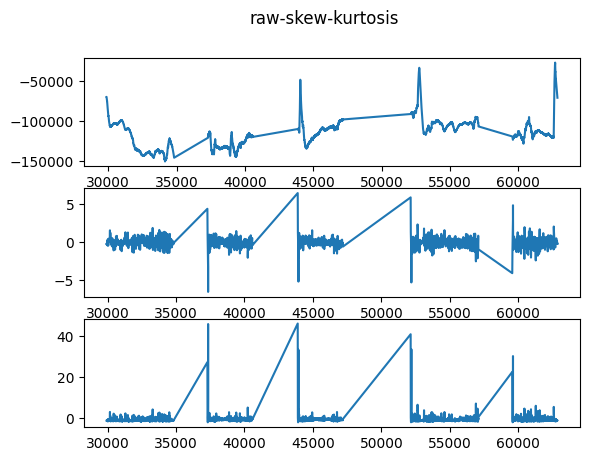

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.30093335489988954
ppg2 - kutosis -0.07937518000159294


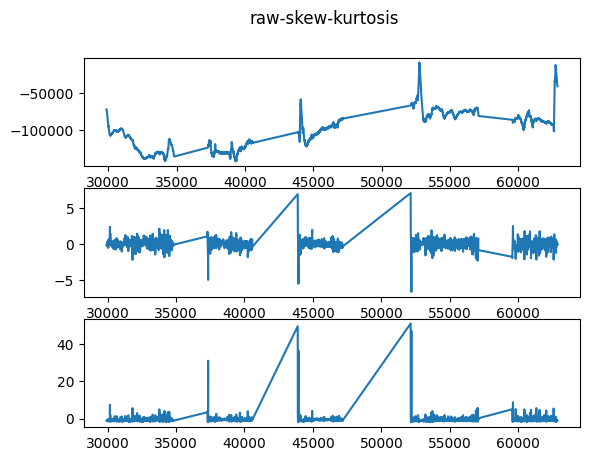

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.8248320205331737
ppg0 - kutosis 0.8109296946998139


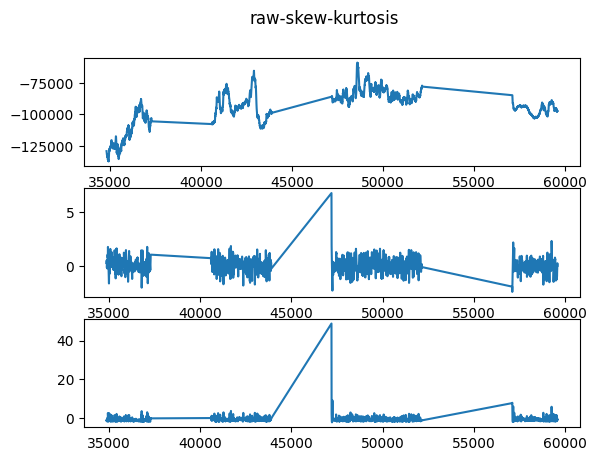

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.6622695701953213
ppg1 - kutosis 0.3824017707145937


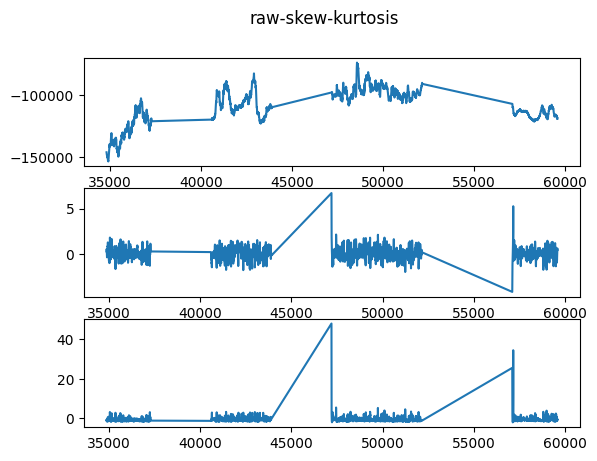

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.7957768945349686
ppg2 - kutosis -0.3241174175676096


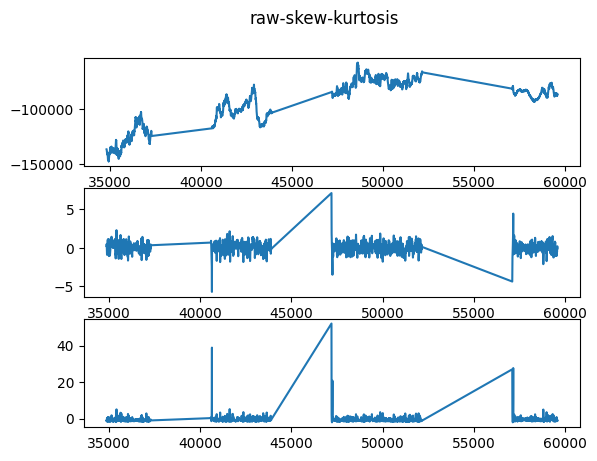

<Figure size 1200x800 with 0 Axes>

(M)006_20230507_110506_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew -0.6553875885714778
ppg0 - kutosis 1.0298037604677983


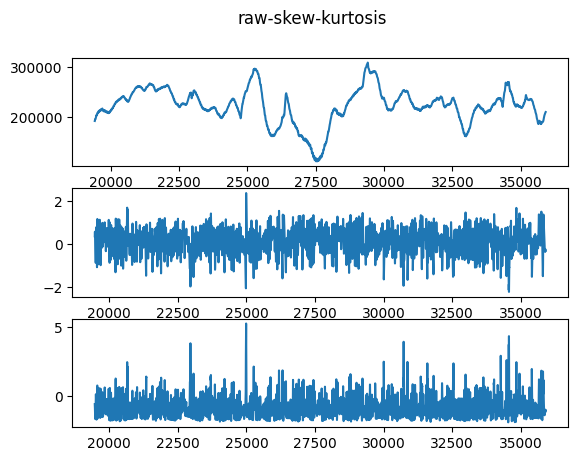

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.6417680281564299
ppg1 - kutosis 1.0039724212479673


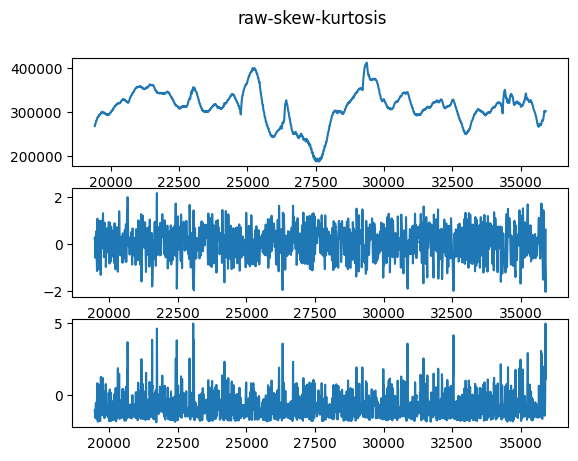

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.8841512004631149
ppg2 - kutosis 1.270293533764014


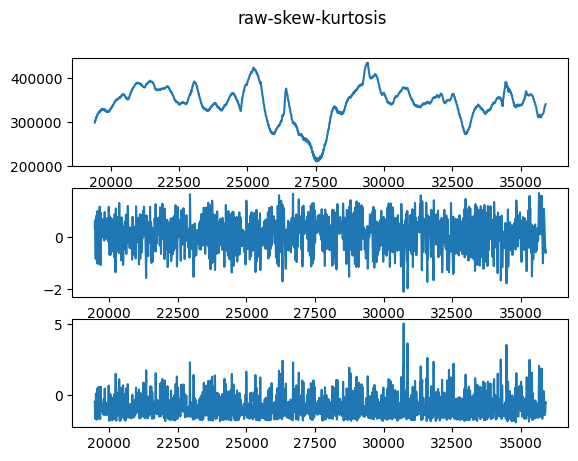

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew -0.2552424245760179
ppg0 - kutosis -0.7943157343334328


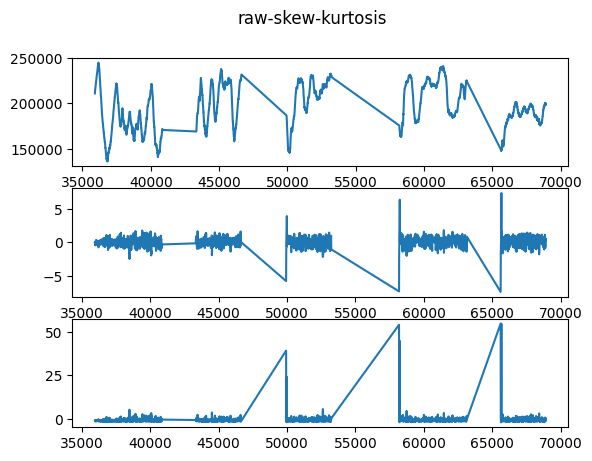

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.5071704785606549
ppg1 - kutosis -0.543747002043506


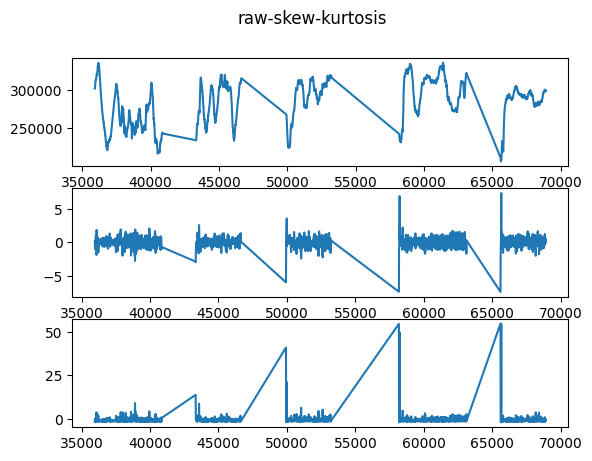

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.31347014573353116
ppg2 - kutosis -0.8036660427533575


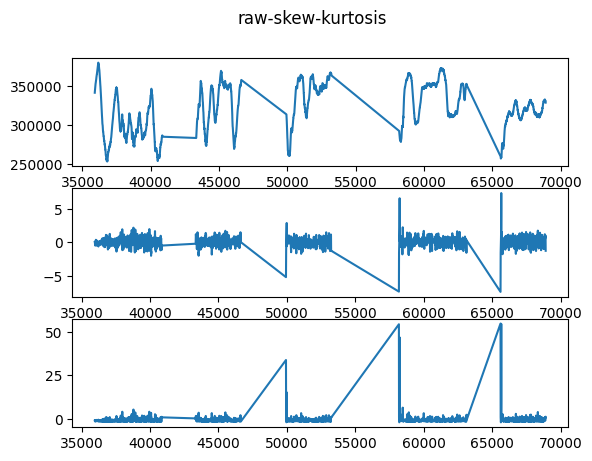

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew 0.14640377383438022
ppg0 - kutosis -0.8607259054563103


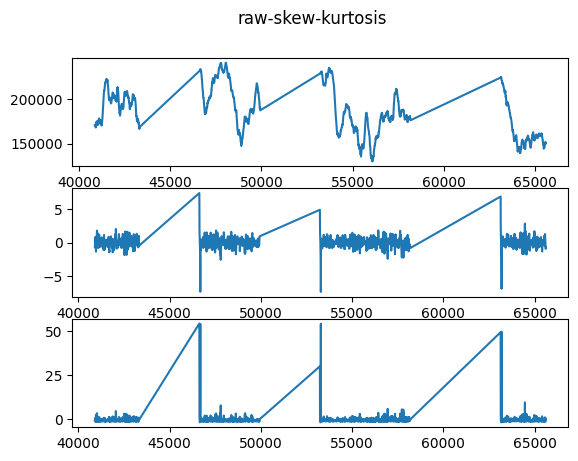

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.23808860216760525
ppg1 - kutosis -0.6514766851438769


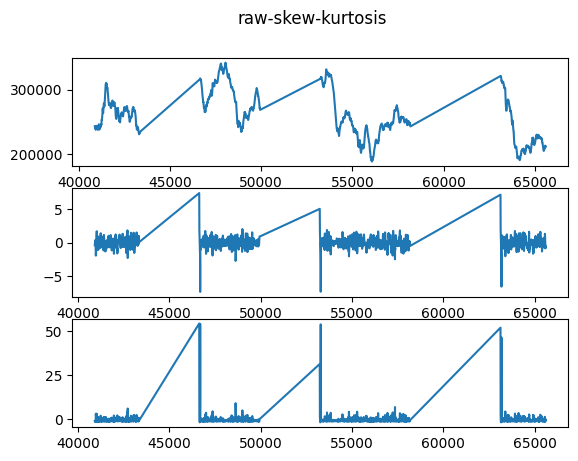

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.21297461282014474
ppg2 - kutosis -0.6945878525620088


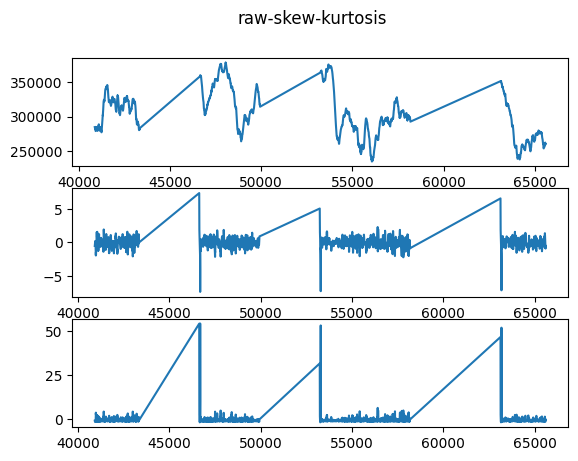

<Figure size 1200x800 with 0 Axes>

(M)007_20230507_110503_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 0.4011696656680045
ppg0 - kutosis 0.21209066382786768


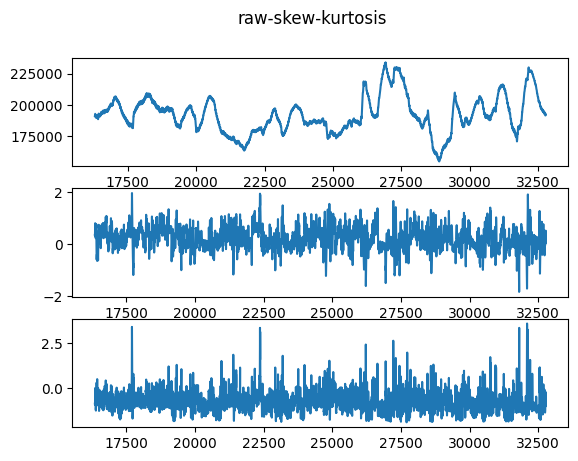

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.2949038269397283
ppg1 - kutosis 0.17579157184637006


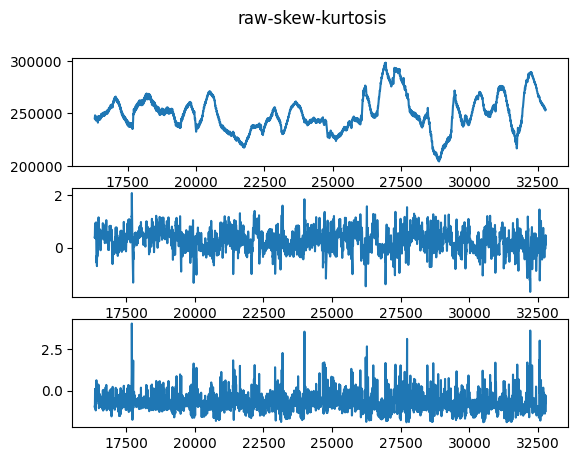

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.4222436235619579
ppg2 - kutosis 0.31032934886107055


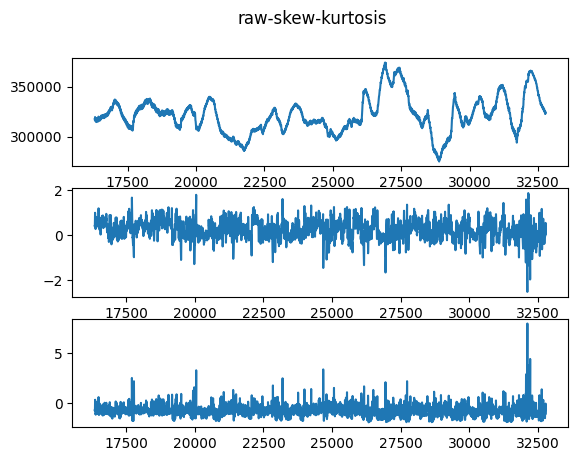

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew -0.062057208035283924
ppg0 - kutosis -1.1762327318441952


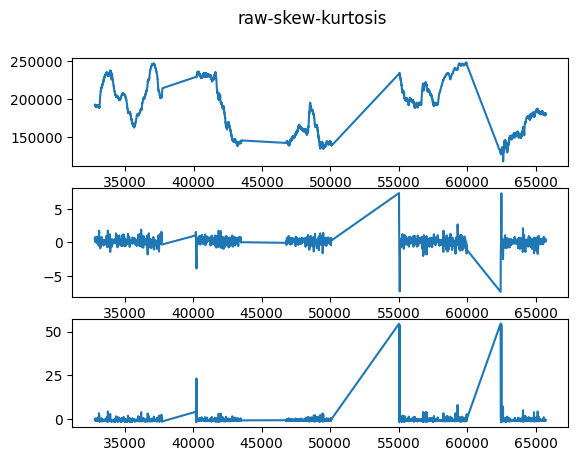

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.4569040990233907
ppg1 - kutosis -0.7136194504388267


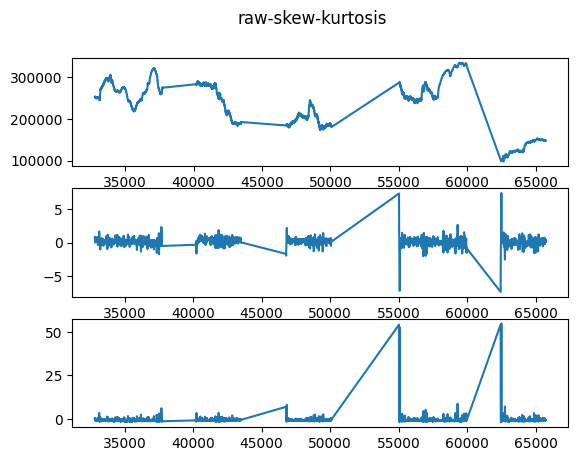

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.00772210899437332
ppg2 - kutosis -1.1071868286257536


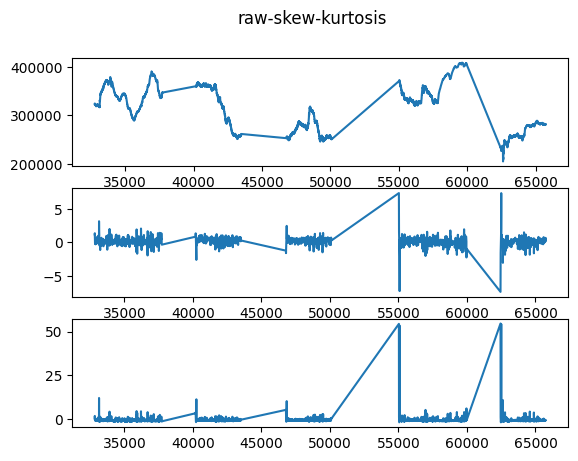

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew 2.6011199875403648
ppg0 - kutosis 35.3889912031061


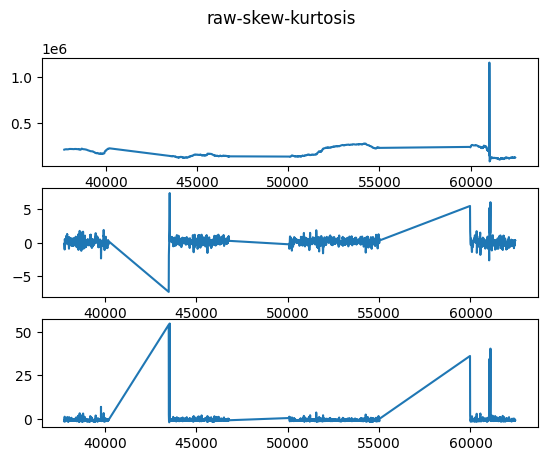

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 1.5065436649685333
ppg1 - kutosis 23.357513851670337


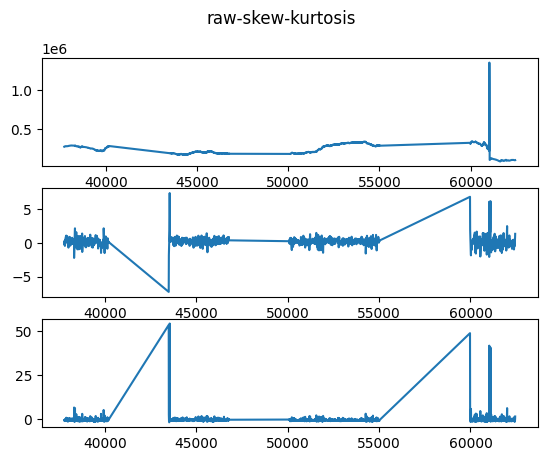

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 1.077450424073495
ppg2 - kutosis 8.607621968318577


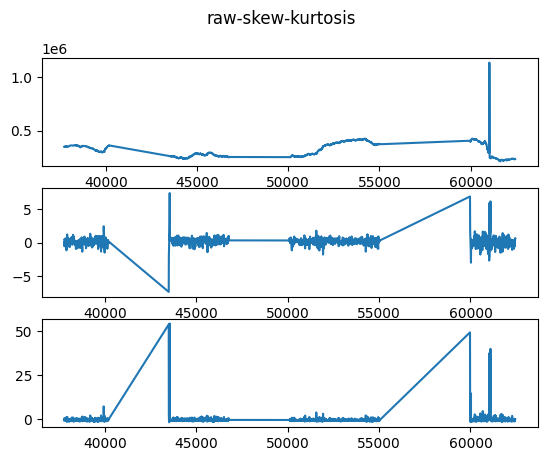

<Figure size 1200x800 with 0 Axes>

(M)008_20230507_113824_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 0.019030493834503275
ppg0 - kutosis -0.29882916439936524


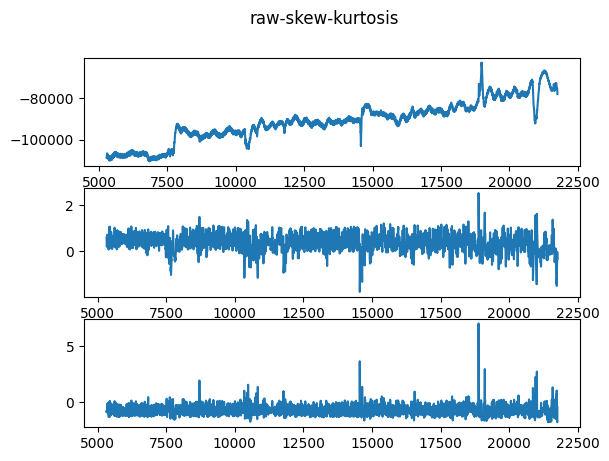

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 1.0303813504466781
ppg1 - kutosis 2.645810452374021


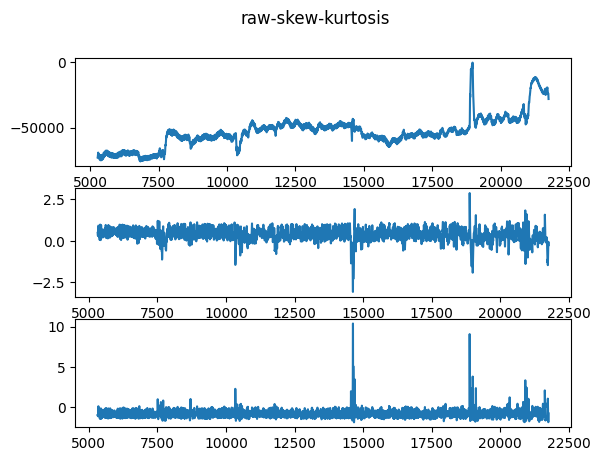

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.8925805658092855
ppg2 - kutosis 2.656904328202206


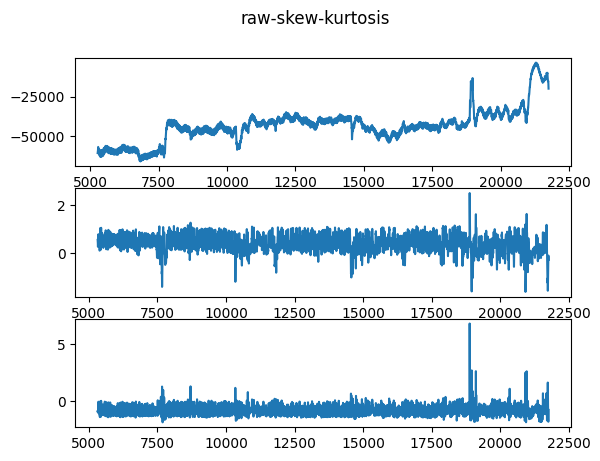

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 0.7821356512921156
ppg0 - kutosis 31.064561673519023


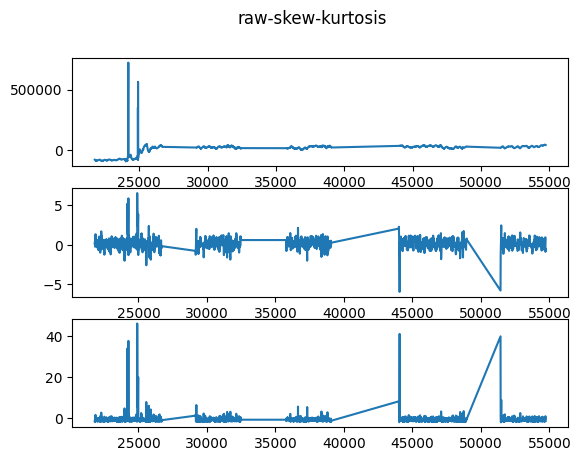

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 3.672003066914715
ppg1 - kutosis 103.74372980193503


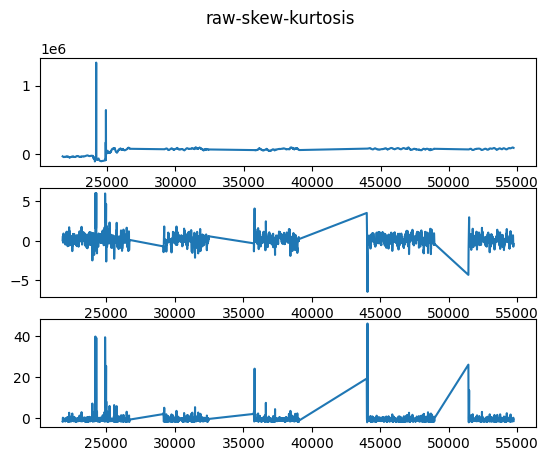

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 12.087937826837905
ppg2 - kutosis 351.86027091369147


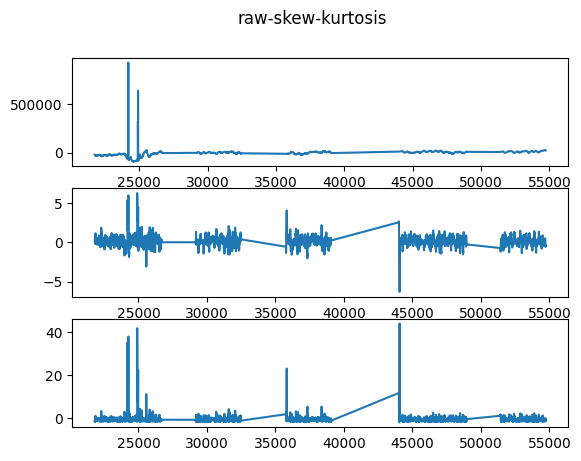

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew 0.17260403469050595
ppg0 - kutosis 0.011296274136650908


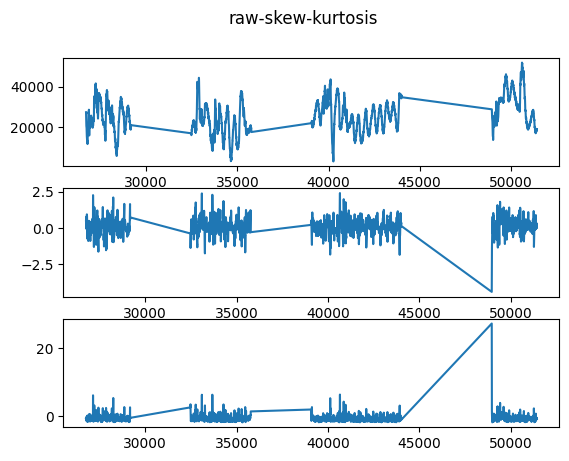

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.3289384682818334
ppg1 - kutosis 0.8468156597132594


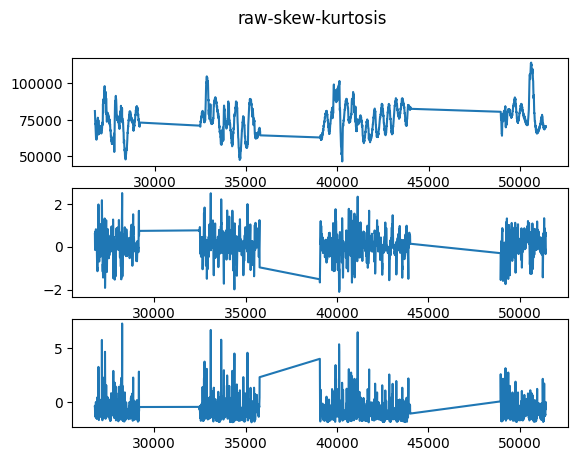

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.1935852920329787
ppg2 - kutosis 0.2789488792877193


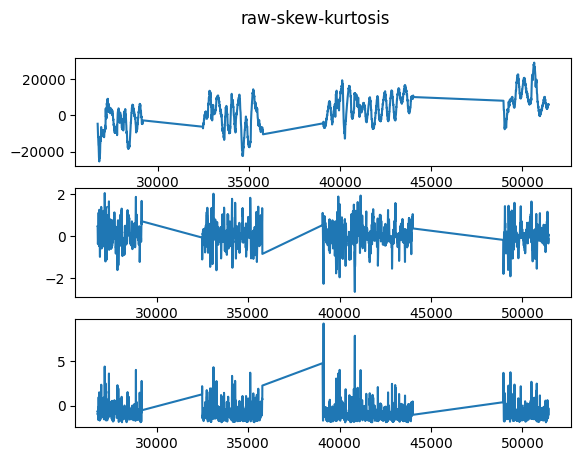

<Figure size 1200x800 with 0 Axes>

(M)009_20230507_095758_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew -0.30373215417131394
ppg0 - kutosis -1.1605595267586648


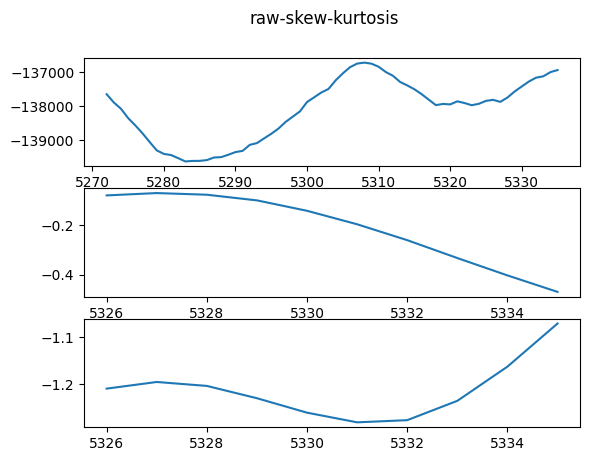

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.36010631120488384
ppg1 - kutosis -0.38707370543665576


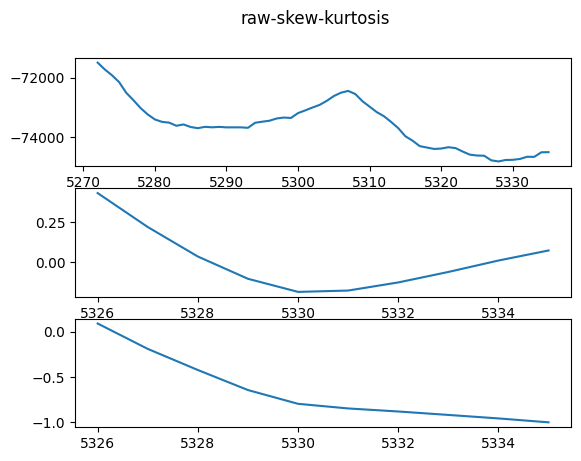

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.4297626073143933
ppg2 - kutosis -0.7831558348469465


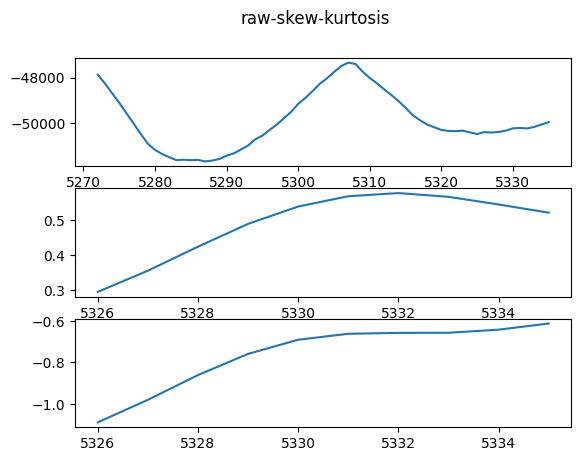

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 0.15624220715443884
ppg0 - kutosis 0.13752694637696194


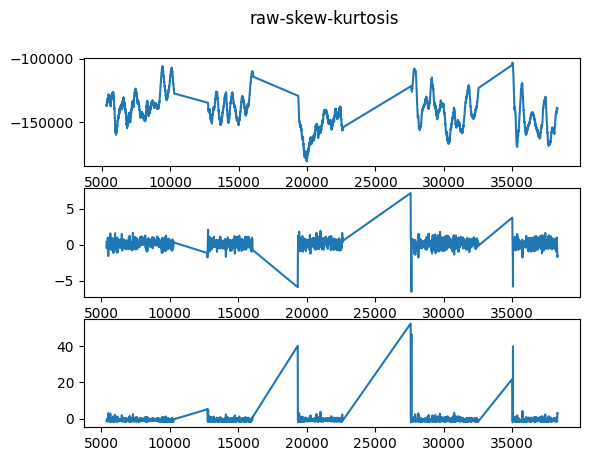

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.13183094026729456
ppg1 - kutosis 0.4203767770765139


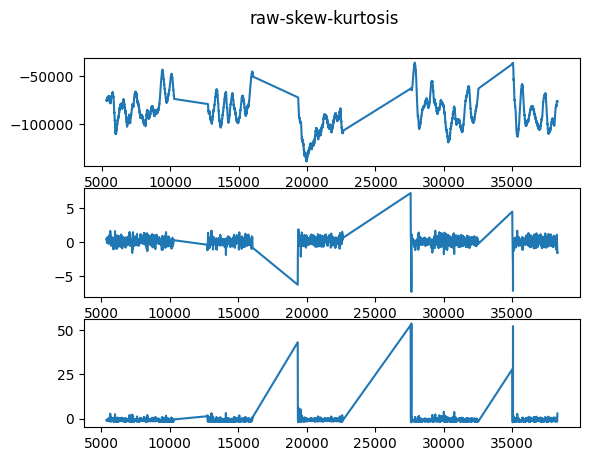

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.14015380976978187
ppg2 - kutosis 0.03952010146307794


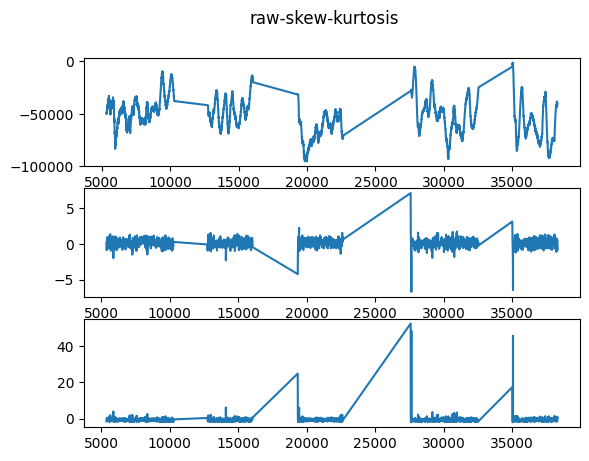

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.32217779614648545
ppg0 - kutosis -0.26784526185312885


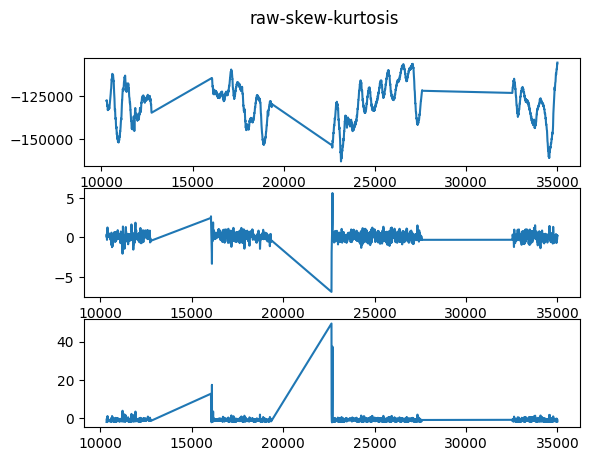

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.3026938655330463
ppg1 - kutosis -0.46229058194605477


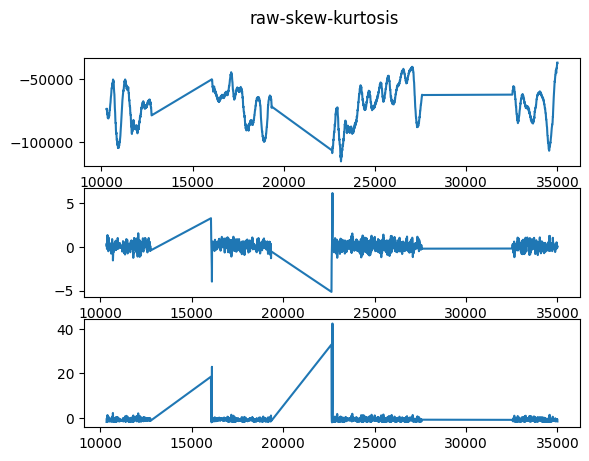

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.4431416857762401
ppg2 - kutosis -0.10794282760701002


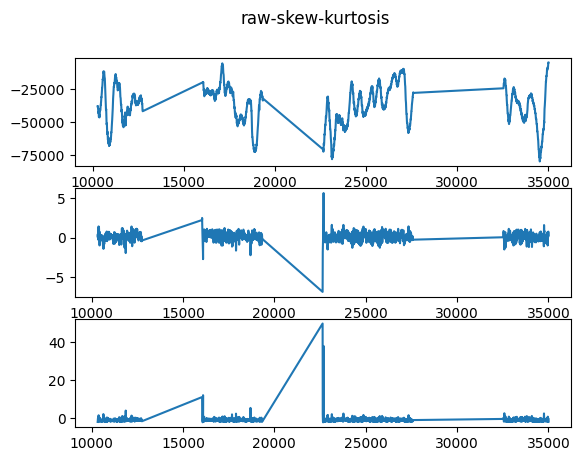

<Figure size 1200x800 with 0 Axes>

(M)010_20230507_103416_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew -0.1770259154020403
ppg0 - kutosis 0.29872936772107606


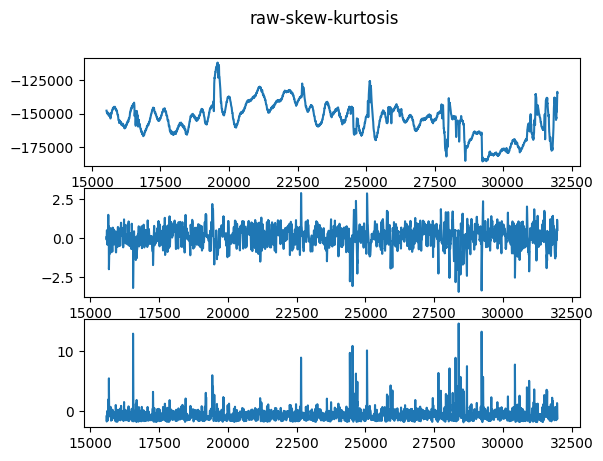

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.016056480257989367
ppg1 - kutosis -0.19036808540118333


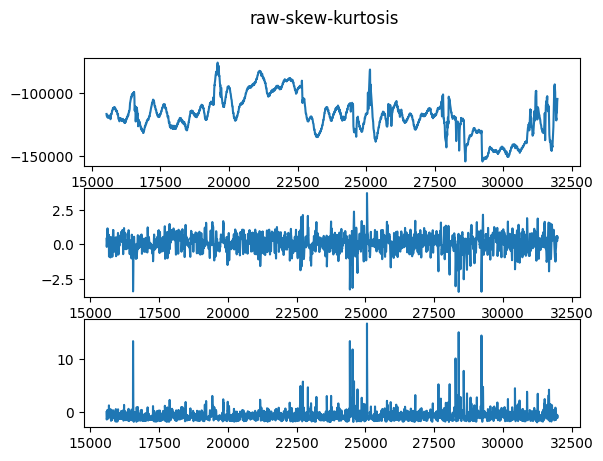

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.02035216732874342
ppg2 - kutosis -0.14872525010621107


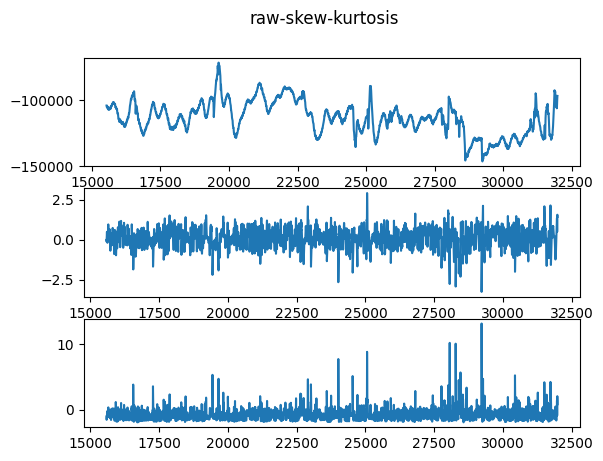

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew -0.29940851818298814
ppg0 - kutosis 0.3399976454348388


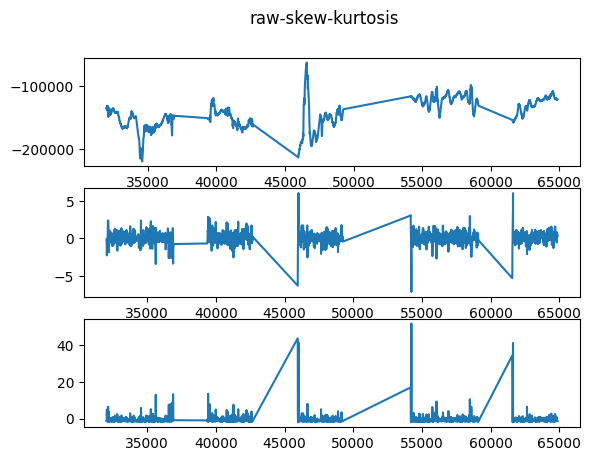

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.34168064388301783
ppg1 - kutosis 1.4846584485648924


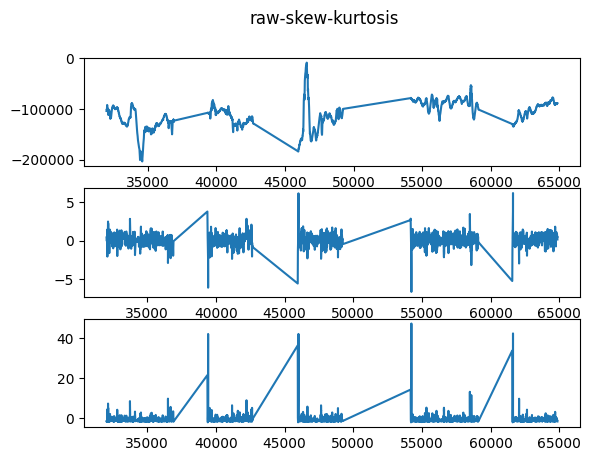

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.6718809084708391
ppg2 - kutosis 0.8723771797246123


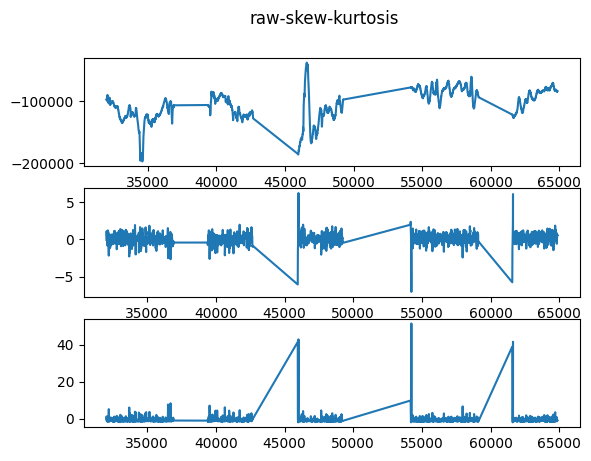

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.13450053479325186
ppg0 - kutosis 0.7009438784011652


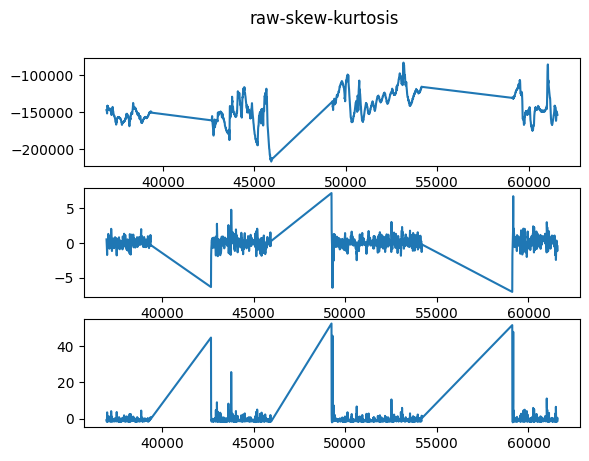

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.3321427851056669
ppg1 - kutosis 0.5849488416677051


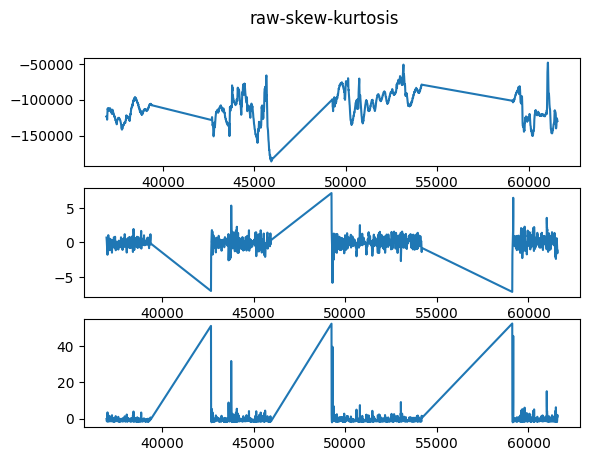

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.41067738712806323
ppg2 - kutosis 1.371918258287586


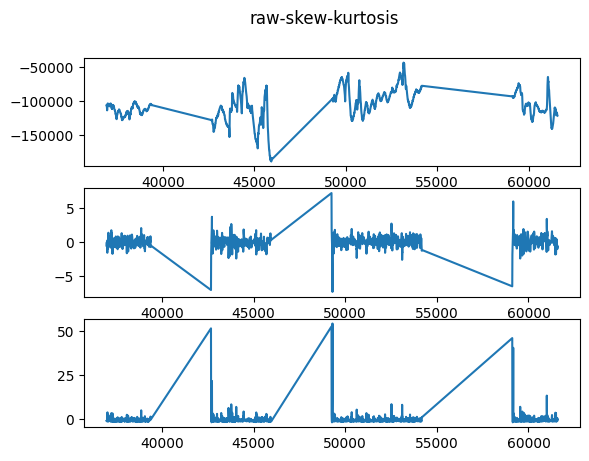

<Figure size 1200x800 with 0 Axes>

(M)011_20230507_120541_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 0.16891568274900304
ppg0 - kutosis -0.8523037097959083


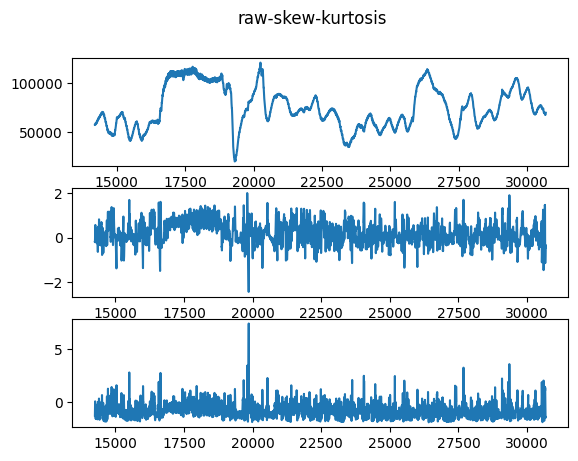

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.3228355309884481
ppg1 - kutosis -0.9435487357610843


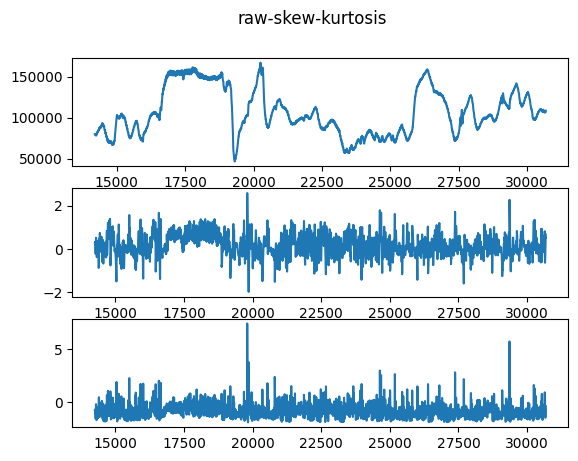

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.04014146659563705
ppg2 - kutosis -0.6162026199504065


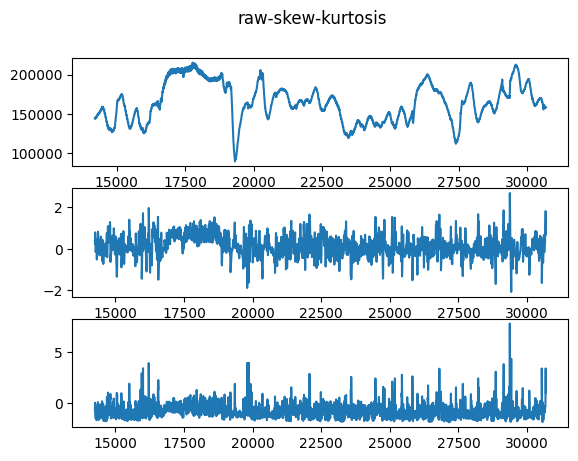

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 0.25984449256620457
ppg0 - kutosis -0.06866903223300103


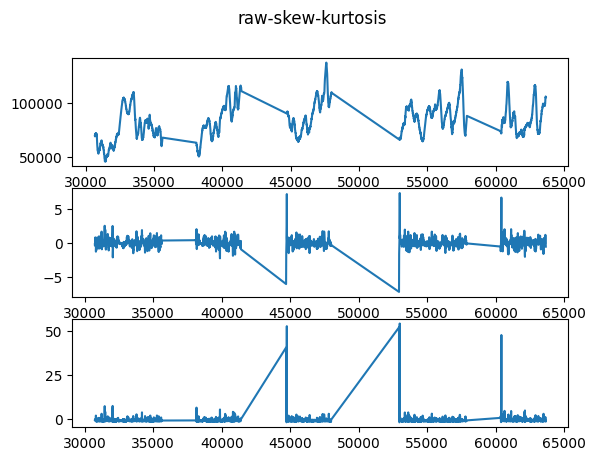

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.2345327031969903
ppg1 - kutosis -0.018264764833561653


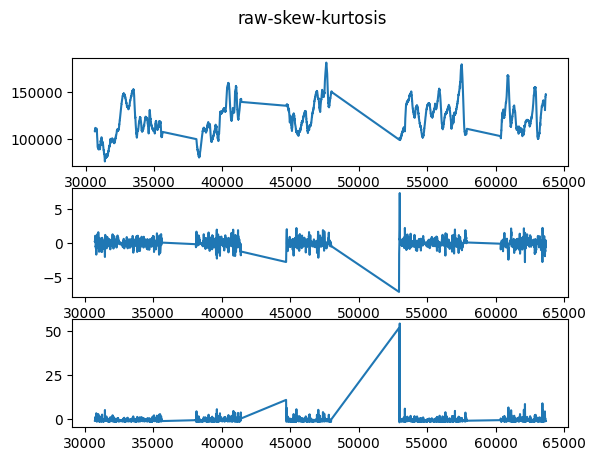

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.1912910774587011
ppg2 - kutosis -0.6186273627351802


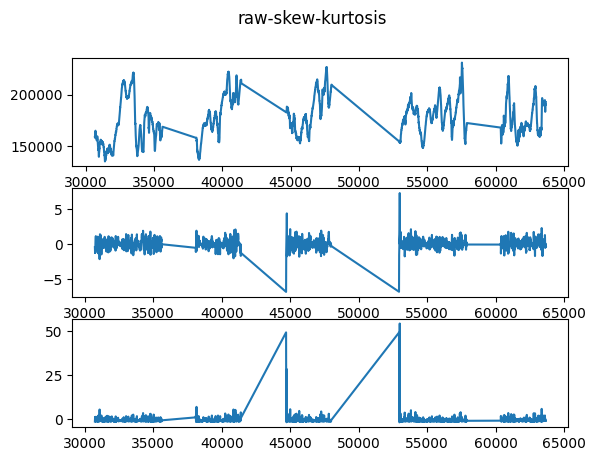

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.35572719816539355
ppg0 - kutosis 0.3964142021640318


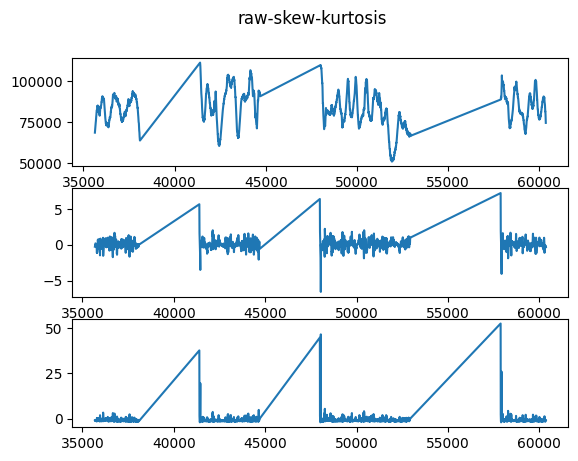

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.3018836311801345
ppg1 - kutosis -0.17664719902222537


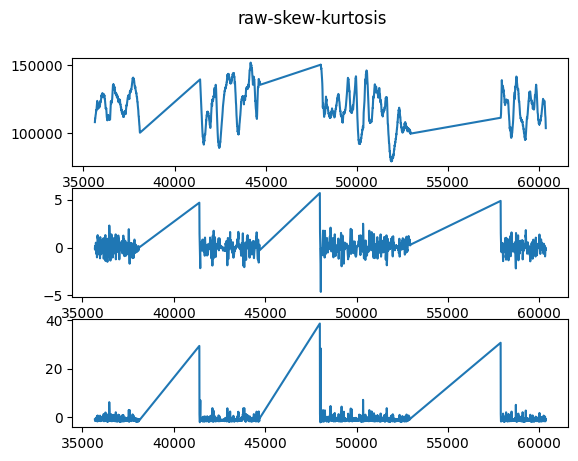

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.19017706792238157
ppg2 - kutosis -0.24457029859581114


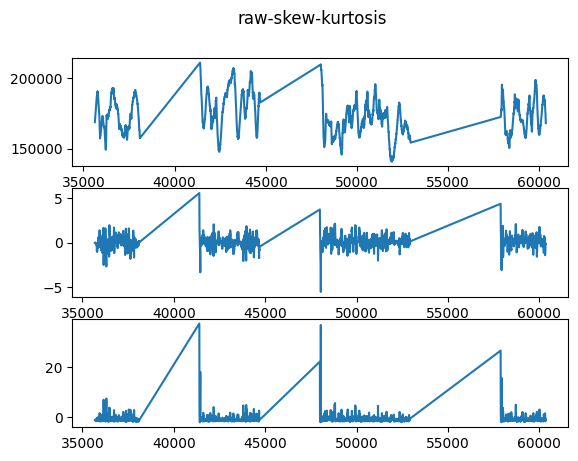

<Figure size 1200x800 with 0 Axes>

(M)012_20230507_093010_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 26.92902687845889
ppg0 - kutosis 886.1393217901923


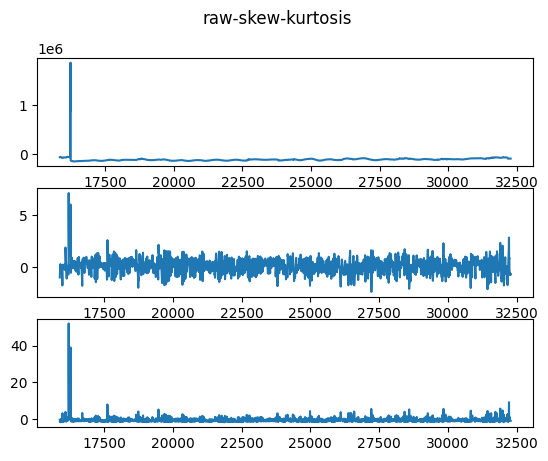

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 28.64441692686754
ppg1 - kutosis 966.4532368186015


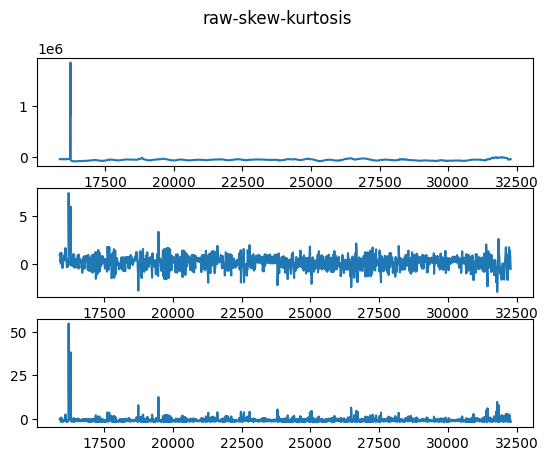

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 27.687890368404183
ppg2 - kutosis 918.5428944947834


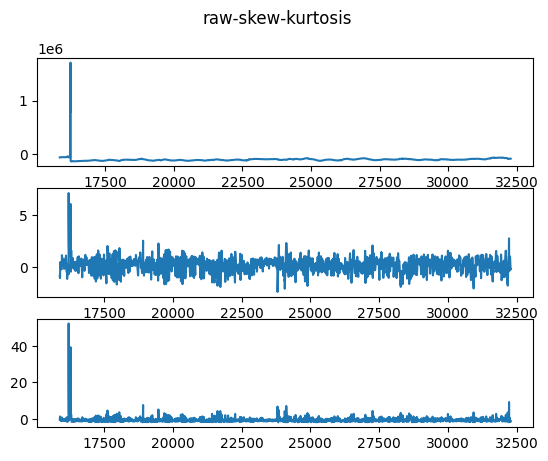

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 23.618343388701298
ppg0 - kutosis 645.8815293131679


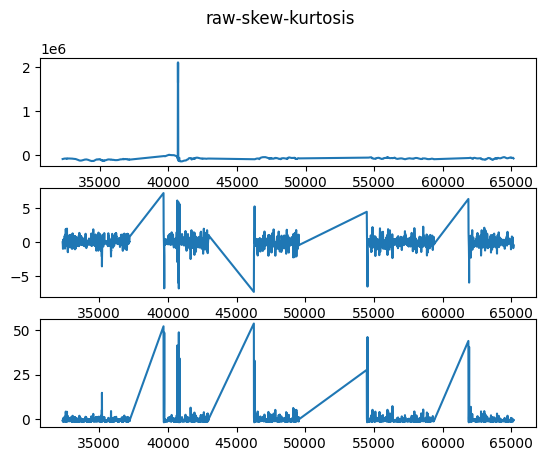

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 25.983915930744814
ppg1 - kutosis 734.0299287460188


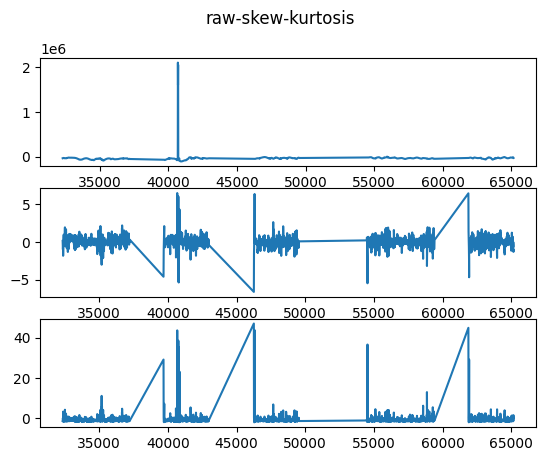

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 25.20796111257047
ppg2 - kutosis 707.1814566658124


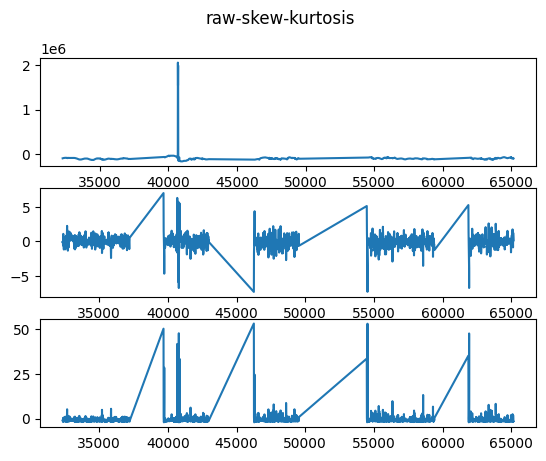

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew 22.0553678843338
ppg0 - kutosis 550.3871508297568


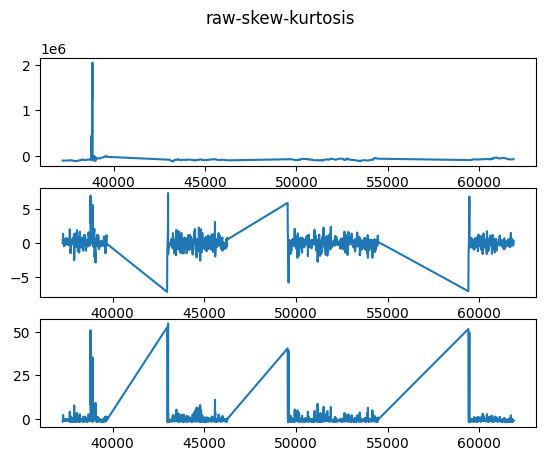

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 21.628013183777306
ppg1 - kutosis 536.818981814564


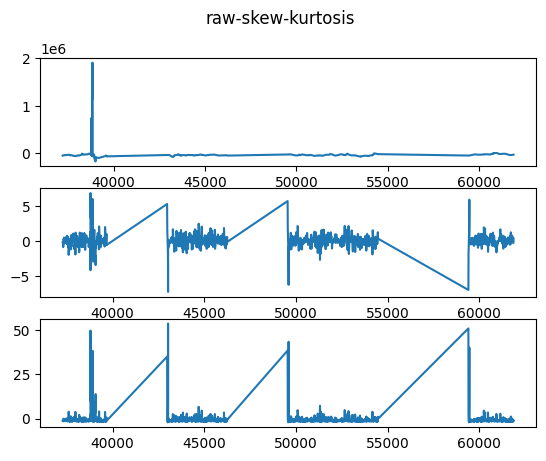

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 21.48703935883841
ppg2 - kutosis 521.691396694132


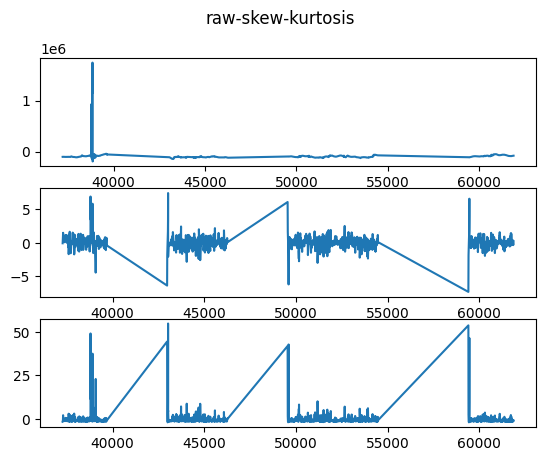

<Figure size 1200x800 with 0 Axes>

(M)013_20230507_113448_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew -1.4191495087977175
ppg0 - kutosis 6.972910174058633


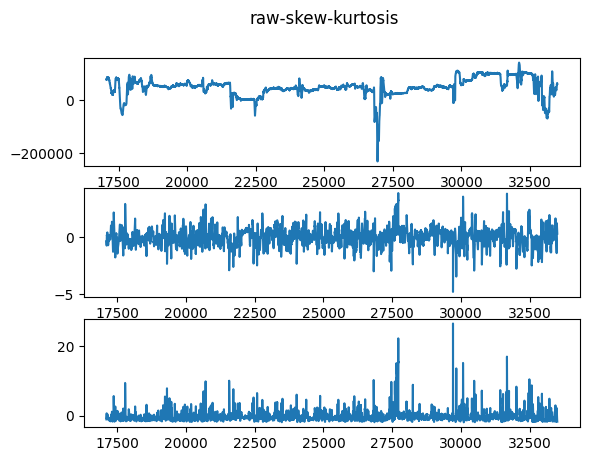

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.11587534758097427
ppg1 - kutosis 1.62191039318179


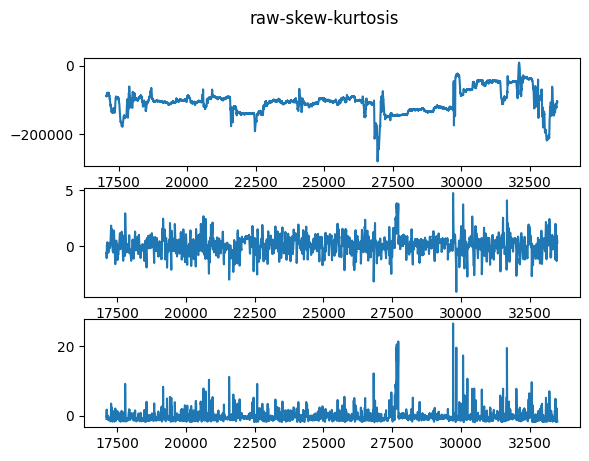

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -2.7549395896130595
ppg2 - kutosis 16.10664811172807


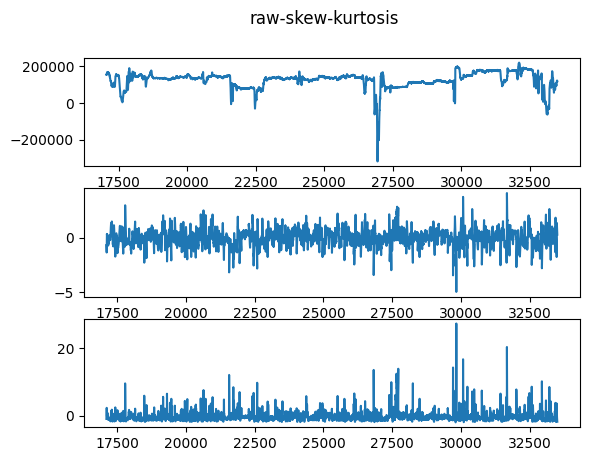

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 2.0122283012829354
ppg0 - kutosis 14.61900731650227


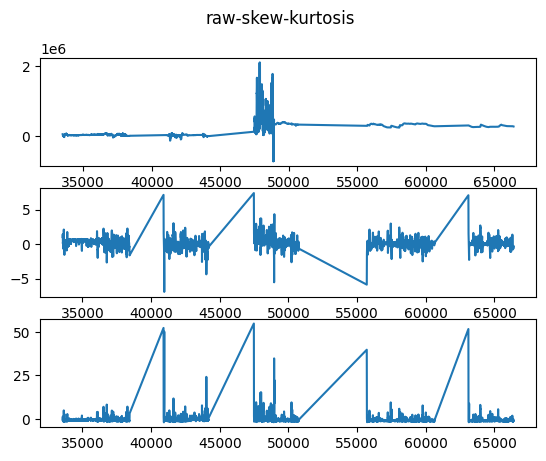

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.9796634378910989
ppg1 - kutosis 4.578956443681991


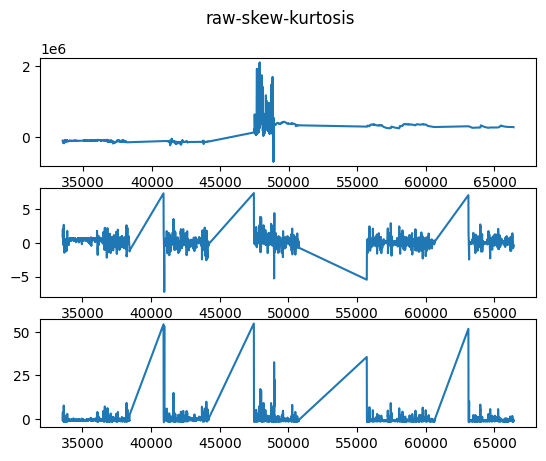

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 2.597441457995287
ppg2 - kutosis 22.61893487060607


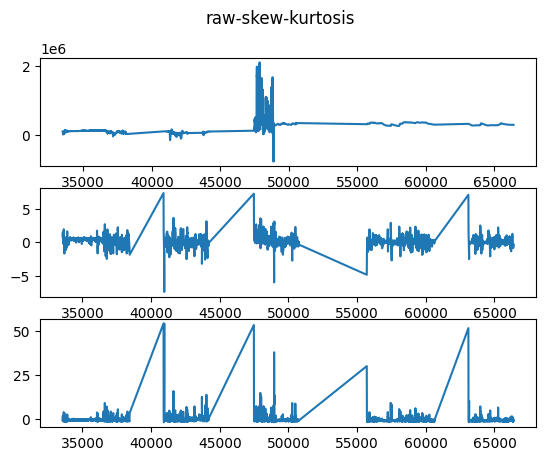

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.32979694839779383
ppg0 - kutosis 7.754284672673428


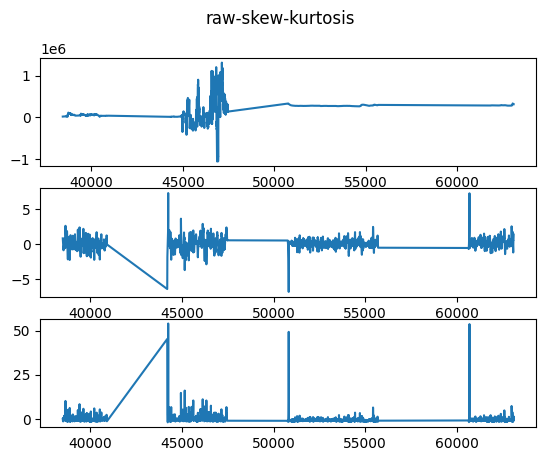

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.40872160950397207
ppg1 - kutosis 2.351979082596354


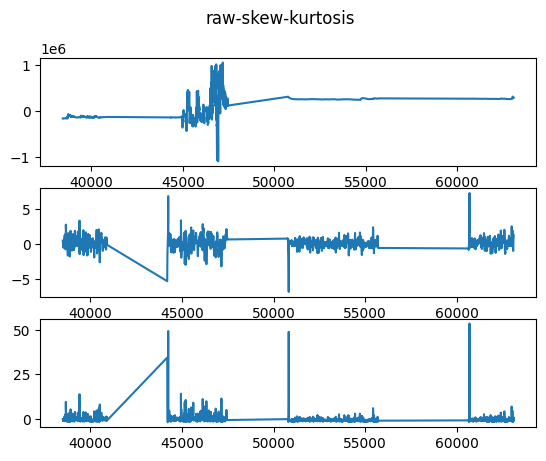

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -1.5107373216316509
ppg2 - kutosis 10.135958649117011


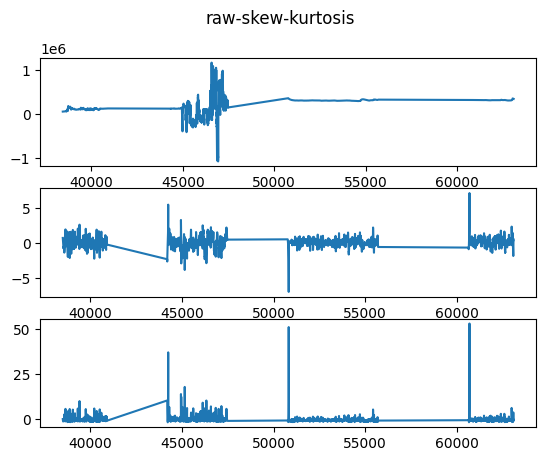

<Figure size 1200x800 with 0 Axes>

(M)014_20230507_095721_Verity.csv
Value is nan
(M)016_20230507_085913_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 0.7139148158902681
ppg0 - kutosis 0.4921109029457611


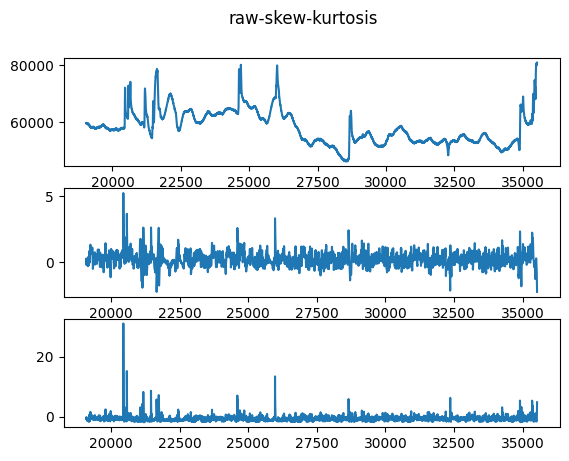

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.5755772526869883
ppg1 - kutosis -0.06870652680288414


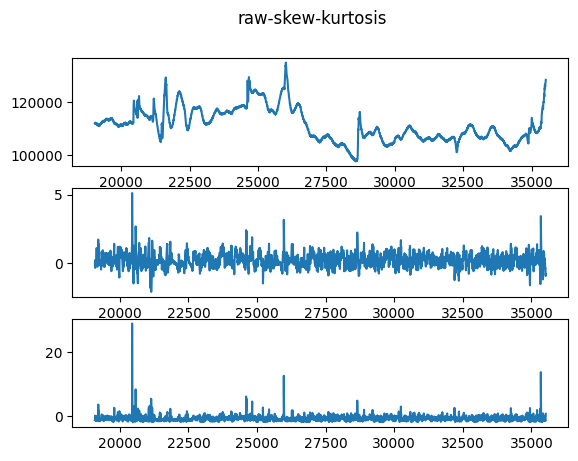

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.10118214017853881
ppg2 - kutosis -1.5341248274985972


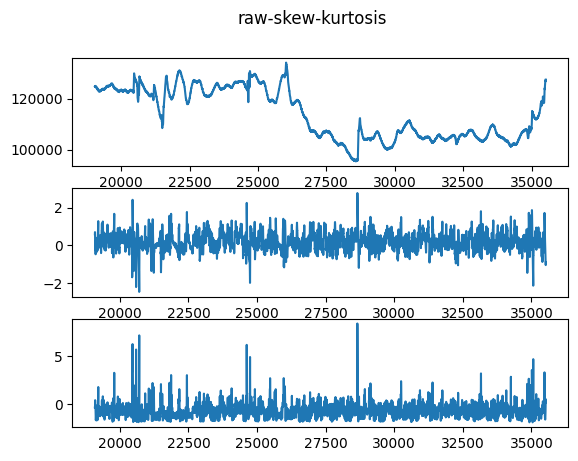

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 0.5992529060151307
ppg0 - kutosis 0.07925379504905239


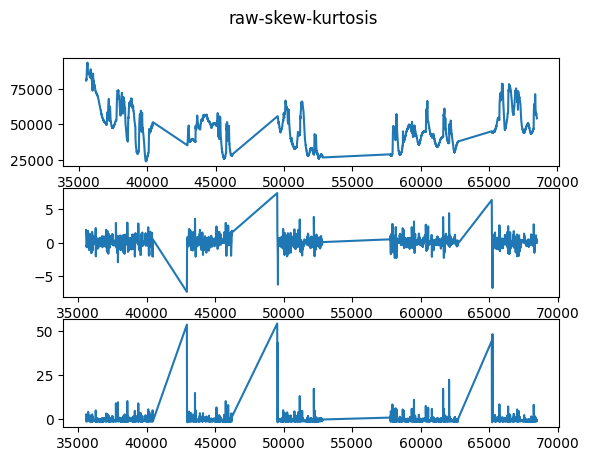

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.8667405258555783
ppg1 - kutosis 0.6002038143575468


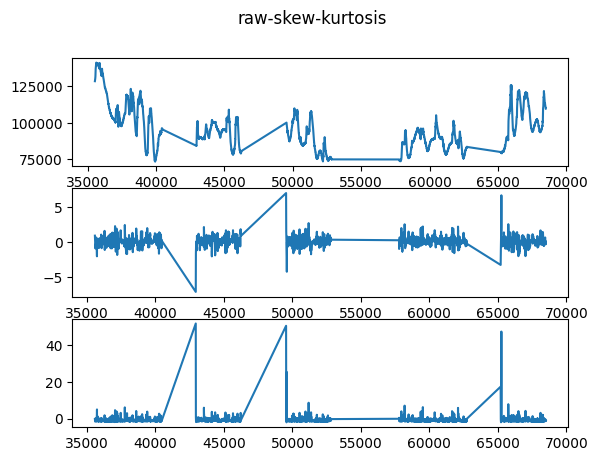

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.8671474671637446
ppg2 - kutosis 0.8799701545806067


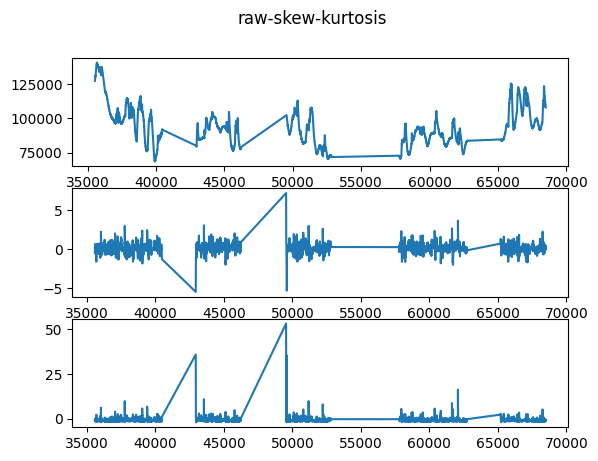

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.12010673446212708
ppg0 - kutosis -0.5011693498819096


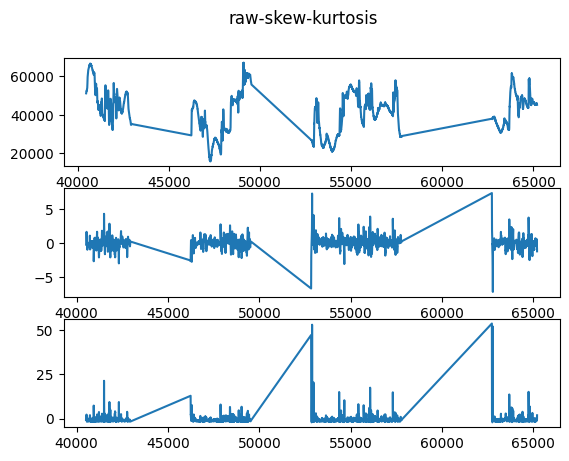

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.29154489290370367
ppg1 - kutosis 0.01885487199496305


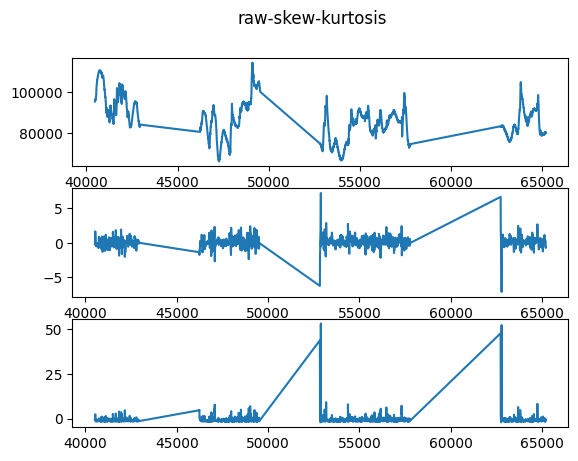

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.032989173745822414
ppg2 - kutosis 0.3867982829831953


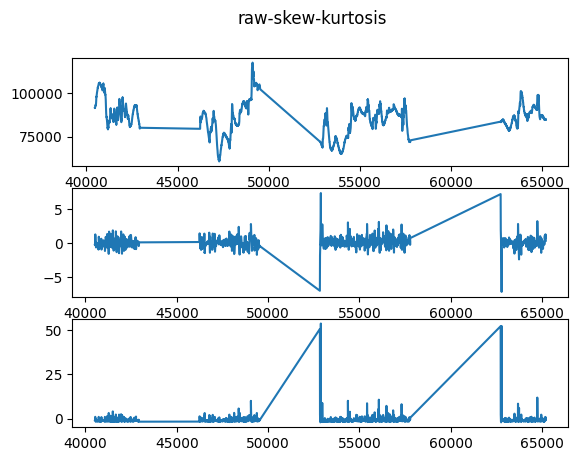

<Figure size 1200x800 with 0 Axes>

(M)017_20230507_110427_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 1.8904959304856994
ppg0 - kutosis 4.739060333289653


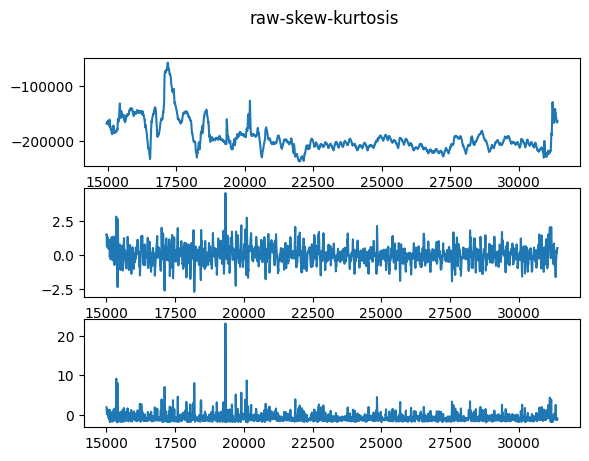

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.8193980252200644
ppg1 - kutosis 2.482547041319947


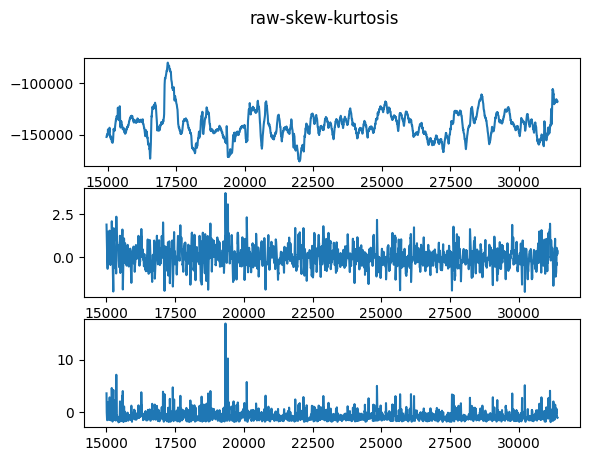

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 1.4728243544743884
ppg2 - kutosis 3.854566904211774


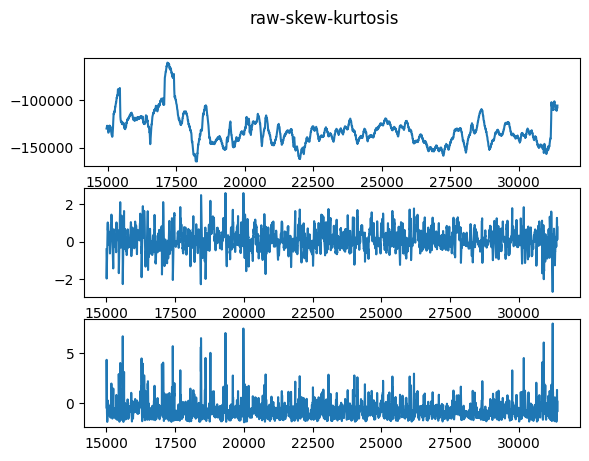

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew -0.24909428671086145
ppg0 - kutosis -0.6077308911164612


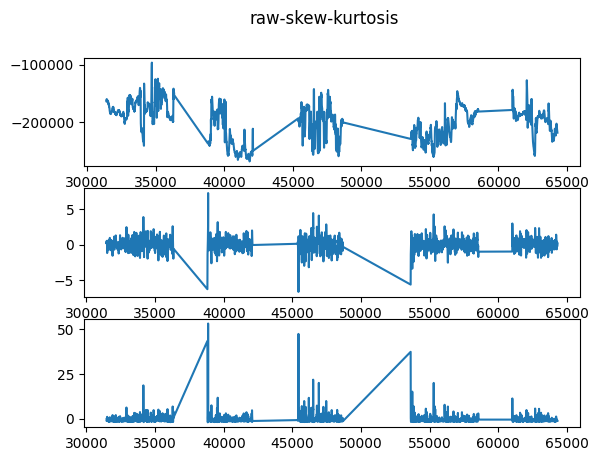

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.3735170190192643
ppg1 - kutosis -0.5082910169939461


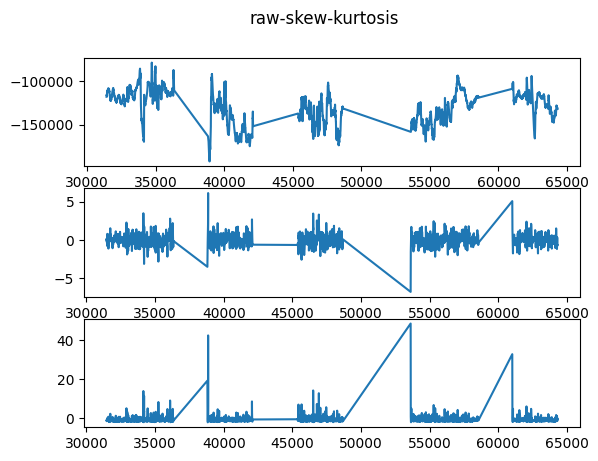

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.3366276751146618
ppg2 - kutosis 0.9132262370186606


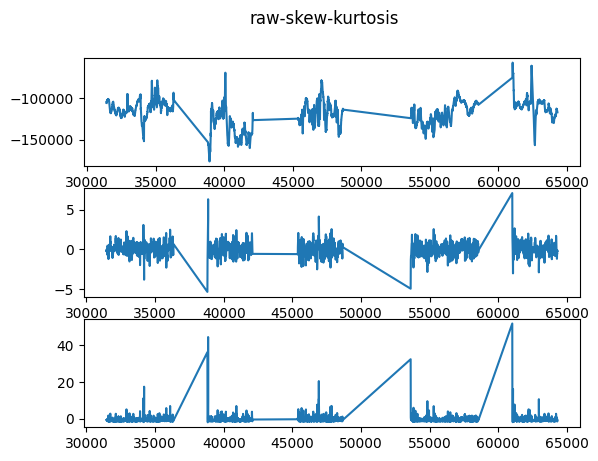

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.24568759003467244
ppg0 - kutosis -0.49187959985290286


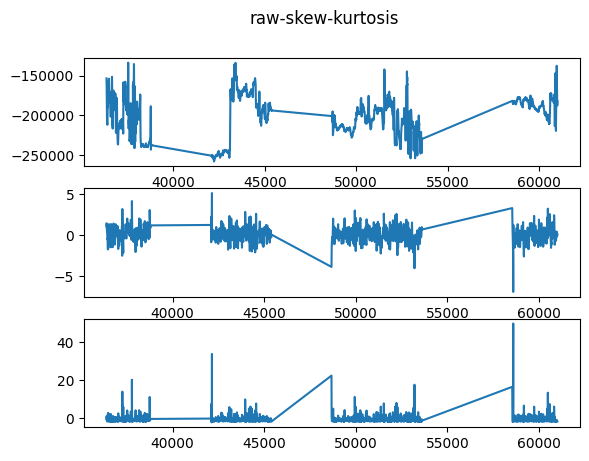

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.38825021382803576
ppg1 - kutosis -0.21874487067576132


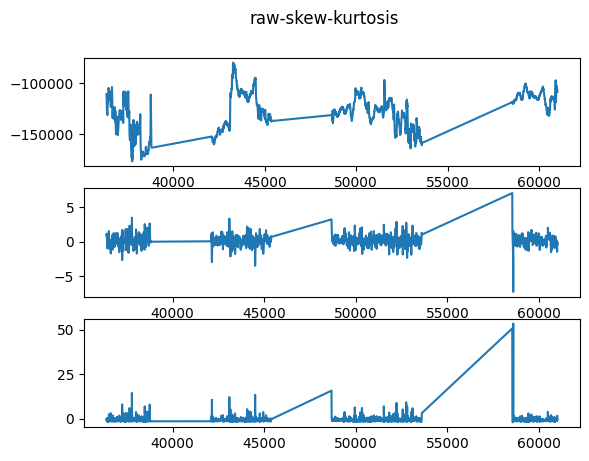

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.8317574238810708
ppg2 - kutosis 1.2236535304482192


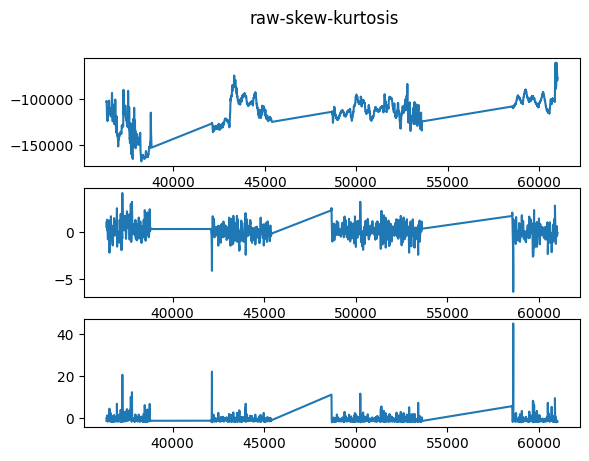

<Figure size 1200x800 with 0 Axes>

(M)018_20230507_100932_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew -0.0032600579937191207
ppg0 - kutosis 0.03182448082455025


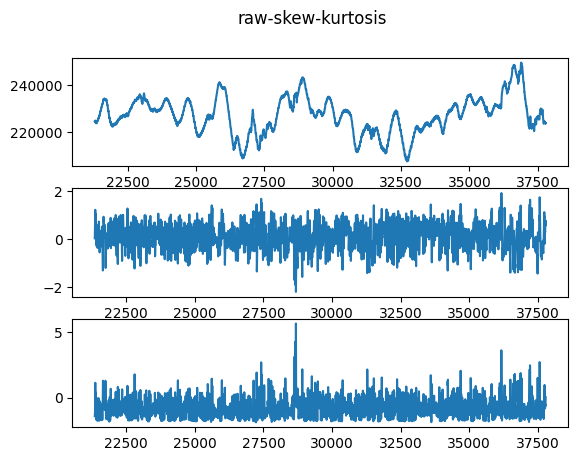

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.10175048529470361
ppg1 - kutosis -0.12185310776313729


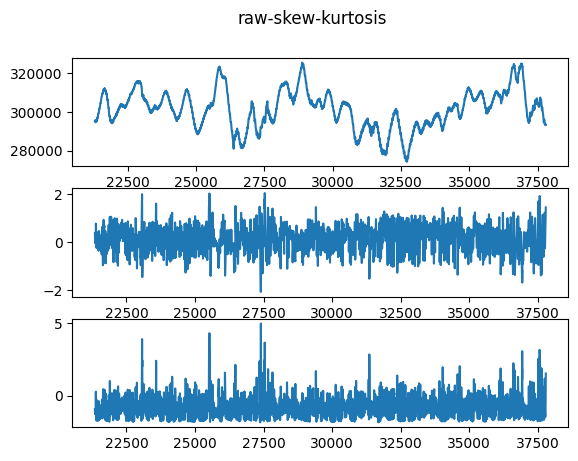

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.07293122631267429
ppg2 - kutosis -0.05550730480739352


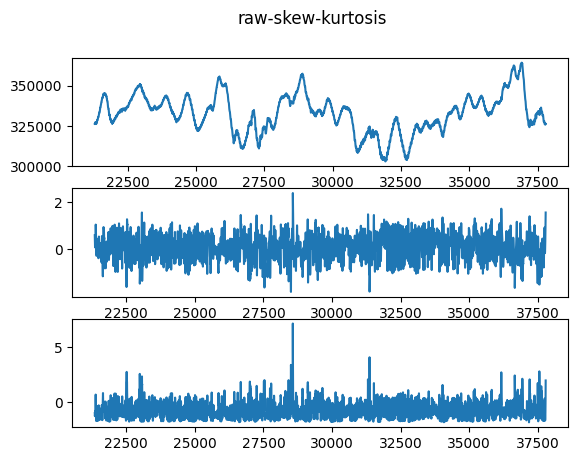

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew -1.2005859234071894
ppg0 - kutosis -0.35611875509182145


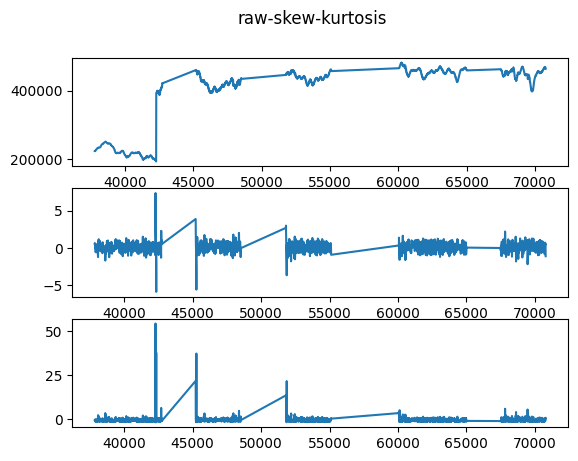

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -1.167318245789645
ppg1 - kutosis -0.4000128240766121


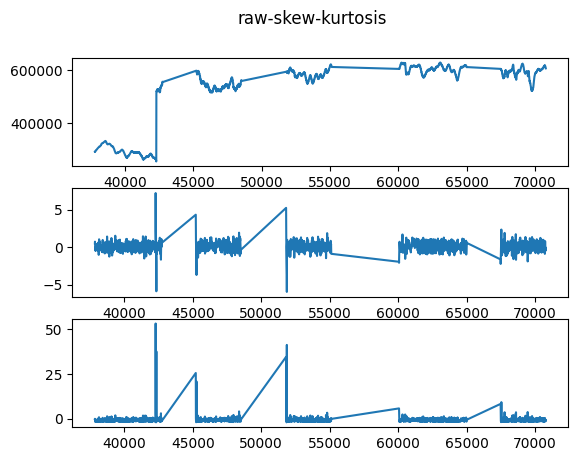

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -1.2090989497621176
ppg2 - kutosis -0.34519185609324055


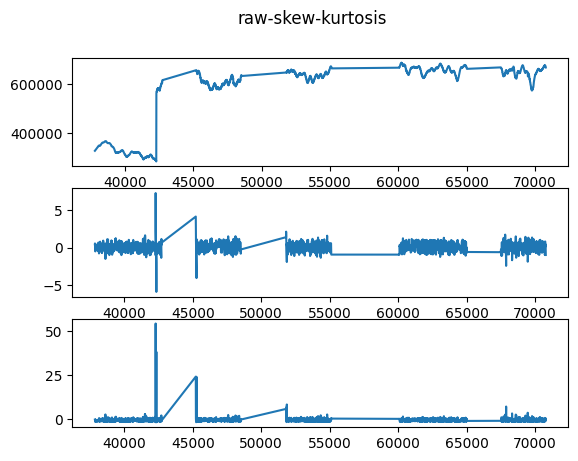

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -0.7078333144389488
ppg0 - kutosis 0.4321005060999292


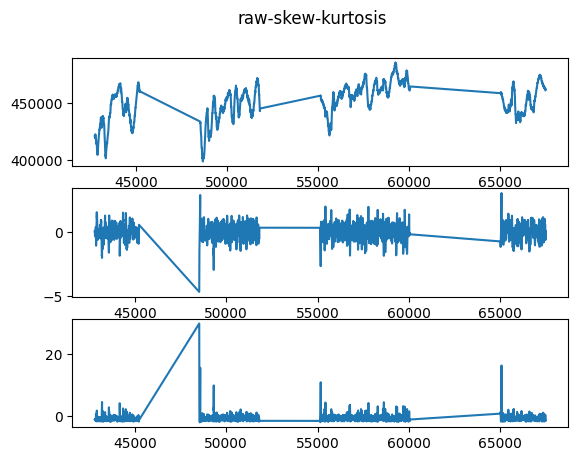

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.6710339147271159
ppg1 - kutosis 0.464928194318571


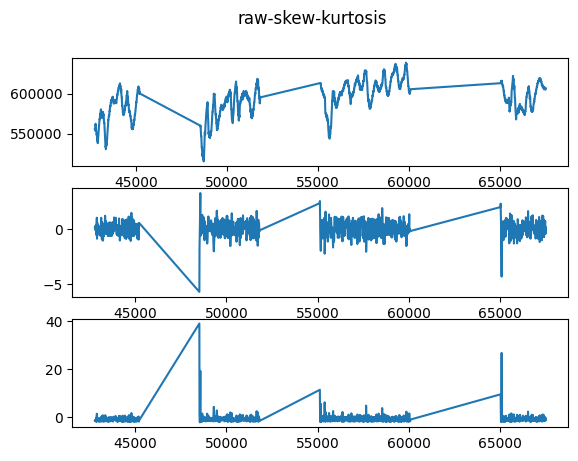

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.5557558614880452
ppg2 - kutosis 0.12175670350817347


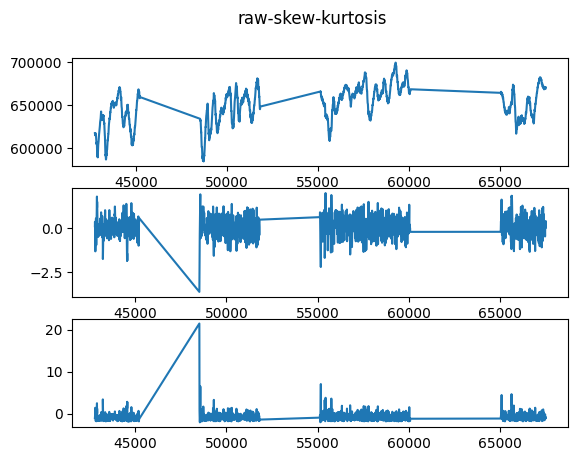

<Figure size 1200x800 with 0 Axes>

(M)019_20230507_101420_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew -1.1205112556225048
ppg0 - kutosis 0.9625251947075979


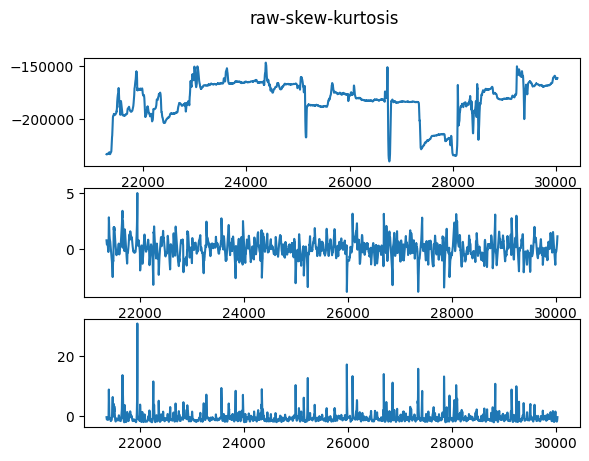

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -1.4376877556889138
ppg1 - kutosis 1.8290374959552755


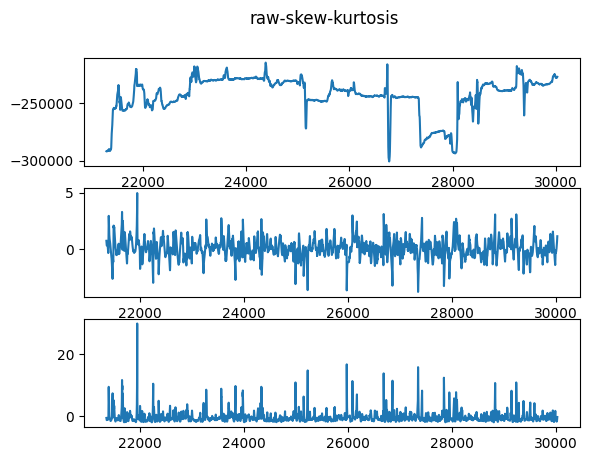

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.8786252017036443
ppg2 - kutosis 0.39910864356426856


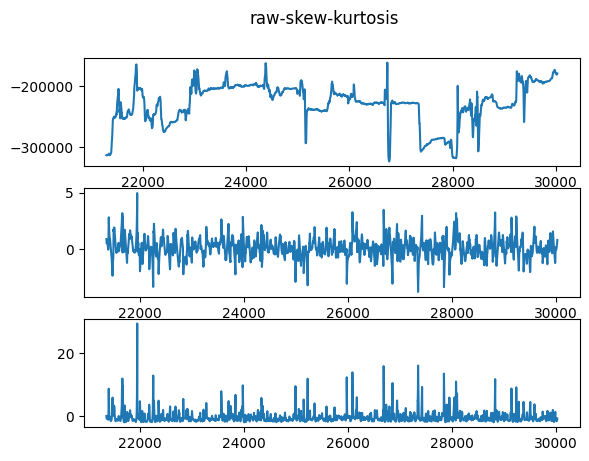

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew 1.497125366023969
ppg0 - kutosis 1.679835747222909


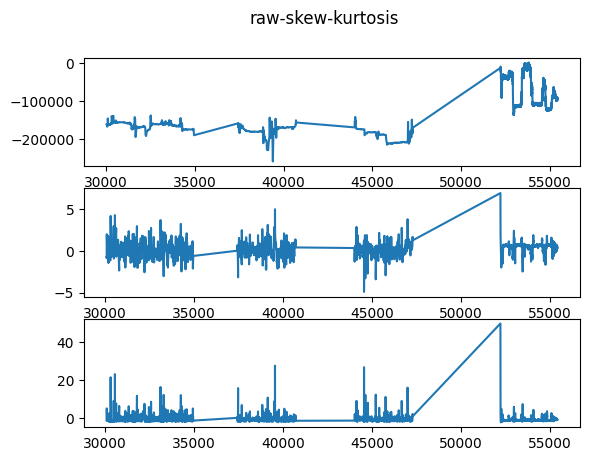

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 1.4855655855566834
ppg1 - kutosis 0.936527719699662


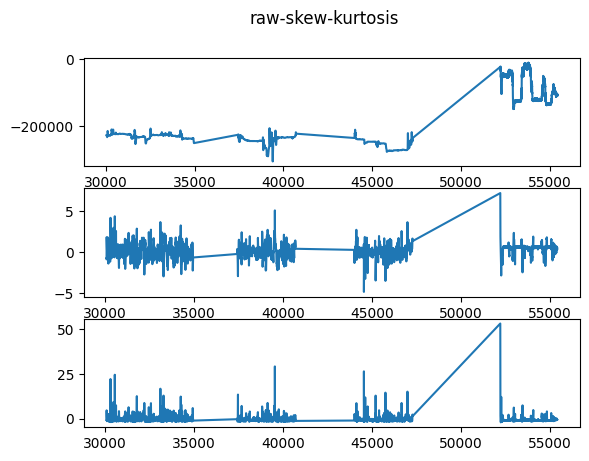

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.8621239331888064
ppg2 - kutosis 0.711901121580286


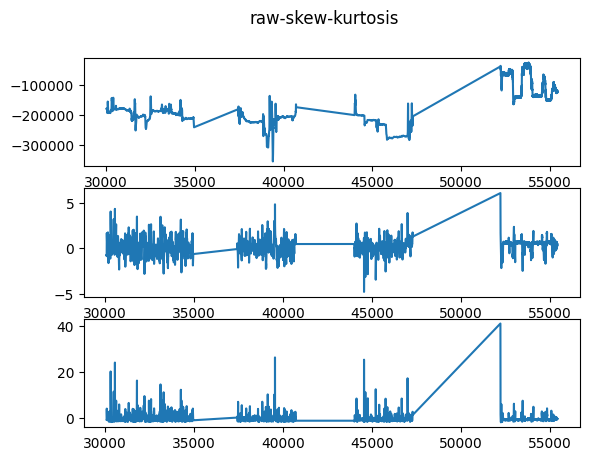

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew 0.7021029691223936
ppg0 - kutosis 0.9136038182302824


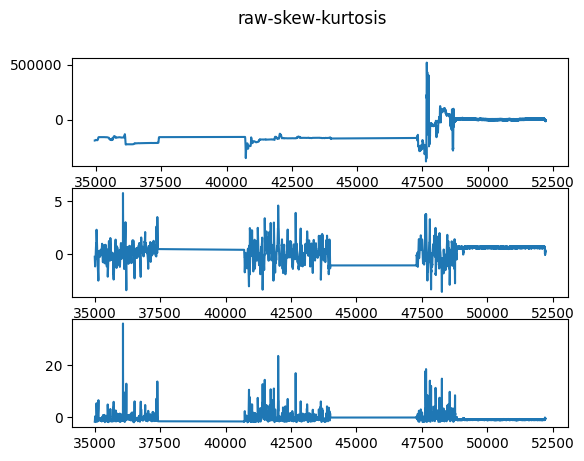

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.711693512370179
ppg1 - kutosis -0.1576610751028813


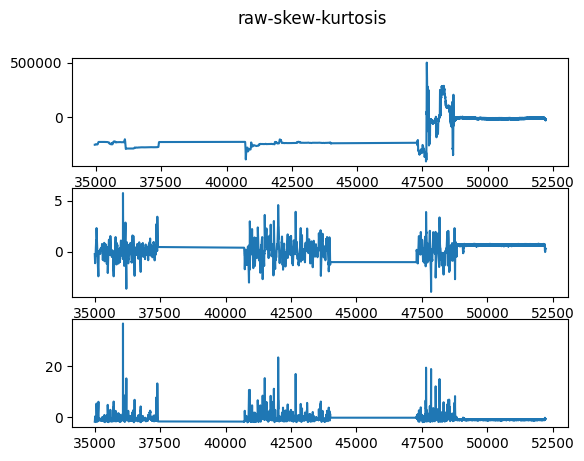

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.1448043138598237
ppg2 - kutosis -0.6677196419912383


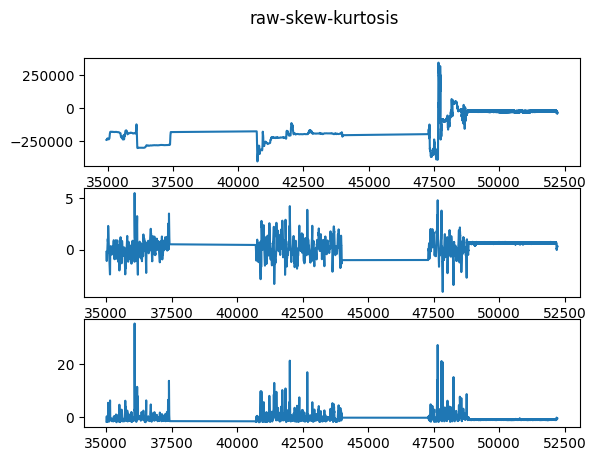

<Figure size 1200x800 with 0 Axes>

(M)020_20230507_122941_Verity.csv
Value is nan
1.0
프로토콜: 1.0 BASELINE
ppg0 - skew 1.0136670895940725
ppg0 - kutosis 2.6281677713830085


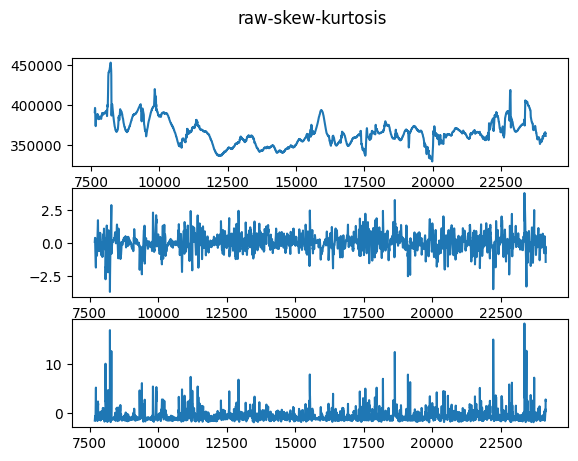

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.539399559961412
ppg1 - kutosis 0.6253465357173993


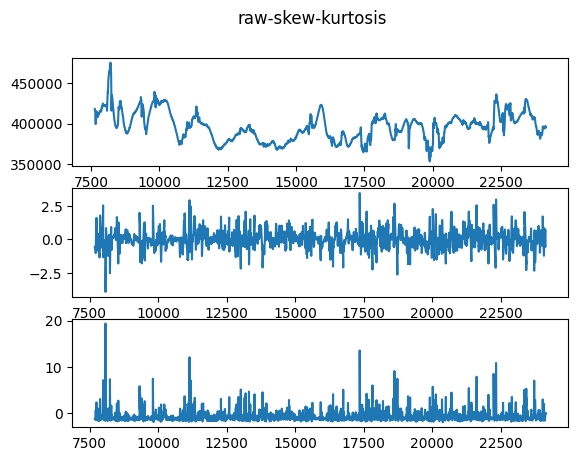

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.524578427796993
ppg2 - kutosis 0.031644838336924774


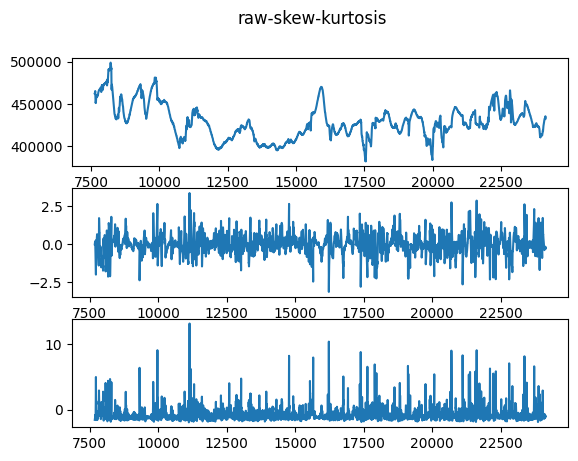

<Figure size 1200x800 with 0 Axes>

2.0
프로토콜: 2.0 HIT
ppg0 - skew -0.2679399035896787
ppg0 - kutosis -0.3038592338934545


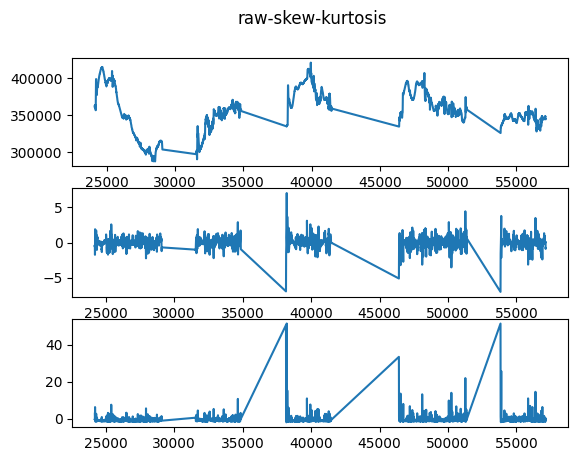

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.893609335102074
ppg1 - kutosis -0.023128970820157857


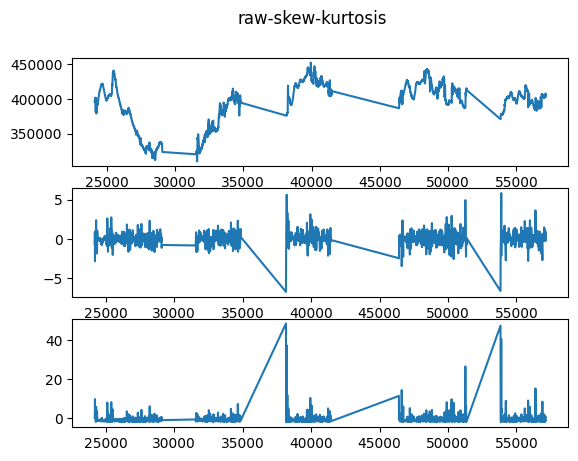

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.4184517795789692
ppg2 - kutosis -0.09063282701888475


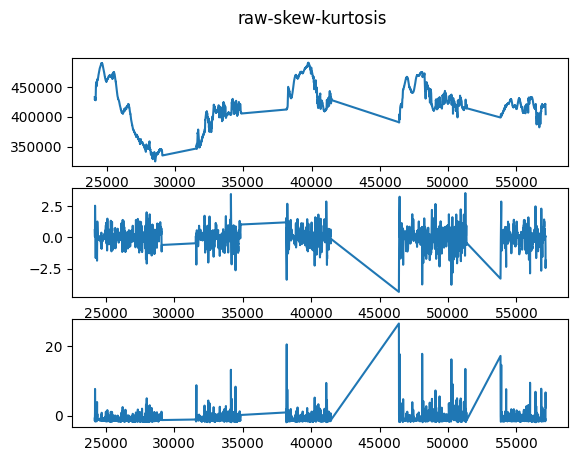

<Figure size 1200x800 with 0 Axes>

3.0
프로토콜: 3.0 MA
ppg0 - skew -1.1274768055342088
ppg0 - kutosis 0.011222192058149005


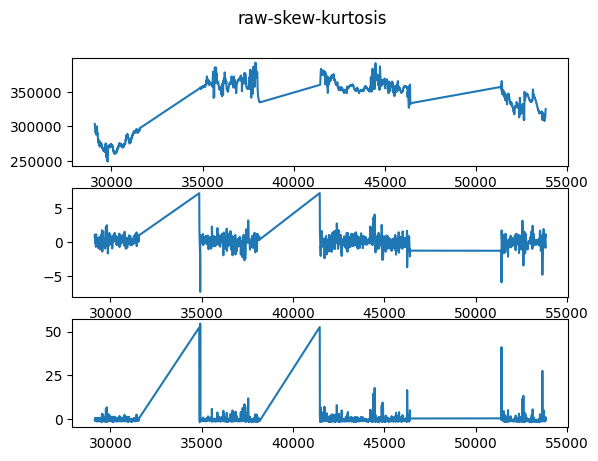

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -1.2350089343479131
ppg1 - kutosis 0.163426054724924


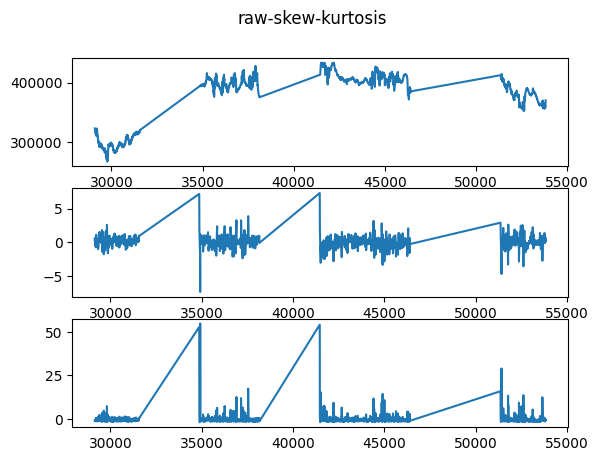

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -1.2373334575700699
ppg2 - kutosis 0.16102779510580145


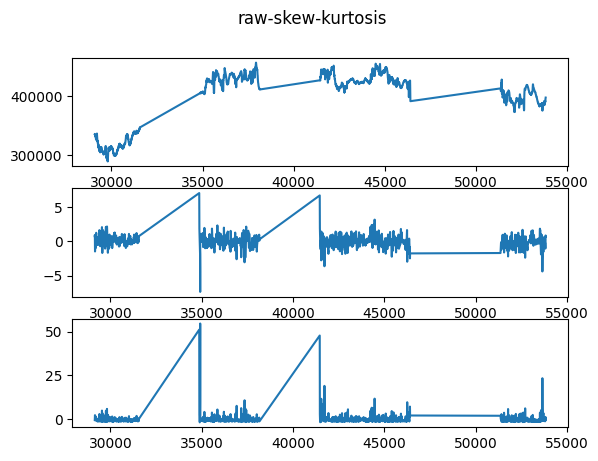

<Figure size 1200x800 with 0 Axes>

In [15]:
for i in mast_verity_dict:
    print(i)
    for p in mast_verity_dict[i]['proc'].unique():
        if np.isnan(p):
            print('Value is nan')
            pass
        else:
            print(p)
            print('프로토콜:', p, MAST_PROTOCOL_NAME[p])
               
            signals = mast_verity_dict[i][mast_verity_dict[i]['proc'] == p][['ppg0', 'ppg1', 'ppg2']]
            ambient = mast_verity_dict[i][mast_verity_dict[i]['proc'] == p]['ambient']    
            try:
                for j in signals:
                    print(j, '- skew', scipy.stats.skew(signals[j]))
                    print(j, '- kutosis', scipy.stats.kurtosis(signals[j]))
                    fig, axs = plt.subplots(3)
                    fig.suptitle('raw-skew-kurtosis')
                    plt.figure(figsize=(15, 10), dpi=80)

                    axs[1].plot(pd.DataFrame(signals[j]).rolling(window = 55).skew())
                    axs[2].plot(pd.DataFrame(signals[j]).rolling(window = 55).kurt())
                    axs[0].plot(signals[j])
                    plt.show()
            except:
                print(' VALUE ERROR')
                print('-'*30)
                pass
        

In [16]:
print('피험자 수:', len(mast_verity_dict), '명')
fs = VERITY_FS
#cutoff Wn
# cutoff = [fs*0.03,fs/2*0.97]
cutoff = [1.5,3.5]
ts = 1/ fs
Nyq = fs / 2
# 파라미터 계수 N
order = 2

sos = signal.butter(order, cutoff, btype='bandpass', output = 'sos', fs = fs)

for i in mast_verity_dict:
    print(i)
    
    raws = mast_verity_dict[i][['ppg0', 'ppg1', 'ppg2', 'ambient']]
    
    # data resampling
    sample_rate = VERITY_FS
    resample_scale = 10
    resampled_signals = resample(raws, len(raws) * resample_scale)
    resample_length = len(resampled_signals)
    resample_rate = sample_rate * resample_scale    

    ambient = mast_verity_dict[i]['ambient'] - mast_verity_dict[i]['ambient'].mean()

    signal_0 = mast_verity_dict[i]['ppg0'] - mast_verity_dict[i]['ambient']
    signal_1 = mast_verity_dict[i]['ppg1'] - mast_verity_dict[i]['ambient']
    signal_2 = mast_verity_dict[i]['ppg2'] - mast_verity_dict[i]['ambient']

    signal_0_avdc = mast_verity_dict[i]['ppg0'] - mast_verity_dict[i]['ppg0'].mean() - ambient
    signal_1_avdc = mast_verity_dict[i]['ppg1'] - mast_verity_dict[i]['ppg1'].mean() - ambient
    signal_2_avdc = mast_verity_dict[i]['ppg2'] - mast_verity_dict[i]['ppg2'].mean() - ambient  

    signal_0_ffty=signal.detrend(signal_0)
    signal_1_ffty=signal.detrend(signal_1)
    signal_2_ffty=signal.detrend(signal_2)

    signal_0_filtered = signal.sosfilt(sos, signal_0_ffty)
    signal_1_filtered = signal.sosfilt(sos, signal_0_ffty)
    signal_2_filtered = signal.sosfilt(sos, signal_0_ffty)             

    print(signals_0)
    
#     signals = 
    
#     for p in mast_verity_dict[i]['proc'].unique():
#         if np.isnan(p):
#             print('Value is nan')
#             pass
#         else:
#             print(p)
#             print('프로토콜:', p, MAST_PROTOCOL_NAME[p])
               
#             signals = mast_verity_dict[i][mast_verity_dict[i]['proc'] == p][['ppg0', 'ppg1', 'ppg2']]
            
#             try:
#                 for j in signals:
#                     print(j, '- skew', scipy.stats.skew(signals[j]))
#                     print(j, '- kutosis', scipy.stats.kurtosis(signals[j]))
#                     fig, axs = plt.subplots(3)
#                     fig.suptitle('raw-skew-kurtosis')
#                     plt.figure(figsize=(15, 10), dpi=80)

#                     axs[1].plot(pd.DataFrame(signals[j]).rolling(window = 55).skew())
#                     axs[2].plot(pd.DataFrame(signals[j]).rolling(window = 55).kurt())
#                     axs[0].plot(signals[j])
#                     plt.show()
#             except:
#                 print(' VALUE ERROR')
#                 print('-'*30)
#                 pass


    
    
#     fig, axs = plt.subplots(5)
#     fig.suptitle('Vertically stacked subplots')
#     plt.figure(figsize=(15, 10), dpi=80)

#     axs[0].plot(signal_0)
#     axs[0].plot(signal_1)
#     axs[0].plot(signal_2)
    
#     axs[1].plot(signal_0_avdc)
#     axs[1].plot(signal_1_avdc)
#     axs[1].plot(signal_2_avdc)
    
#     axs[2].plot(signal_0_ffty)
#     axs[2].plot(signal_1_ffty)
#     axs[2].plot(signal_2_ffty)
    
#     axs[3].plot(signal_0_filtered)
#     axs[3].plot(signal_1_filtered)
#     axs[3].plot(signal_2_filtered)
    
#     axs[4].plot(signal_0_filtered[6000:7000])
#     axs[4].plot(signal_1_filtered[6000:7000])
#     axs[4].plot(signal_2_filtered[6000:7000])
    
#     try:
#         for s in [[0, 10000], [10000, 20000], [20000, 30000], [30000, 40000], [40000, 50000]]:
#             wd, m = hp.process(signal_0_filtered[s[0]:s[1]], sample_rate = 550, 
#                                high_precision=True, clean_rr=True)
#             hp.plotter(wd, m, title = 'zoomed in section', figsize=(12,6))
#             hp.plot_poincare(wd, m)
#             plt.show()
#             for measure in m.keys():
#                 print('%s: %f' %(measure, m[measure]))
#     except:
#         print('안됨')
#         pass
                
    
#     plt.show()

피험자 수: 20 명


NameError: name 'VERITY_FS' is not defined

In [26]:
sample_rate = VERITY_FS
for i in mast_verity_dict:
    print(i)
    print('인덱스 길이:',len(mast_verity_dict[i]))
    
    signals = mast_verity_dict[i][['ppg0', 'ppg1', 'ppg2', 'ambient']]
    # signal_0 = mast_verity_dict[i]['ppg0']
    # signal_1 = mast_verity_dict[i]['ppg1']
    # signal_2 = mast_verity_dict[i]['ppg2']
    
    # data resampling
    resample_scale = 10
    resampled_signals = resample(signals, len(signals) * resample_scale)
    resample_length = len(resampled_signals)
    resample_rate = sample_rate * resample_scale
    
    for j in resampled_signals:
        #
        resampled_signals[j]
    
    signal_0_q1 = np.percentile(signal_0, 25)
    signal_0_q3 = np.percentile(signal_0, 75)
    signal_0_iqr = (signal_0_q3 - signal_0_q1)*1.5
    low0 = signal_0_q1 - signal_0_iqr
    high0 = signal_0_q3 + signal_0_iqr
    outlier_index = signal_0[(signal_0<low0) | (signal_0>high0)].index

    fig, axs = plt.subplots(2)
    fig.suptitle('Vertically stacked subplots')
    plt.figure(figsize=(15, 10), dpi=80)

    axs[0].plot(signal_0)
    print(len(outlier_index))
    signal_0.drop(outlier_index, axis = 0, inplace = True)
    print(len(signal_0))
    axs[1].plot(signal_0)
#     enhanced_signal_0 = hp.enhance_peaks(signal_0, iterations=3)
#     enhanced_signal_1 = hp.enhance_peaks(signal_1, iterations=3)
#     enhanced_signal_2 = hp.enhance_peaks(signal_2, iterations=3)
    
#     filtered_signal_0 = hp.filter_signal(signal_0, [0.05, 0.1 ], sample_rate=sample_rate, 
#                                          order=3, filtertype='bandpass')
    
# #     wd, m = hp.process(resampled, sample_rate = new_sample_rate, 
# #                        high_precision=True, clean_rr=True)

#     wd, m = hp.process(filtered_signal_0, sample_rate = sample_rate,
#                        high_precision = True, clean_rr = True)
#     hp.plotter(wd, m, figsize=(12,6))
#     hp.plot_poincare(wd, m)
#     plt.show()
#     for measure in m.keys():
#         print('%s: %f' %(measure, m[measure]))
    
#     # for s in [[0, 10000], [10000, 20000], [20000, 30000], [30000, 40000], [40000, 50000]]:
#     #     wd, m = hp.process(resampled[s[0]:s[1]], sample_rate = new_sample_rate, 
#     #                        high_precision=True, clean_rr=True)
#     #     hp.plotter(wd, m, title = 'zoomed in section', figsize=(12,6))
#     #     hp.plot_poincare(wd, m)
#     #     plt.show()
#     #     for measure in m.keys():
#     #         print('%s: %f' %(measure, m[measure]))
#     # plt.plot(filtered_signal_0)
# #     plt.plot(filtered_signal_0[0:int(sample_rate*60)])    
    
    plt.show()
    # filtered = hp.filtering.butter_bandpass(lowcut = 0.4, highcut = 3.7, sample_rate=55.0, order=3)

(M)001_20230507_093641_Verity.csv
인덱스 길이: 13854


IndexError: arrays used as indices must be of integer (or boolean) type

In [ ]:
for i in mast_verity_dict:
    print(i)
    print('인덱스 길이:',len(mast_verity_dict[i]))
    
    signal_0 = mast_verity_dict[i]['ppg0']
    signal_1 = mast_verity_dict[i]['ppg1']
    signal_2 = mast_verity_dict[i]['ppg2']
    
    # enhanced_signal_0 = hp.enhance_peaks(signal_0, iterations=2)
    # enhanced_signal_1 = hp.enhance_peaks(signal_1, iterations=2)
    # enhanced_signal_2 = hp.enhance_peaks(signal_2, iterations=2)
    
    filtered_signal_0 = hp.filter_signal(signal_0, [1.5, 3.5], sample_rate=VERITY_FS, 
                                         order=2, filtertype='bandpass')
    
    resampled = resample(filtered_signal_0, len(filtered_signal_0) * 10)

    #don't forget to compute the new sampling rate
    new_sample_rate = sample_rate * 10
    
    for s in [[0, 10000], [10000, 20000], [20000, 30000], [30000, 40000], [40000, 50000]]:
        wd, m = hp.process(resampled[s[0]:s[1]], sample_rate = new_sample_rate, 
                           high_precision=True, clean_rr=True)
        hp.plotter(wd, m, title = 'zoomed in section', figsize=(12,6))
        hp.plot_poincare(wd, m)
        plt.show()
        for measure in m.keys():
            print('%s: %f' %(measure, m[measure]))